In [1]:
import pandas as pd
import polars as pl
import numpy as np
import os
import logging
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score

In [2]:
def color_scale(val):
    color = plt.cm.viridis(val / 100)  # Usar colormap viridis
    return f'background-color: rgba({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)}, {color[3]})'

In [3]:
logging.basicConfig()
logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)

In [4]:
os.chdir("/home/sagemaker-user/data-bbog-integration-fabrica-personas/src")
import data_bbog_integration_fabrica_personas.pipelines.backtesting.nodes as backtesting
import data_bbog_integration_fabrica_personas.pipelines.models.nodes as models
import data_bbog_integration_fabrica_personas.pipelines.model_selection.nodes as ms

In [5]:
%load_ext kedro.ipython

[01/29/25 18:51:50] INFO     Resolved project path as:                                              ]8;id=880941;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=379377;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#139\139]8;;\
                             /home/sagemaker-user/data-bbog-integration-fabrica-personas.                          
                             To set a different path, run '%reload_kedro <project_root>'                           

[01/29/25 18:51:50] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=517491;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=628724;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/data_catalog.py:301: KedroDeprecationWarning:                        
                             Defining the 'layer' attribute at the top level is deprecated and will                
                             be removed in Kedro 0.19.0. Please move 'layer' inside the 'metadata'                 
                             -> 'kedro-viz' attributes. See                                                        
                             https://docs.kedro.org/en/latest/visualisation/kedro-viz_visualisation                
                             .html#visualise-layers for more information.                                          
                               warnings.warn(                                                                      
                                                                                                                   

                    WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=460463;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=29575;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/__init__.py:44: KedroDeprecationWarning:                             
                             'AbstractDataSet' has been renamed to 'AbstractDataset', and the alias                
                             will be removed in Kedro 0.19.0                                                       
                               return getattr(kedro.io.core, name)                                                 
                                                                                                                   

                    WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=474952;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=498475;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/data_catalog.py:301: KedroDeprecationWarning:                        
                             Defining the 'layer' attribute at the top level is deprecated and will                
                             be removed in Kedro 0.19.0. Please move 'layer' inside the 'metadata'                 
                             -> 'kedro-viz' attributes. See                                                        
                             https://docs.kedro.org/en/latest/visualisation/kedro-viz_visualisation                
                             .html#visualise-layers for more information.                                          
                               warnings.warn(                                                                      
                                                                                                                   

                    WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=332401;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=734138;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/data_catalog.py:301: KedroDeprecationWarning:                        
                             Defining the 'layer' attribute at the top level is deprecated and will                
                             be removed in Kedro 0.19.0. Please move 'layer' inside the 'metadata'                 
                             -> 'kedro-viz' attributes. See                                                        
                             https://docs.kedro.org/en/latest/visualisation/kedro-viz_visualisation                
                             .html#visualise-layers for more information.                                          
                               warnings.warn(                                                                      
                                                                                                                   

[01/29/25 18:51:51] INFO     Kedro project data-bbog-integration-fabrica-personas                   ]8;id=291890;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=621812;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#108\108]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=421013;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=31917;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#109\109]8;;\
                             'pipelines'                                                                           

In [6]:
%reload_kedro

                    INFO     Resolved project path as:                                              ]8;id=150983;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=456081;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#139\139]8;;\
                             /home/sagemaker-user/data-bbog-integration-fabrica-personas.                          
                             To set a different path, run '%reload_kedro <project_root>'                           

[01/29/25 18:51:51] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=188842;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=824261;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/data_catalog.py:301: KedroDeprecationWarning:                        
                             Defining the 'layer' attribute at the top level is deprecated and will                
                             be removed in Kedro 0.19.0. Please move 'layer' inside the 'metadata'                 
                             -> 'kedro-viz' attributes. See                                                        
                             https://docs.kedro.org/en/latest/visualisation/kedro-viz_visualisation                
                             .html#visualise-layers for more information.                                          
                               warnings.warn(                                                                      
                                                                                                                   

                    WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=216083;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=25714;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/__init__.py:44: KedroDeprecationWarning:                             
                             'AbstractDataSet' has been renamed to 'AbstractDataset', and the alias                
                             will be removed in Kedro 0.19.0                                                       
                               return getattr(kedro.io.core, name)                                                 
                                                                                                                   

                    INFO     Kedro project data-bbog-integration-fabrica-personas                   ]8;id=983764;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=763057;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#108\108]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=724602;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=454706;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#109\109]8;;\
                             'pipelines'                                                                           

In [7]:
params1= catalog.list
params= catalog.load("parameters")

                    INFO     Loading data from 'parameters' (MemoryDataset)...                  ]8;id=149842;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=514729;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

## Caracteres:

In [8]:
df1 = catalog.load('feature_selected_list_experimento_1_y_2') # codigo por default

                    INFO     Loading data from 'feature_selected_list_experimento_1_y_2'        ]8;id=580370;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=299745;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (ParquetDataSet)...                                                                   

In [9]:
df2 = catalog.load('feature_selected_list_experimento_3_y_4') # codigo por default cambiando la homologacion de caracteres

                    INFO     Loading data from 'feature_selected_list_experimento_3'            ]8;id=926459;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=371053;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (ParquetDataSet)...                                                                   

In [10]:
pd.concat([df1.set_index('Feature'),df2.set_index('Feature')],axis = 1) # la homologacion de caracteres no hizo efecto

,Importance,Importance
Feature,,
periodo,0.116894,0.113727
ah_sum_monto_trx_credito_mean_3,0.051987,0.058209
ld_sum_pago_mes,0.045218,0.037993
ah_sum_monto_trx_credito_mean_6,0.038141,0.041452
grupo_etario,0.034491,0.033998
ld_sum_intereses,0.032110,0.028037
ah_sum_cantidad_trx_credito,0.030338,0.025124
num_prod_pasivos,0.029849,0.029429
ah_sum_monto_trx_credito_mean_2,0.025853,0.037706


In [19]:
# Feature selection MVP4
model_scale = pd.read_parquet('s3://data-bbog-dev-sandbox-entity/casos-uso/fabrica-personas/TC/04-feature/TC/masivo/feature_selected_list_TC_prueba.parquet')
model_scale

,Feature,Importance
70,tc_target_ap_shift__1,0.507264
35,ah_sum_monto_trx_debito_std_3,0.112393
40,ah_sum_monto_trx_debito_std_6,0.086413
43,tc_cant_prev,0.085275
91,delta_ah_sum_monto_trx_debito,0.047857
42,tc_cant,0.031249
92,delta_tc_sum_facturacion_total,0.014439
46,ah_cant,0.012502
47,ah_cant_prev,0.010750
39,ah_sum_monto_trx_debito_mean_6,0.007871


In [20]:
pd.concat([df1.set_index('Feature'),df2.set_index('Feature'), model_scale.set_index('Feature')],axis = 1)
# EL EXPERIMENTO 3 SE HARA CON EL FEATURE SELECTION DEL MVP4

,Importance,Importance,Importance
Feature,,,
periodo,0.116894,0.113727,NaN
ah_sum_monto_trx_credito_mean_3,0.051987,0.058209,NaN
ld_sum_pago_mes,0.045218,0.037993,NaN
ah_sum_monto_trx_credito_mean_6,0.038141,0.041452,NaN
grupo_etario,0.034491,0.033998,NaN
ld_sum_intereses,0.032110,0.028037,NaN
ah_sum_cantidad_trx_credito,0.030338,0.025124,NaN
num_prod_pasivos,0.029849,0.029429,NaN
ah_sum_monto_trx_credito_mean_2,0.025853,0.037706,NaN


**Validando que los feature selection del mvp4 esten en la data del mvp7**

In [22]:
base_ini = catalog.load('feature_df')

[01/23/25 14:17:33] INFO     Loading data from 'feature_df' (ParquetDataSet)...                 ]8;id=36619;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=196112;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

In [23]:
for col in model_scale['Feature']:
    if col in base_ini:
        print(col)
    else:
        print('No: ',col)

No:  tc_target_ap_shift__1
ah_sum_monto_trx_debito_std_3
ah_sum_monto_trx_debito_std_6
tc_cant_prev
delta_ah_sum_monto_trx_debito
tc_cant
delta_tc_sum_facturacion_total
ah_cant
ah_cant_prev
ah_sum_monto_trx_debito_mean_6
nivel_educativo
tc_sum_facturacion_total_valor_mean_2
tc_sum_facturacion_total_valor
ah_sum_monto_trx_credito_std_3
delta_ah_sum_monto_trx_credito
tc_sum_saldo_mean_2
ah_sum_monto_trx_debito_mean_2
tc_sum_facturacion_total_valor_mean_6
ord_cant_prev
ah_sum_monto_trx_debito_mean_3
vlr_egreso_mes
ld_sum_saldo_promedio
vlr_ing_bru_mes
ah_sum_saldo_promedio
sum_saldo_pasivos


### models:

In [8]:
info_save_all = catalog.load('info_save_all')

[01/29/25 14:11:33] INFO     Loading data from 'info_save_all' (PickleDataSet)...               ]8;id=542848;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=801564;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

In [9]:
info_save_all_anterior = catalog.load('info_save_all_anterior')

[01/14/25 16:17:13] INFO     Loading data from 'info_save_all_anterior' (PickleDataSet)...      ]8;id=621442;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=996568;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

In [9]:
info_save_all.keys()

dict_keys(['nodo_run', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 'all_results', 'best_model_metrics_dataset', 'select_model'])

In [10]:
info_save_all['best_model_metrics_dataset'] # prueba 3: eda MVP4, experimento 2

,model_name,dataset_name,metric_name,metric_type,class_name,value
98,"Run11,xgboost_10",test,f1-score,class metric,1.0,5.0563
96,"Run11,xgboost_10",test,precision,class metric,1.0,2.6416
25,"Run3,random_forest_2",test,recall,class metric,1.0,100.0000
95,"Run11,xgboost_10",train,f1-score,class metric,1.0,8.0574
93,"Run11,xgboost_10",train,precision,class metric,1.0,4.2094
22,"Run3,random_forest_2",train,recall,class metric,1.0,100.0000


In [11]:
100.0000-100.0000

0.0

In [10]:
info_save_all['best_model_metrics_dataset'] # prueba 3: eda MVP4, experimento 1

,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.3535
15,"Run2,xgboost_1",test,precision,class metric,1.0,2.8166
25,"Run3,random_forest_2",test,recall,class metric,1.0,100.0000
95,"Run11,xgboost_10",train,f1-score,class metric,1.0,6.7364
93,"Run11,xgboost_10",train,precision,class metric,1.0,3.4975
22,"Run3,random_forest_2",train,recall,class metric,1.0,100.0000


In [11]:
0

0

In [10]:
info_save_all['best_model_metrics_dataset'] # sin eda experimento 2

,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.9300
15,"Run2,xgboost_1",test,precision,class metric,1.0,3.1451
25,"Run3,random_forest_2",test,recall,class metric,1.0,99.6022
14,"Run2,xgboost_1",train,f1-score,class metric,1.0,8.7786
12,"Run2,xgboost_1",train,precision,class metric,1.0,4.6555
22,"Run3,random_forest_2",train,recall,class metric,1.0,99.6603


In [11]:
99.6603-99.6022 # sin eda experimento 2

0.058100000000010255

In [11]:
info_save_all['best_model_metrics_dataset'] # sin eda experimento 1

,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.3295
15,"Run2,xgboost_1",test,precision,class metric,1.0,2.7937
106,"Run12,random_forest_11",test,recall,class metric,1.0,99.9645
14,"Run2,xgboost_1",train,f1-score,class metric,1.0,6.0463
12,"Run2,xgboost_1",train,precision,class metric,1.0,3.1695
103,"Run12,random_forest_11",train,recall,class metric,1.0,99.9714


In [13]:
99.9714-99.9645 # sin eda experimento 1

0.0069000000000016826

In [12]:
info_save_all_anterior['best_model_metrics_dataset']

,model_name,dataset_name,metric_name,metric_type,class_name,value
35,"Run4,xgboost_3",test,f1-score,class metric,1,0.317918
33,"Run4,xgboost_3",test,precision,class metric,1,0.204040
52,"Run6,MLP_5",test,recall,class metric,1,0.768970
32,"Run4,xgboost_3",train,f1-score,class metric,1,0.402478
30,"Run4,xgboost_3",train,precision,class metric,1,0.256998
85,"Run10,xgboost_9",train,recall,class metric,1,0.942341


In [15]:
(0.773662-0.768970)*100

0.46919999999999185

In [14]:
info_save_all_anterior['all_results'][(info_save_all_anterior['all_results']['model_name'] == 'Run6,MLP_5') & (info_save_all_anterior['all_results']['metric_name'] == 'recall')]

,model_name,dataset_name,metric_name,metric_type,class_name,value
2,"Run6,MLP_5",balance,recall,overall metric,overall metric,0.780269
13,"Run6,MLP_5",balance,recall,class metric,0,0.901326
14,"Run6,MLP_5",balance,recall,class metric,1,0.780269
2,"Run6,MLP_5",train,recall,overall metric,overall metric,0.773662
13,"Run6,MLP_5",train,recall,class metric,0,0.898868
14,"Run6,MLP_5",train,recall,class metric,1,0.773662
2,"Run6,MLP_5",test,recall,overall metric,overall metric,0.768970
13,"Run6,MLP_5",test,recall,class metric,0,0.898518
14,"Run6,MLP_5",test,recall,class metric,1,0.768970


In [13]:
catalog.load('homologate_region_model_experimento_1_y_2') # prueba 1 y 2

[01/27/25 14:11:50] INFO     Loading data from 'homologate_region_model_experimento_1_y_2'      ]8;id=531879;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=267355;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    


{
    'variable1': {
        'nombre': 'region',
        'insumo': 'departamento',
        'fillna': 'Other_Region',
        'modo_homologacion': {
            'amazonas': 'Region_Amazonica',
            'antioquia': 'Region_Andina',
            'arauca': 'Region_Orinoquia',
            'archipielago_de_san_andres_providencia_y': 'Region_Caribe',
            'atlantico': 'Region_Caribe',
            'bogota_d_c': 'Region_Central',
            'bogota_d_c_': 'Region_Central',
            'bolivar': 'Region_Caribe',
            'boyaca': 'Region_Andina',
            'caldas': 'Region_Andina',
            'caqueta': 'Region_Amazonica',
            'casanare': 'Region_Orinoquia',
            'cauca': 'Region_Pacifica',
            'cesar': 'Region_Caribe',
            'choco': 'Region_Pacifica',
            'cordoba': 'Region_Caribe',
            'cundinamarca': 'Region_Andina',
            'guainia': 'Region_Amazonica',
            'guaviare': 'Region_Amazonica',
            'huila': 'Re

In [12]:
catalog.load('homologate_region_model_experimento_3_y_4') # prueba 3 y 4

[01/27/25 14:11:49] INFO     Loading data from 'homologate_region_model_experimento_3'          ]8;id=315862;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=950482;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    


{
    'variable1': {
        'nombre': 'region',
        'insumo': 'departamento',
        'fillna': 'Other_Region',
        'modo_homologacion': {
            'amazonas': 'Region_Amazonica',
            'antioquia': 'Region_Andina',
            'arauca': 'Region_Orinoquia',
            'archipielago_de_san_andres_providencia_y': 'Region_Caribe',
            'atlantico': 'Region_Caribe',
            'bogota_d_c': 'Region_Central',
            'bogota_d_c_': 'Region_Central',
            'bolivar': 'Region_Caribe',
            'boyaca': 'Region_Andina',
            'caldas': 'Region_Andina',
            'caqueta': 'Region_Amazonica',
            'casanare': 'Region_Orinoquia',
            'cauca': 'Region_Pacifica',
            'cesar': 'Region_Caribe',
            'choco': 'Region_Pacifica',
            'cordoba': 'Region_Caribe',
            'cundinamarca': 'Region_Andina',
            'guainia': 'Region_Amazonica',
            'guaviare': 'Region_Amazonica',
            'huila': 'Re

## Models

info_save_all2 = info_save_all.copy()
for col in info_save_all.keys():
    if isinstance(col, int) and ('grid_search' not in info_save_all[col].keys()):
        del info_save_all2[col]

print(info_save_all2.keys())
print(info_save_all.keys())
info_save_last_all = models.evaluate_models_for_all(info_save_all2, params)
info_save_all_correct = models.compare_metrics_models(info_save_last_all, params)
print(info_save_all_correct.keys())

import pickle
import boto3
from io import BytesIO

# Configura el cliente de S3 (asegúrate de tener configuradas las credenciales de AWS)
s3_client = boto3.client('s3')

# Serializa el objeto en memoria (sin necesidad de archivo local)
pickle_buffer = BytesIO()
pickle.dump(info_save_all_correct, pickle_buffer)
pickle_buffer.seek(0)  # Vuelve al principio del buffer después de serializar


# Define el nombre del bucket y la ruta en S3
bucket_name = 'data-bbog-dev-sandbox-entity'
s3_key = 'casos-uso/fabrica-personas/AH/06-models/info_save_all.pickle'

# Sube el archivo pickle a S3
s3_client.upload_fileobj(pickle_buffer, bucket_name, s3_key)

print("Object has been pickled and uploaded to S3.")

In [10]:
for i in range(12): # experimento 1, sin eda
    display(info_save_all[i]['Muestreo_tipo'])


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.65,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.65,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.65,
    'Use_auto': False
}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.5, 'Use_auto': False}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.5, 'Use_auto': False}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.5, 'Use_auto': False}


{
    'Type': 'Undersampling-Smote',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.8,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Smote',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.8,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Smote',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.8,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}

In [12]:
for i in range(12): # experimento 2, sin eda
    display(info_save_all[i]['Muestreo_tipo'])


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.45,
    'sampling_strategy2': 0.6,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.45,
    'sampling_strategy2': 0.6,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.45,
    'sampling_strategy2': 0.6,
    'Use_auto': False
}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.7, 'Use_auto': False}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.7, 'Use_auto': False}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.7, 'Use_auto': False}

{'Type': 'Undersampling-Smote', 'sampling_strategy1': 0.6, 'sampling_strategy2': 0.6, 'Use_auto': True}

{'Type': 'Undersampling-Smote', 'sampling_strategy1': 0.6, 'sampling_strategy2': 0.6, 'Use_auto': True}

{'Type': 'Undersampling-Smote', 'sampling_strategy1': 0.6, 'sampling_strategy2': 0.6, 'Use_auto': True}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.5,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.5,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.5,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}

In [14]:
for i in range(12): # prueba 3, experimento 1, eda MVP4
    display(info_save_all[i]['Muestreo_tipo'])


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.65,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.65,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.65,
    'Use_auto': False
}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.5, 'Use_auto': False}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.5, 'Use_auto': False}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.5, 'Use_auto': False}


{
    'Type': 'Undersampling-Smote',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.8,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Smote',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.8,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Smote',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.8,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.62,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}

In [12]:
for i in range(12): # prueba 4, experimento 2, eda MVP4
    display(info_save_all[i]['Muestreo_tipo'])


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.45,
    'sampling_strategy2': 0.6,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.45,
    'sampling_strategy2': 0.6,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.45,
    'sampling_strategy2': 0.6,
    'Use_auto': False
}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.7, 'Use_auto': False}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.7, 'Use_auto': False}

{'Type': 'Undersampling', 'sampling_strategy1': 0.8, 'sampling_strategy2': 0.7, 'Use_auto': False}

{'Type': 'Undersampling-Smote', 'sampling_strategy1': 0.6, 'sampling_strategy2': 0.6, 'Use_auto': True}

{'Type': 'Undersampling-Smote', 'sampling_strategy1': 0.6, 'sampling_strategy2': 0.6, 'Use_auto': True}

{'Type': 'Undersampling-Smote', 'sampling_strategy1': 0.6, 'sampling_strategy2': 0.6, 'Use_auto': True}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.5,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.5,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}


{
    'Type': 'Undersampling-Oversampling',
    'sampling_strategy1': 0.5,
    'sampling_strategy2': 0.95,
    'Use_auto': False
}

In [13]:
# con eda
info_save_all[0]['Scaler'].reindex_OneHotEncoding

,REINDEX
llave,


In [11]:
# sin eda
info_save_all[0]['Scaler'].reindex_OneHotEncoding

,REINDEX,grupo_etario
llave,,
0,grupo_etario__joven,_joven
1,grupo_etario__persona_mayor,_persona_mayor
DROP_FIRST,NaN,_adulto


[01/27/25 14:13:02] INFO     Iniciando la comparacion de metricas sobre las datas generadas en         ]8;id=271401;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=177815;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#891\891]8;;\
                             Model_input:                                                                          

                    INFO     Graficos de desempeños en ['cohen_kappa', 'roc_auc'] calculadas tipo:     ]8;id=217035;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=338315;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#895\895]8;;\
                             ['overall metric']                                                                    

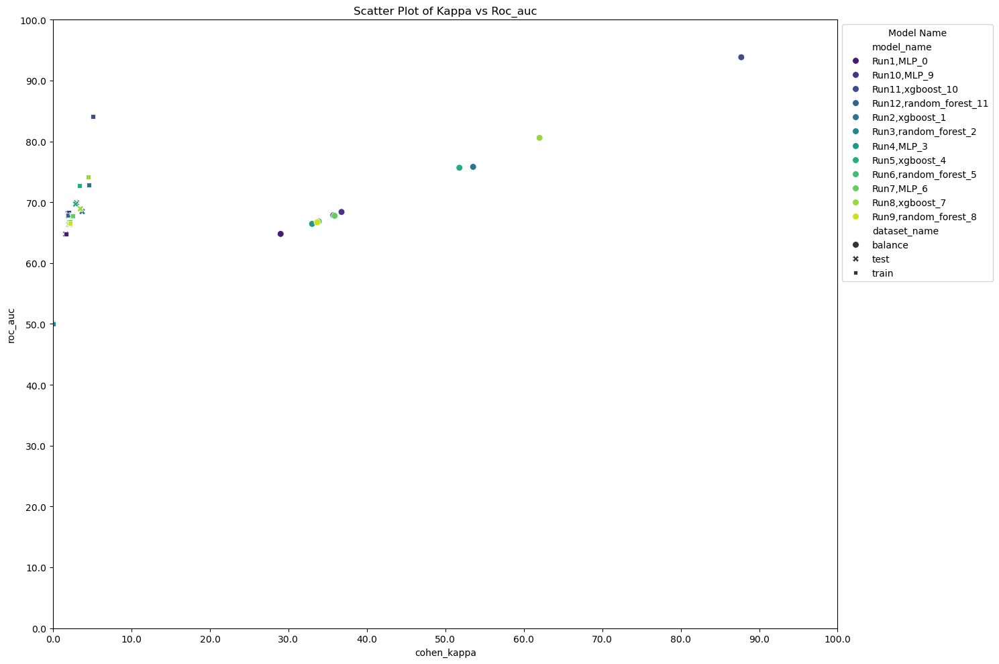

                    INFO     Graficos de desempeños en ['1', '1.0', 1, 1.0] calculadas sobre y         ]8;id=934452;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=28440;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#919\919]8;;\
                             f1-score                                                                              

                    INFO     Algoritmos con Metricas = 0: ['Run3,random_forest_2']                     ]8;id=353389;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=252688;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#926\926]8;;\

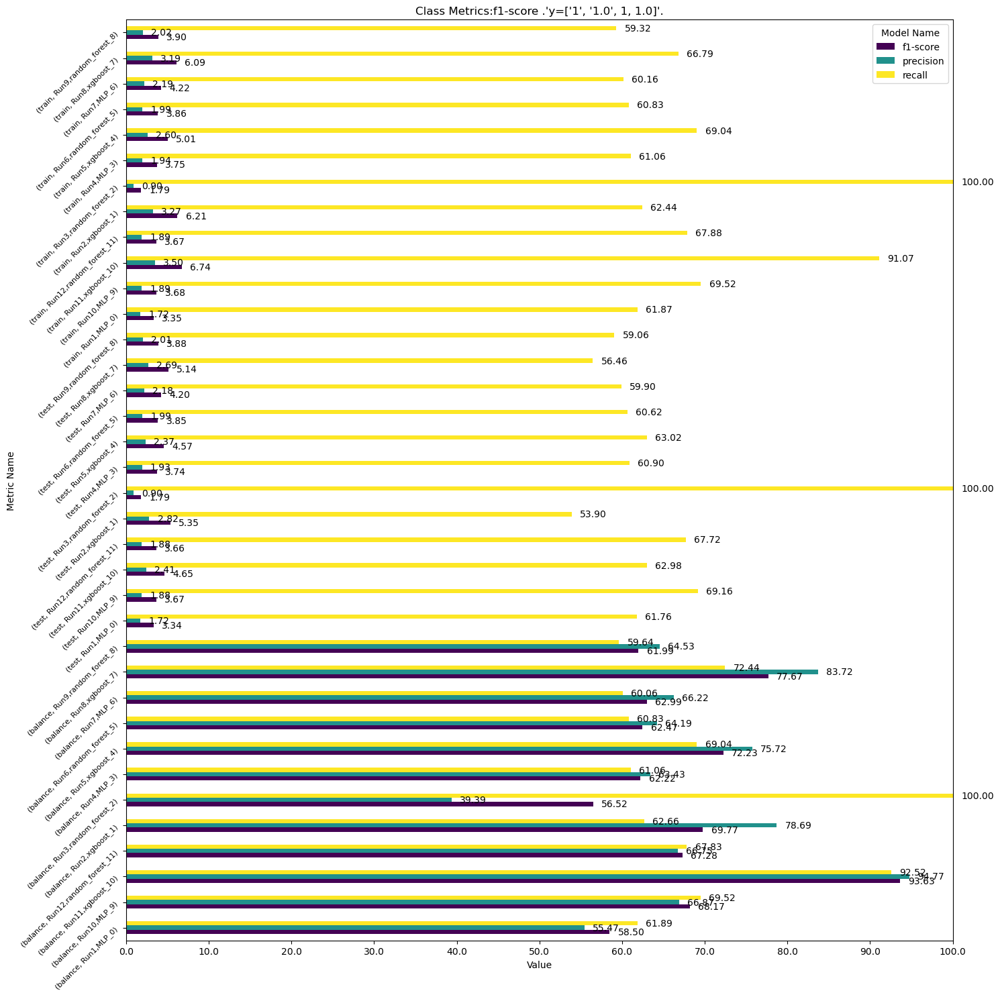

[01/27/25 14:13:03] INFO     Mejores algoritmos por metrica y dataset:                                 ]8;id=275854;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=550649;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#960\960]8;;\

,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.3535
15,"Run2,xgboost_1",test,precision,class metric,1.0,2.8166
25,"Run3,random_forest_2",test,recall,class metric,1.0,100.0000
95,"Run11,xgboost_10",train,f1-score,class metric,1.0,6.7364
93,"Run11,xgboost_10",train,precision,class metric,1.0,3.4975
22,"Run3,random_forest_2",train,recall,class metric,1.0,100.0000


                    INFO     Mejores algoritmos:                                                      ]8;id=23279;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=850366;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#1007\1007]8;;\

,best_model_name,best_unbiased_model,best_fitting_model
model_name,"Run2,xgboost_1","Run3,random_forest_2","Run3,random_forest_2"
metric_name,f1-score,f1-score,f1-score
metric_type,class metric,class metric,class metric
class_name,1.0,1.0,1.0
test,5.3535,1.79,1.79
balance,69.7668,56.5217,56.5217
train,6.211,1.79,1.79
bias,-63.5558,-54.7317,-54.7317
real_bias,True,True,True
test-train,-0.8575,0.0,0.0


In [15]:
# EDA MVP4, experimento 1, prueba 3
info_temp = models.compare_metrics_models(info_save_all,params)

[01/29/25 14:17:04] INFO     Iniciando la comparacion de metricas sobre las datas generadas en         ]8;id=824431;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=669407;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#891\891]8;;\
                             Model_input:                                                                          

                    INFO     Graficos de desempeños en ['cohen_kappa', 'roc_auc'] calculadas tipo:     ]8;id=172324;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=445303;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#895\895]8;;\
                             ['overall metric']                                                                    

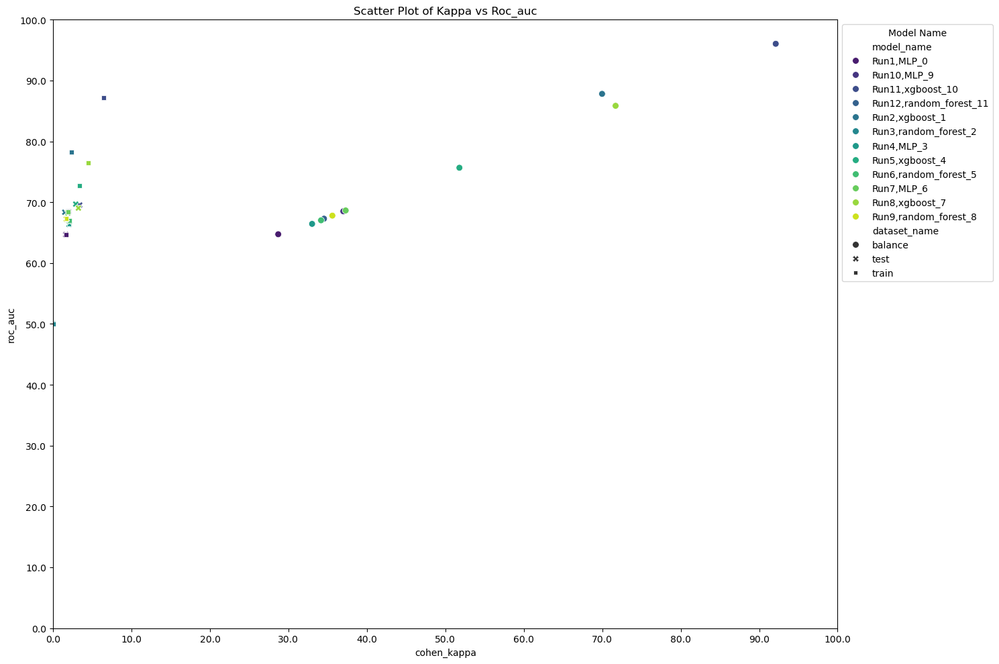

                    INFO     Graficos de desempeños en ['1', '1.0', 1, 1.0] calculadas sobre y         ]8;id=150644;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=753483;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#919\919]8;;\
                             f1-score                                                                              

                    INFO     Algoritmos con Metricas = 0: ['Run3,random_forest_2']                     ]8;id=191896;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=831754;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#926\926]8;;\

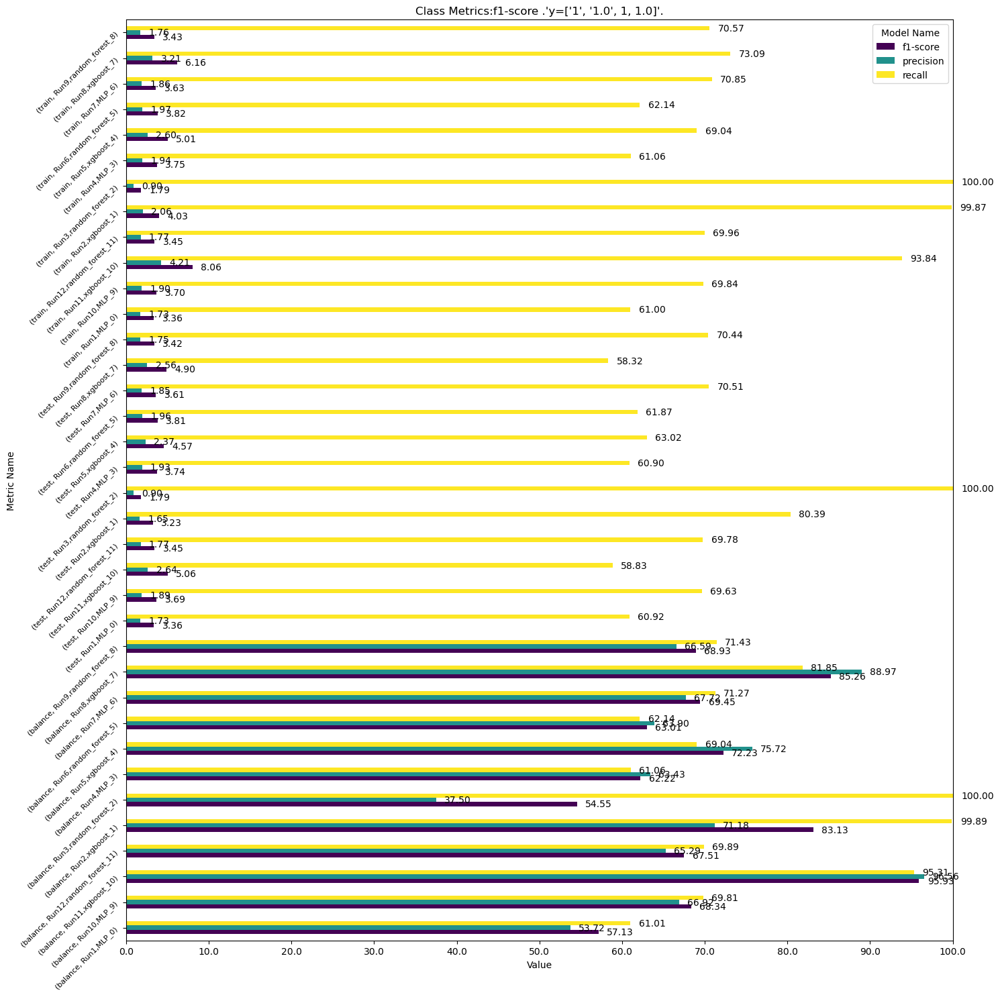

[01/29/25 14:17:05] INFO     Mejores algoritmos por metrica y dataset:                                 ]8;id=712904;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=514329;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#960\960]8;;\

,model_name,dataset_name,metric_name,metric_type,class_name,value
98,"Run11,xgboost_10",test,f1-score,class metric,1.0,5.0563
96,"Run11,xgboost_10",test,precision,class metric,1.0,2.6416
25,"Run3,random_forest_2",test,recall,class metric,1.0,100.0000
95,"Run11,xgboost_10",train,f1-score,class metric,1.0,8.0574
93,"Run11,xgboost_10",train,precision,class metric,1.0,4.2094
22,"Run3,random_forest_2",train,recall,class metric,1.0,100.0000


                    INFO     Mejores algoritmos:                                                      ]8;id=221442;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=31040;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#1007\1007]8;;\

,best_model_name,best_unbiased_model,best_fitting_model
model_name,"Run11,xgboost_10","Run3,random_forest_2","Run3,random_forest_2"
metric_name,f1-score,f1-score,f1-score
metric_type,class metric,class metric,class metric
class_name,1.0,1.0,1.0
test,5.0563,1.79,1.79
balance,95.9308,54.5455,54.5455
train,8.0574,1.79,1.79
bias,-87.8734,-52.7555,-52.7555
real_bias,True,True,True
test-train,-3.0011,0.0,0.0


In [14]:
# EDA MVP4, experimento 2, prueba 4
info_temp = models.compare_metrics_models(info_save_all,params)

[01/14/25 18:51:35] INFO     Iniciando la comparacion de metricas sobre las datas generadas en         ]8;id=795108;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=68571;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#891\891]8;;\
                             Model_input:                                                                          

                    INFO     Graficos de desempeños en ['cohen_kappa', 'roc_auc'] calculadas tipo:     ]8;id=295129;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=693543;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#895\895]8;;\
                             ['overall metric']                                                                    

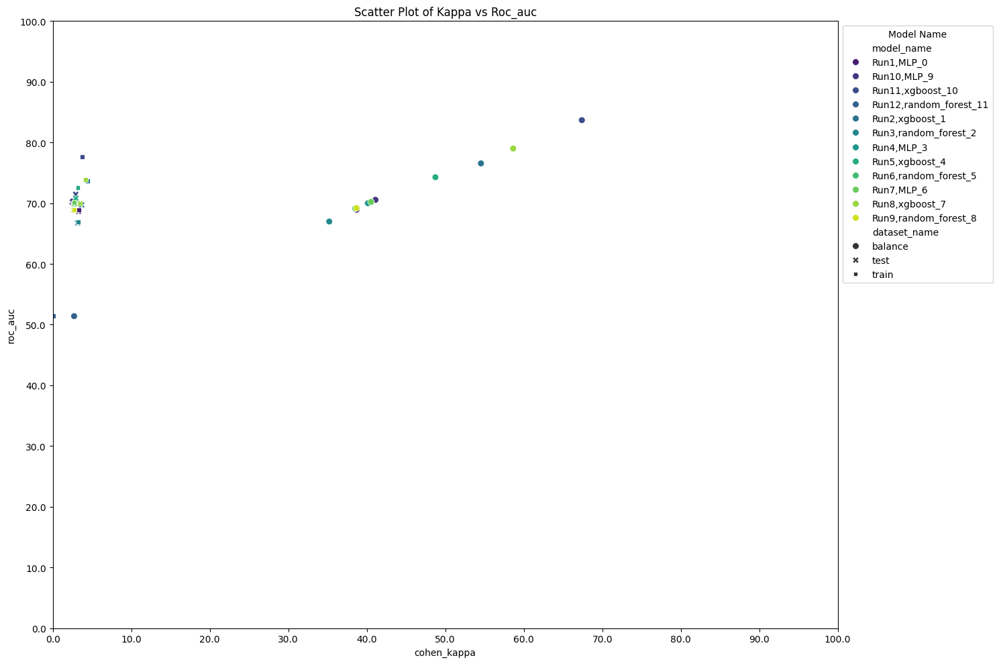

                    INFO     Graficos de desempeños en ['1', '1.0', 1, 1.0] calculadas sobre y         ]8;id=607166;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=384432;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#919\919]8;;\
                             f1-score                                                                              

                    INFO     Algoritmos con Metricas = 0: ['Run12,random_forest_11']                   ]8;id=604436;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=514180;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#926\926]8;;\

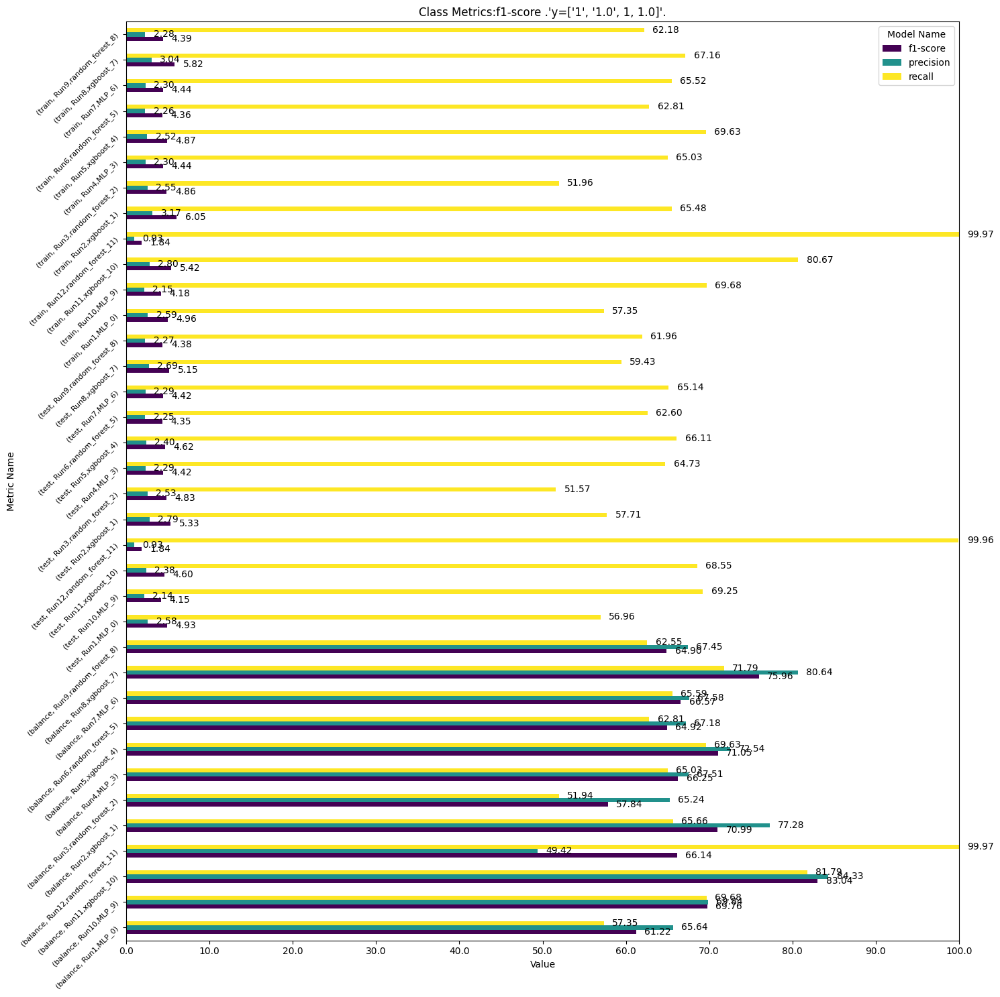

[01/14/25 18:51:36] INFO     Mejores algoritmos por metrica y dataset:                                 ]8;id=954412;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=123270;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#960\960]8;;\

,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.3295
15,"Run2,xgboost_1",test,precision,class metric,1.0,2.7937
106,"Run12,random_forest_11",test,recall,class metric,1.0,99.9645
14,"Run2,xgboost_1",train,f1-score,class metric,1.0,6.0463
12,"Run2,xgboost_1",train,precision,class metric,1.0,3.1695
103,"Run12,random_forest_11",train,recall,class metric,1.0,99.9714


                    INFO     Mejores algoritmos:                                                      ]8;id=321700;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=196992;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#1007\1007]8;;\

,best_model_name,best_unbiased_model,best_fitting_model
model_name,"Run2,xgboost_1","Run3,random_forest_2","Run12,random_forest_11"
metric_name,f1-score,f1-score,f1-score
metric_type,class metric,class metric,class metric
class_name,1.0,1.0,1.0
test,5.3295,4.8314,1.8398
balance,70.9946,57.836,66.1444
train,6.0463,4.8641,1.8402
bias,-64.9483,-52.9719,-64.3042
real_bias,True,True,True
test-train,-0.7168,-0.0327,-0.0004


In [12]:
# sin EDA, experimento 1
info_temp = models.compare_metrics_models(info_save_all,params)

[01/22/25 13:55:04] INFO     Iniciando la comparacion de metricas sobre las datas generadas en         ]8;id=966457;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=253712;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#891\891]8;;\
                             Model_input:                                                                          

                    INFO     Graficos de desempeños en ['cohen_kappa', 'roc_auc'] calculadas tipo:     ]8;id=594232;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=369869;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#895\895]8;;\
                             ['overall metric']                                                                    

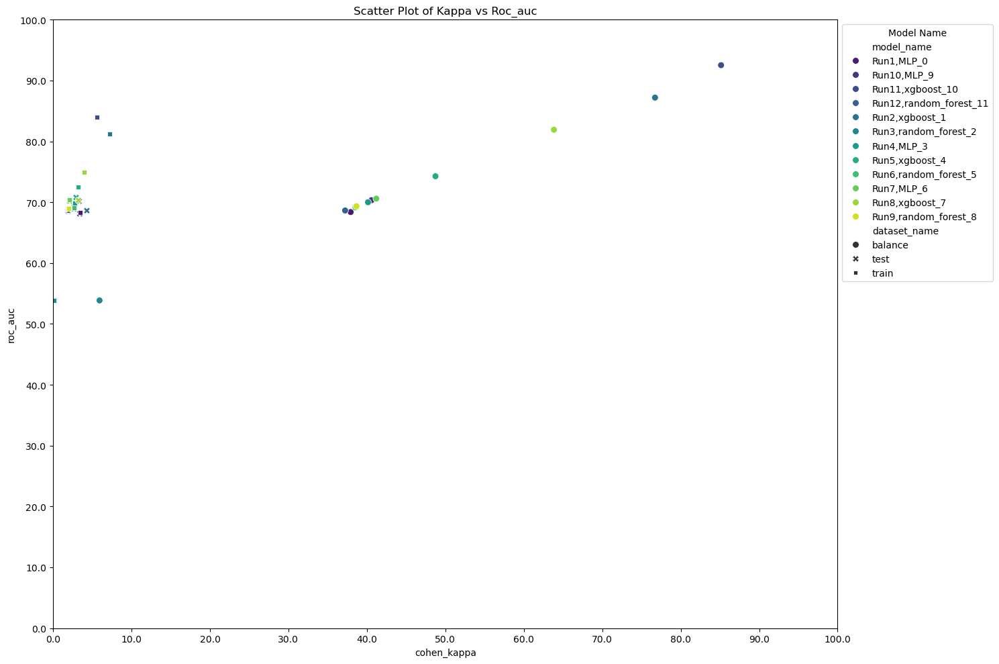

                    INFO     Graficos de desempeños en ['1', '1.0', 1, 1.0] calculadas sobre y         ]8;id=333738;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=316200;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#919\919]8;;\
                             f1-score                                                                              

                    INFO     Algoritmos con Metricas = 0: ['Run3,random_forest_2']                     ]8;id=805607;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=882972;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#926\926]8;;\

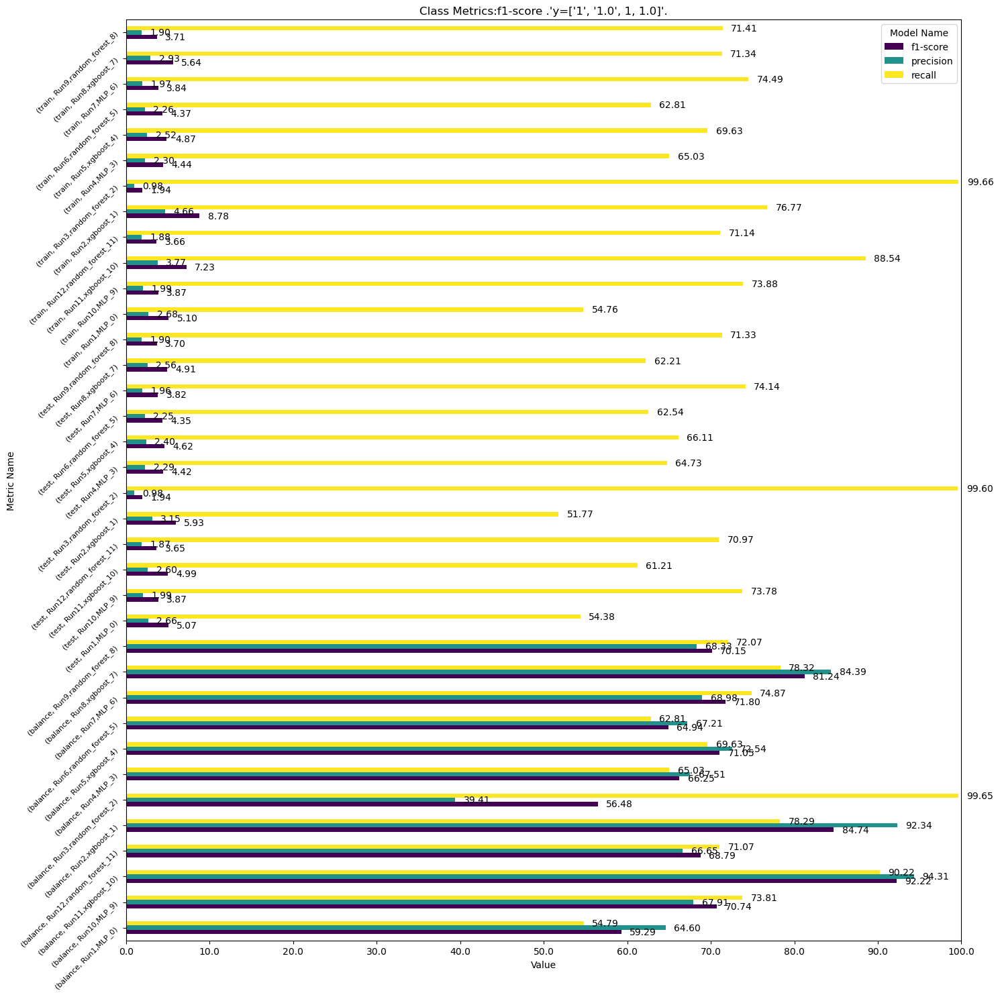

[01/22/25 13:55:05] INFO     Mejores algoritmos por metrica y dataset:                                 ]8;id=254161;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=765540;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#960\960]8;;\

,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.9300
15,"Run2,xgboost_1",test,precision,class metric,1.0,3.1451
25,"Run3,random_forest_2",test,recall,class metric,1.0,99.6022
14,"Run2,xgboost_1",train,f1-score,class metric,1.0,8.7786
12,"Run2,xgboost_1",train,precision,class metric,1.0,4.6555
22,"Run3,random_forest_2",train,recall,class metric,1.0,99.6603


                    INFO     Mejores algoritmos:                                                      ]8;id=893313;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py\nodes.py]8;;\:]8;id=979762;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/models/nodes.py#1007\1007]8;;\

,best_model_name,best_unbiased_model,best_fitting_model
model_name,"Run2,xgboost_1","Run1,MLP_0","Run3,random_forest_2"
metric_name,f1-score,f1-score,f1-score
metric_type,class metric,class metric,class metric
class_name,1.0,1.0,1.0
test,5.93,5.0724,1.9358
balance,84.7358,59.2922,56.4821
train,8.7786,5.102,1.9375
bias,-75.9572,-54.1902,-54.5446
real_bias,True,True,True
test-train,-2.8486,-0.0296,-0.0017


In [13]:
# sin EDA, experimento 2
info_temp = models.compare_metrics_models(info_save_all,params)

In [18]:
# Con EDA MVP4, experimento 1, prueba 3
pct = 0.58
df = info_save_all['all_results']
df = df[df["metric_name"] == "f1-score"]
df = df[df["class_name"].isin(["1","1.0",1])]
df['value'] = df['value'].astype(float)
df_metrics_train = df[df['dataset_name']=='train'].sort_values(by ='value', ascending = False)
df_metrics_test = df[df['dataset_name']=='test'].sort_values(by ='value', ascending = False)
df_metrics_train = df_metrics_train.iloc[:int(df_metrics_train.shape[0]*pct)].sort_values(by = "value", ascending = False)
df_metrics_test = df_metrics_test.iloc[:int(df_metrics_test.shape[0]*pct)].sort_values(by = "value", ascending = False)
ensamble = []
names = []
for model_name in df_metrics_test['model_name']:
    if model_name in df_metrics_train['model_name'].values:
        names.append(model_name)
        ensamble.append(int(model_name.split(",")[0][3:]))
ensambles = sorted(ensamble)
ensamble = ["Run"+str(i) for i in ensambles]
weightss = [1]*len(ensamble)
print(ensamble)
print(weightss)
print('Total de modelo: ',np.sum(weightss))
display(df_metrics_test[df_metrics_test['model_name'].isin(names)])
display(df_metrics_train[df_metrics_train['model_name'].isin(names)])
info_save_all['best_model_metrics_dataset']

['Run2', 'Run5', 'Run7', 'Run8', 'Run9', 'Run11']
[1, 1, 1, 1, 1, 1]
Total de modelo:  6


,model_name,dataset_name,metric_name,metric_type,class_name,value
16,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.3535
16,"Run8,xgboost_7",test,f1-score,class metric,1.0,5.1372
16,"Run11,xgboost_10",test,f1-score,class metric,1.0,4.6493
16,"Run5,xgboost_4",test,f1-score,class metric,1.0,4.5728
16,"Run7,MLP_6",test,f1-score,class metric,1.0,4.2013
16,"Run9,random_forest_8",test,f1-score,class metric,1.0,3.8814


,model_name,dataset_name,metric_name,metric_type,class_name,value
16,"Run11,xgboost_10",train,f1-score,class metric,1.0,6.7364
16,"Run2,xgboost_1",train,f1-score,class metric,1.0,6.2110
16,"Run8,xgboost_7",train,f1-score,class metric,1.0,6.0892
16,"Run5,xgboost_4",train,f1-score,class metric,1.0,5.0129
16,"Run7,MLP_6",train,f1-score,class metric,1.0,4.2172
16,"Run9,random_forest_8",train,f1-score,class metric,1.0,3.9009


,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.3535
15,"Run2,xgboost_1",test,precision,class metric,1.0,2.8166
25,"Run3,random_forest_2",test,recall,class metric,1.0,100.0000
95,"Run11,xgboost_10",train,f1-score,class metric,1.0,6.7364
93,"Run11,xgboost_10",train,precision,class metric,1.0,3.4975
22,"Run3,random_forest_2",train,recall,class metric,1.0,100.0000


In [16]:
# Con EDA MVP4, experimento 2, prueba 4
pct = 0.6
df = info_save_all['all_results']
df = df[df["metric_name"] == "f1-score"]
df = df[df["class_name"].isin(["1","1.0",1])]
df['value'] = df['value'].astype(float)
df_metrics_train = df[df['dataset_name']=='train'].sort_values(by ='value', ascending = False)
df_metrics_test = df[df['dataset_name']=='test'].sort_values(by ='value', ascending = False)
df_metrics_train = df_metrics_train.iloc[:int(df_metrics_train.shape[0]*pct)].sort_values(by = "value", ascending = False)
df_metrics_test = df_metrics_test.iloc[:int(df_metrics_test.shape[0]*pct)].sort_values(by = "value", ascending = False)
ensamble = []
names = []
for model_name in df_metrics_test['model_name']:
    if model_name in df_metrics_train['model_name'].values:
        names.append(model_name)
        ensamble.append(int(model_name.split(",")[0][3:]))
ensambles = sorted(ensamble)
ensamble = ["Run"+str(i) for i in ensambles]
weightss = [1]*len(ensamble)
print(ensamble)
print(weightss)
print('Total de modelo: ',np.sum(weightss))
display(df_metrics_test[df_metrics_test['model_name'].isin(names)])
display(df_metrics_train[df_metrics_train['model_name'].isin(names)])
info_save_all['best_model_metrics_dataset']

['Run4', 'Run5', 'Run6', 'Run8', 'Run10', 'Run11']
[1, 1, 1, 1, 1, 1]
Total de modelo:  6


,model_name,dataset_name,metric_name,metric_type,class_name,value
16,"Run11,xgboost_10",test,f1-score,class metric,1.0,5.0563
16,"Run8,xgboost_7",test,f1-score,class metric,1.0,4.9005
16,"Run5,xgboost_4",test,f1-score,class metric,1.0,4.5728
16,"Run6,random_forest_5",test,f1-score,class metric,1.0,3.8061
16,"Run4,MLP_3",test,f1-score,class metric,1.0,3.7435
16,"Run10,MLP_9",test,f1-score,class metric,1.0,3.6888


,model_name,dataset_name,metric_name,metric_type,class_name,value
16,"Run11,xgboost_10",train,f1-score,class metric,1.0,8.0574
16,"Run8,xgboost_7",train,f1-score,class metric,1.0,6.1550
16,"Run5,xgboost_4",train,f1-score,class metric,1.0,5.0129
16,"Run6,random_forest_5",train,f1-score,class metric,1.0,3.8235
16,"Run4,MLP_3",train,f1-score,class metric,1.0,3.7527
16,"Run10,MLP_9",train,f1-score,class metric,1.0,3.6992


,model_name,dataset_name,metric_name,metric_type,class_name,value
98,"Run11,xgboost_10",test,f1-score,class metric,1.0,5.0563
96,"Run11,xgboost_10",test,precision,class metric,1.0,2.6416
25,"Run3,random_forest_2",test,recall,class metric,1.0,100.0000
95,"Run11,xgboost_10",train,f1-score,class metric,1.0,8.0574
93,"Run11,xgboost_10",train,precision,class metric,1.0,4.2094
22,"Run3,random_forest_2",train,recall,class metric,1.0,100.0000


In [13]:
# sin EDA, experimento 1
pct = 0.65
df = info_save_all['all_results']
df = df[df["metric_name"] == "f1-score"]
df = df[df["class_name"].isin(["1","1.0",1])]
df['value'] = df['value'].astype(float)
df_metrics_train = df[df['dataset_name']=='train'].sort_values(by ='value', ascending = False)
df_metrics_test = df[df['dataset_name']=='test'].sort_values(by ='value', ascending = False)
df_metrics_train = df_metrics_train.iloc[:int(df_metrics_train.shape[0]*pct)].sort_values(by = "value", ascending = False)
df_metrics_test = df_metrics_test.iloc[:int(df_metrics_test.shape[0]*pct)].sort_values(by = "value", ascending = False)
ensamble = []
names = []
for model_name in df_metrics_test['model_name']:
    if model_name in df_metrics_train['model_name'].values:
        names.append(model_name)
        ensamble.append(int(model_name.split(",")[0][3:]))
ensambles = sorted(ensamble)
ensamble = ["Run"+str(i) for i in ensambles]
weightss = [1]*len(ensamble)
print(ensamble)
print(weightss)
print('Total de modelo: ',np.sum(weightss))
display(df_metrics_test[df_metrics_test['model_name'].isin(names)])
display(df_metrics_train[df_metrics_train['model_name'].isin(names)])
info_save_all['best_model_metrics_dataset']

['Run1', 'Run2', 'Run3', 'Run5', 'Run8', 'Run11']
[1, 1, 1, 1, 1, 1]
Total de modelo:  6


,model_name,dataset_name,metric_name,metric_type,class_name,value
16,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.3295
16,"Run8,xgboost_7",test,f1-score,class metric,1.0,5.1530
16,"Run1,MLP_0",test,f1-score,class metric,1.0,4.9298
16,"Run3,random_forest_2",test,f1-score,class metric,1.0,4.8314
16,"Run5,xgboost_4",test,f1-score,class metric,1.0,4.6236
16,"Run11,xgboost_10",test,f1-score,class metric,1.0,4.5994


,model_name,dataset_name,metric_name,metric_type,class_name,value
16,"Run2,xgboost_1",train,f1-score,class metric,1.0,6.0463
16,"Run8,xgboost_7",train,f1-score,class metric,1.0,5.8244
16,"Run11,xgboost_10",train,f1-score,class metric,1.0,5.4214
16,"Run1,MLP_0",train,f1-score,class metric,1.0,4.9608
16,"Run5,xgboost_4",train,f1-score,class metric,1.0,4.8700
16,"Run3,random_forest_2",train,f1-score,class metric,1.0,4.8641


,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.3295
15,"Run2,xgboost_1",test,precision,class metric,1.0,2.7937
106,"Run12,random_forest_11",test,recall,class metric,1.0,99.9645
14,"Run2,xgboost_1",train,f1-score,class metric,1.0,6.0463
12,"Run2,xgboost_1",train,precision,class metric,1.0,3.1695
103,"Run12,random_forest_11",train,recall,class metric,1.0,99.9714


In [16]:
# sin EDA, experimento 2
pct = 0.55
df = info_save_all['all_results']
df = df[df["metric_name"] == "f1-score"]
df = df[df["class_name"].isin(["1","1.0",1])]
df['value'] = df['value'].astype(float)
df_metrics_train = df[df['dataset_name']=='train'].sort_values(by ='value', ascending = False)
df_metrics_test = df[df['dataset_name']=='test'].sort_values(by ='value', ascending = False)
df_metrics_train = df_metrics_train.iloc[:int(df_metrics_train.shape[0]*pct)].sort_values(by = "value", ascending = False)
df_metrics_test = df_metrics_test.iloc[:int(df_metrics_test.shape[0]*pct)].sort_values(by = "value", ascending = False)
ensamble = []
names = []
for model_name in df_metrics_test['model_name']:
    if model_name in df_metrics_train['model_name'].values:
        names.append(model_name)
        ensamble.append(int(model_name.split(",")[0][3:]))
ensambles = sorted(ensamble)
ensamble = ["Run"+str(i) for i in ensambles]
weightss = [1]*len(ensamble)
print(ensamble)
print(weightss)
print('Total de modelo: ',np.sum(weightss))
display(df_metrics_test[df_metrics_test['model_name'].isin(names)])
display(df_metrics_train[df_metrics_train['model_name'].isin(names)])
info_save_all['best_model_metrics_dataset']

['Run1', 'Run2', 'Run4', 'Run5', 'Run8', 'Run11']
[1, 1, 1, 1, 1, 1]
Total de modelo:  6


,model_name,dataset_name,metric_name,metric_type,class_name,value
16,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.9300
16,"Run1,MLP_0",test,f1-score,class metric,1.0,5.0724
16,"Run11,xgboost_10",test,f1-score,class metric,1.0,4.9882
16,"Run8,xgboost_7",test,f1-score,class metric,1.0,4.9114
16,"Run5,xgboost_4",test,f1-score,class metric,1.0,4.6236
16,"Run4,MLP_3",test,f1-score,class metric,1.0,4.4194


,model_name,dataset_name,metric_name,metric_type,class_name,value
16,"Run2,xgboost_1",train,f1-score,class metric,1.0,8.7786
16,"Run11,xgboost_10",train,f1-score,class metric,1.0,7.2281
16,"Run8,xgboost_7",train,f1-score,class metric,1.0,5.6369
16,"Run1,MLP_0",train,f1-score,class metric,1.0,5.1020
16,"Run5,xgboost_4",train,f1-score,class metric,1.0,4.8700
16,"Run4,MLP_3",train,f1-score,class metric,1.0,4.4360


,model_name,dataset_name,metric_name,metric_type,class_name,value
17,"Run2,xgboost_1",test,f1-score,class metric,1.0,5.9300
15,"Run2,xgboost_1",test,precision,class metric,1.0,3.1451
25,"Run3,random_forest_2",test,recall,class metric,1.0,99.6022
14,"Run2,xgboost_1",train,f1-score,class metric,1.0,8.7786
12,"Run2,xgboost_1",train,precision,class metric,1.0,4.6555
22,"Run3,random_forest_2",train,recall,class metric,1.0,99.6603


## model_selection

In [21]:
## algoritmo anterior

In [9]:
info_save_select_ini = catalog.load('info_save_select_anterior') # best model unico

[01/27/25 15:31:32] INFO     Loading data from 'info_save_select_anterior' (PickleDataSet)...   ]8;id=461364;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=625703;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

In [10]:
check_df = info_save_select_ini['select_model2']
check_df = check_df[np.in1d(check_df.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df = check_df[check_df['class_name'].isin([1,1.0,'1','1.0'])]
check_df = check_df.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df

value  \
metric_name     dataset_name class_name select_model        name_model                       
Precision n_top test         1          best_fitting_model  Run5                   38.3046   
                                        best_model_name     Run4                   74.6892   
                                        best_unbiased_model Run1                   73.0549   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  75.9876   
                train        1          best_fitting_model  Run5                   38.5012   
                                        best_model_name     Run4                   79.6692   
                                        best_unbiased_model Run1                   73.1474   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  78.9009   
backtest        test         1          best_fitting_model  Run5                   38.3046   
                                        best_model_name     Run4                   74.6892   
                                        best_unbiased_model Run1                   73.0549   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  75.9876   
                train        1          best_fitting_model  Run5                   38.5012   
                                        best_model_name     Run4                   79.6692   
                                        best_unbiased_model Run1                   73.1474   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  78.9009   
f1-score n_top  test         1          best_fitting_model  Run5                   55.3916   
                                        best_model_name     Run4                   85.5109   
                                        best_unbiased_model Run1                   84.4298   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  86.3556   
                train        1          best_fitting_model  Run5                   55.5969   
                                        best_model_name     Run4                   88.6843   
                                        best_unbiased_model Run1                   84.4915   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  88.2063   
recall n_top    test         1          best_fitting_model  Run5                     100.0   
                                        best_model_name     Run4                     100.0   
                                        best_unbiased_model Run1                     100.0   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]    100.0   
                train        1          best_fitting_model  Run5                     100.0   
                                        best_model_name     Run4                     100.0   
                                        best_unbiased_model Run1                     100.0   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]    100.0   

                                                                                        model_name  
metric_name     dataset_name class_name select_model        name_model                              
Precision n_top test         1          best_fitting_model  Run5                   random_forest_4  
                                        best_model_name     Run4                         xgboost_3  
                                        best_unbiased_model Run1                             MLP_0  
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]         Ensamble  
                train        1          best_fitting_model  Run5                   random_forest_4  
                                        best_model_name     Run4                         xgboost_3  
                                        best_unbiased_model Run1                

In [ ]:
info_save_select_mvp2 = catalog.load('info_save_select_mvp2') # best model unico

In [ ]:
check_df_mvp2 = info_save_select_mvp2['select_model2']
check_df_mvp2 = check_df_mvp2[np.in1d(check_df_mvp2.index.get_level_values(1),['backtest'])].reset_index() 
check_df_mvp2 = check_df_mvp2.set_index(['select_model','name_model','dataset_name','class_name']).sort_index()
check_df_mvp2

In [17]:
params['Ensamble']['want'] = True
params['optimizacion_bayesiana']['want'] = False
params['Ensamble']['Algoritmos'] = ensamble
params['Ensamble']['weights'] = weightss

In [18]:
params['n_obs_filter']

0.3

In [19]:
params['use_key']

{'want': False, 'llave': ['Run10,xgboost_9'], 'estrategia': ['best_model_name']}

In [20]:
params['Ensamble']


{
    'want': True,
    'Algoritmos': ['Run4', 'Run5', 'Run6', 'Run8', 'Run10', 'Run11'],
    'weights': [1, 1, 1, 1, 1, 1],
    'scorer': 'backtest_scorer'
}

In [21]:
info_save_temp=ms.generate_modelo_produccion(info_save_all, params)

[01/29/25 14:19:30] INFO     Iniciando el Ensamblado de modelos...                                     ]8;id=328539;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=385070;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#747\747]8;;\

                    INFO     train                                                                     ]8;id=374118;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=756767;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#707\707]8;;\

                    INFO     Nodo 3, Run4                                                              ]8;id=579039;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=480616;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:19:33] INFO     Nodo 4, Run5                                                              ]8;id=648530;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=555695;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:19:38] INFO     Nodo 5, Run6                                                              ]8;id=400113;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=464027;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  74 out of 100 | elapsed:    7.3s remaining:    2.6s
[Parallel(n_jobs=64)]: Done 100 out of 100 | elapsed:    9.1s finished


[01/29/25 14:19:48] INFO     Nodo 7, Run8                                                              ]8;id=412418;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=51213;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:20:03] INFO     Nodo 9, Run10                                                             ]8;id=944290;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=655362;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:20:06] INFO     Nodo 10, Run11                                                            ]8;id=809341;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=684772;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:20:32] INFO     test                                                                      ]8;id=356279;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=762626;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#707\707]8;;\

                    INFO     Nodo 3, Run4                                                              ]8;id=90129;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=310082;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

                    INFO     Nodo 4, Run5                                                              ]8;id=771784;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=740474;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:20:34] INFO     Nodo 5, Run6                                                              ]8;id=189822;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=615771;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  74 out of 100 | elapsed:    1.9s remaining:    0.7s
[Parallel(n_jobs=64)]: Done 100 out of 100 | elapsed:    2.3s finished


[01/29/25 14:20:36] INFO     Nodo 7, Run8                                                              ]8;id=379790;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=358536;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:20:40] INFO     Nodo 9, Run10                                                             ]8;id=195322;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=852334;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:20:41] INFO     Nodo 10, Run11                                                            ]8;id=700302;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=714898;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#660\660]8;;\

[01/29/25 14:21:13] INFO     Ok Forecast                                                               ]8;id=377336;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=106314;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#723\723]8;;\

                    INFO     Iniciando el calculo de las metricas...                                  ]8;id=602873;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=608564;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1073\1073]8;;\

                    INFO     Tipo de Threshold: KS                                                    ]8;id=859661;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=46191;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1079\1079]8;;\

                    INFO     Models: best_model_name                                                  ]8;id=85988;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=848166;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1104\1104]8;;\

                    INFO     Estrategy: best_model_name                                               ]8;id=813078;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=252879;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1110\1110]8;;\

                    INFO     TOP N: 6746876                                                           ]8;id=23689;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=392650;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1116\1116]8;;\

[01/29/25 14:21:42] INFO     TOP N: 1686719                                                           ]8;id=141485;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=389304;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1116\1116]8;;\

value name_model  model_name  \
class_name metric_name    dataset_name                                  
1          f1-score n_top test          4.1766      Run11  xgboost_10   
           true_sum n_top test           35975      Run11  xgboost_10   
           backtest       test          2.1328      Run11  xgboost_10   

                                           select_model  
class_name metric_name    dataset_name                   
1          f1-score n_top test          best_model_name  
           true_sum n_top test          best_model_name  
           backtest       test          best_model_name

[01/29/25 14:21:49] INFO     Models: best_unbiased_model                                              ]8;id=997360;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=379489;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1104\1104]8;;\

                    INFO     Estrategy: best_unbiased_model                                           ]8;id=521797;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=836040;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1110\1110]8;;\

                    INFO     TOP N: 6746876                                                           ]8;id=787893;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=481791;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1116\1116]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  72 tasks      | elapsed:    6.7s
[Parallel(n_jobs=64)]: Done 322 tasks      | elapsed:   23.4s
[Parallel(n_jobs=64)]: Done 672 tasks      | elapsed:   46.8s
[Parallel(n_jobs=64)]: Done 900 out of 900 | elapsed:  1.0min finished


[01/29/25 14:23:04] INFO     TOP N: 1686719                                                           ]8;id=6162;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=593623;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1116\1116]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  72 tasks      | elapsed:    1.8s
[Parallel(n_jobs=64)]: Done 322 tasks      | elapsed:    6.2s
[Parallel(n_jobs=64)]: Done 672 tasks      | elapsed:   12.3s
[Parallel(n_jobs=64)]: Done 900 out of 900 | elapsed:   16.3s finished


value name_model       model_name  \
class_name metric_name    dataset_name                                       
1          f1-score n_top test          3.5231       Run3  random_forest_2   
           true_sum n_top test           30245       Run3  random_forest_2   
           backtest       test          1.7931       Run3  random_forest_2   

                                               select_model  
class_name metric_name    dataset_name                       
1          f1-score n_top test          best_unbiased_model  
           true_sum n_top test          best_unbiased_model  
           backtest       test          best_unbiased_model

[01/29/25 14:23:23] INFO     Models: best_fitting_model                                               ]8;id=821977;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=597360;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1104\1104]8;;\

                    INFO     Estrategy: best_fitting_model                                            ]8;id=789986;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=957431;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1110\1110]8;;\

                    INFO     TOP N: 6746876                                                           ]8;id=271231;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=918825;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1116\1116]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  72 tasks      | elapsed:    6.8s
[Parallel(n_jobs=64)]: Done 322 tasks      | elapsed:   23.6s
[Parallel(n_jobs=64)]: Done 672 tasks      | elapsed:   46.9s
[Parallel(n_jobs=64)]: Done 900 out of 900 | elapsed:  1.0min finished


[01/29/25 14:24:37] INFO     TOP N: 1686719                                                           ]8;id=767905;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=363972;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1116\1116]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  72 tasks      | elapsed:    1.8s
[Parallel(n_jobs=64)]: Done 322 tasks      | elapsed:    6.0s
[Parallel(n_jobs=64)]: Done 672 tasks      | elapsed:   12.0s
[Parallel(n_jobs=64)]: Done 900 out of 900 | elapsed:   15.7s finished


value name_model       model_name  \
class_name metric_name    dataset_name                                       
1          f1-score n_top test          3.5231       Run3  random_forest_2   
           true_sum n_top test           30245       Run3  random_forest_2   
           backtest       test          1.7931       Run3  random_forest_2   

                                              select_model  
class_name metric_name    dataset_name                      
1          f1-score n_top test          best_fitting_model  
           true_sum n_top test          best_fitting_model  
           backtest       test          best_fitting_model

[01/29/25 14:24:55] INFO     Estrategy: modelo_produccion                                             ]8;id=577159;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=336038;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1110\1110]8;;\

                    INFO     TOP N: 6746876                                                           ]8;id=667990;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=828490;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1116\1116]8;;\

[01/29/25 14:24:59] INFO     Try Segment Dist Probs: 90                                               ]8;id=918226;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=872334;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:25:00] INFO     Try Segment Dist Probs: 85                                               ]8;id=405332;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=803786;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:25:01] INFO     Try Segment Dist Probs: 80                                               ]8;id=46900;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=853004;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:25:03] INFO     Try Segment Dist Probs: 75                                               ]8;id=939401;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=889940;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:25:04] INFO     Try Segment Dist Probs: 70                                               ]8;id=65371;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=976250;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:25:05] INFO     Try Segment Dist Probs: 65                                               ]8;id=841646;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=857239;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:25:07] INFO     Try Segment Dist Probs: 60                                               ]8;id=36724;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=265257;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:25:10] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=15022;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=241946;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=844909;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=620283;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [59, 58, 57, 56, 55, 54, 53, 52, 51, 50,    ]8;id=410367;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=627679;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             49, 48, 47, 46, 45, 44, 43, 42, 41, 40]                                               

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=757962;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=493061;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=176627;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=584063;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=621810;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=464095;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=466349;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=142986;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=339005;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=751952;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=901090;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=969416;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=525755;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=945712;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[01/29/25 14:25:18] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=929323;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=690478;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

[01/29/25 14:25:19] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=853447;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=709562;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=703011;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=819790;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68]                   

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=852679;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=225186;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=736773;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=592058;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=429147;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=968713;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=185637;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=861045;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=368261;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=364401;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=250660;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=319470;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=322135;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=770251;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=595931;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=493349;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=406307;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=531021;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=437871;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=874271;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=587073;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=669726;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=947074;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=361277;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=446804;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=45638;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=69059;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=975855;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=737396;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=601324;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  74 out of 100 | elapsed:    7.2s remaining:    2.5s
[Parallel(n_jobs=64)]: Done 100 out of 100 | elapsed:    8.9s finished


[01/29/25 14:25:33] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=931785;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=589339;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=661892;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=358351;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=280180;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=600968;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67,               
                             66, 64]                                                                               

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=686807;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=259126;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=267234;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=356463;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=800969;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=926602;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=839770;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=992353;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=901671;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=324698;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=351112;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=512181;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=389806;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=537598;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=146614;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=625130;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=240337;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=103587;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=657871;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=633662;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=219023;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=676355;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[01/29/25 14:25:50] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=441883;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=603910;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

[01/29/25 14:25:51] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=223033;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=336212;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=642974;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=892886;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72]                                   

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=2019;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=17132;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=649947;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=739225;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=430710;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=39951;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=871818;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=702851;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=14302;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=391652;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=584626;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=830941;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=376967;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=303146;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=748353;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=980118;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=367711;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=670969;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=332045;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=492323;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=750078;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=315592;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=437817;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=871867;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=728902;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=238257;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=285750;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=218877;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=523065;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=281758;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=491878;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=806962;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=506886;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=999241;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=660575;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=948255;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[01/29/25 14:25:58] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=327382;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=126411;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=802869;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=907498;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=424183;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=504882;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67,               
                             66, 65, 64]                                                                           

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=910757;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=253219;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=65497;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=728832;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=16114;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=684730;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=627099;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=425999;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=73260;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=483204;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=760115;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=115699;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=224219;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=100851;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=762471;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=953501;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=358671;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=639599;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=193469;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=569143;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=679580;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=983410;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=813410;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=657687;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=675389;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=475201;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=401133;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=619768;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=581487;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=258118;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[01/29/25 14:26:22] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=137169;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=26085;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

[01/29/25 14:26:23] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=248601;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=987859;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=438191;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=156505;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82]                                                                           

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=422345;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=204081;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=243769;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=539788;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=14873;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=660251;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=545448;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=4078;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=520589;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=67487;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=961692;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=833606;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=727788;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=235342;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=301854;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=236617;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=606981;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=547731;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

                    INFO     Tipo de Threshold: KS                                                     ]8;id=957536;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=231848;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#295\295]8;;\

                    INFO     ------------------------------------------------------                    ]8;id=832142;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=107573;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: MLP_3,Run4. Weight: 1                                             ]8;id=892856;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=567010;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:26:27] INFO     Update probs: Selected: 0, Target Select: 6746876, Diff %: -1.0           ]8;id=289754;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=383740;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:26:32] INFO     Update probs: Selected: 375289, Target Select: 6746876, Diff %:           ]8;id=578213;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=886171;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9443758859655935                                                                   

[01/29/25 14:26:36] INFO     Update probs: Selected: 750170, Target Select: 6746876, Diff %:           ]8;id=400583;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=936789;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.888812244363169                                                                    

[01/29/25 14:26:41] INFO     Update probs: Selected: 1124303, Target Select: 6746876, Diff %:          ]8;id=563332;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=918184;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8333594688860444                                                                   

[01/29/25 14:26:46] INFO     Update probs: Selected: 1499278, Target Select: 6746876, Diff %:          ]8;id=612451;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=408074;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7777818949095848                                                                   

[01/29/25 14:26:50] INFO     Update probs: Selected: 1873665, Target Select: 6746876, Diff %:          ]8;id=272216;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=536409;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7222914723792166                                                                   

[01/29/25 14:26:55] INFO     Update probs: Selected: 2249783, Target Select: 6746876, Diff %:          ]8;id=860374;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=901397;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6665444866631608                                                                   

[01/29/25 14:26:59] INFO     Update probs: Selected: 2623062, Target Select: 6746876, Diff %:          ]8;id=72902;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=445548;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6112182882863121                                                                   

[01/29/25 14:27:04] INFO     Update probs: Selected: 2997770, Target Select: 6746876, Diff %:          ]8;id=318317;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=934561;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5556802881807817                                                                   

[01/29/25 14:27:08] INFO     Update probs: Selected: 3373653, Target Select: 6746876, Diff %:          ]8;id=549852;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=656876;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4999681333998135                                                                   

[01/29/25 14:27:13] INFO     Update probs: Selected: 3748457, Target Select: 6746876, Diff %:          ]8;id=289244;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=463414;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.444415904486758                                                                    

[01/29/25 14:27:18] INFO     Update probs: Selected: 4121762, Target Select: 6746876, Diff %:          ]8;id=442301;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=252944;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.38908585247453786                                                                  

[01/29/25 14:27:22] INFO     Update probs: Selected: 4496472, Target Select: 6746876, Diff %:          ]8;id=216124;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=754703;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.33354755593551744                                                                  

[01/29/25 14:27:27] INFO     Update probs: Selected: 4874358, Target Select: 6746876, Diff %:          ]8;id=332161;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=193673;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2775385230142069                                                                   

[01/29/25 14:27:31] INFO     Update probs: Selected: 5564340, Target Select: 6746876, Diff %:          ]8;id=949796;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=419399;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.17527163682865968                                                                  

[01/29/25 14:27:36] INFO     Update probs: Selected: 5622971, Target Select: 6746876, Diff %:          ]8;id=127584;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=92925;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.16658154084942423                                                                  

[01/29/25 14:27:40] INFO     Update probs: Selected: 5996810, Target Select: 6746876, Diff %:          ]8;id=138578;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=492132;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.11117234109534546                                                                  

[01/29/25 14:27:45] INFO     Update probs: Selected: 6372676, Target Select: 6746876, Diff %:          ]8;id=474938;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=930946;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.05546270599904311                                                                  

[01/29/25 14:27:49] INFO     Update probs: Selected: 6746765, Target Select: 6746876, Diff %:          ]8;id=538169;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=670042;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -1.6452058700945446e-05                                                               

[01/29/25 14:27:54] INFO     Update probs: Selected: 6746876, Target Select: 6746876, Diff %: 0.0      ]8;id=636224;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=161122;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=738599;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=741466;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

                    INFO     ------------------------------------------------------                    ]8;id=384292;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=771578;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: xgboost_4,Run5. Weight: 1                                         ]8;id=225806;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=570742;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:28:01] INFO     Update probs: Selected: 0, Target Select: 6746876, Diff %: -1.0           ]8;id=558247;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=820510;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:28:06] INFO     Update probs: Selected: 236957, Target Select: 6746876, Diff %:           ]8;id=270334;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=831457;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.964879004742343                                                                    

[01/29/25 14:28:10] INFO     Update probs: Selected: 473578, Target Select: 6746876, Diff %:           ]8;id=935887;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=662723;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.929807810311024                                                                    

[01/29/25 14:28:15] INFO     Update probs: Selected: 710276, Target Select: 6746876, Diff %:           ]8;id=338388;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=495448;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8947252031903358                                                                   

[01/29/25 14:28:19] INFO     Update probs: Selected: 946691, Target Select: 6746876, Diff %:           ]8;id=914692;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=676679;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8596845414084978                                                                   

[01/29/25 14:28:23] INFO     Update probs: Selected: 1183076, Target Select: 6746876, Diff %:          ]8;id=271851;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=385006;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8246483261290114                                                                   

[01/29/25 14:28:28] INFO     Update probs: Selected: 1419810, Target Select: 6746876, Diff %:          ]8;id=423177;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=624802;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7895603832055014                                                                   

[01/29/25 14:28:32] INFO     Update probs: Selected: 1656618, Target Select: 6746876, Diff %:          ]8;id=426198;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=200548;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7544614722428573                                                                   

[01/29/25 14:28:37] INFO     Update probs: Selected: 1893311, Target Select: 6746876, Diff %:          ]8;id=574340;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=206128;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7193796062058944                                                                   

[01/29/25 14:28:41] INFO     Update probs: Selected: 2131302, Target Select: 6746876, Diff %:          ]8;id=238904;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=220146;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.684105354833852                                                                    

[01/29/25 14:28:46] INFO     Update probs: Selected: 2366716, Target Select: 6746876, Diff %:          ]8;id=478000;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=949880;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6492130580138126                                                                   

[01/29/25 14:28:50] INFO     Update probs: Selected: 2603666, Target Select: 6746876, Diff %:          ]8;id=205680;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=701005;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6140931002733709                                                                   

[01/29/25 14:28:55] INFO     Update probs: Selected: 2841154, Target Select: 6746876, Diff %:          ]8;id=62034;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=650536;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5788934019240904                                                                   

[01/29/25 14:28:59] INFO     Update probs: Selected: 3078124, Target Select: 6746876, Diff %:          ]8;id=200456;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=357996;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5437704798487478                                                                   

[01/29/25 14:29:04] INFO     Update probs: Selected: 3313312, Target Select: 6746876, Diff %:          ]8;id=979006;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=78500;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5089116800130905                                                                   

[01/29/25 14:29:08] INFO     Update probs: Selected: 3550255, Target Select: 6746876, Diff %:          ]8;id=109357;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=386194;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.47379275978986424                                                                  

[01/29/25 14:29:12] INFO     Update probs: Selected: 3788139, Target Select: 6746876, Diff %:          ]8;id=427390;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=989460;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.43853436760954256                                                                  

[01/29/25 14:29:17] INFO     Update probs: Selected: 4261816, Target Select: 6746876, Diff %:          ]8;id=543081;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=858277;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3683275044628062                                                                   

[01/29/25 14:29:21] INFO     Update probs: Selected: 4498375, Target Select: 6746876, Diff %:          ]8;id=793214;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=266399;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3332654994696805                                                                   

[01/29/25 14:29:26] INFO     Update probs: Selected: 4735878, Target Select: 6746876, Diff %:          ]8;id=537615;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=242925;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2980635778692242                                                                   

[01/29/25 14:29:30] INFO     Update probs: Selected: 4969966, Target Select: 6746876, Diff %:          ]8;id=209788;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=865097;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.26336781645312585                                                                  

[01/29/25 14:29:34] INFO     Update probs: Selected: 5207843, Target Select: 6746876, Diff %:          ]8;id=555515;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=181563;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.22811046179001956                                                                  

[01/29/25 14:29:39] INFO     Update probs: Selected: 5446370, Target Select: 6746876, Diff %:          ]8;id=583057;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=182771;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.19275676624262844                                                                  

[01/29/25 14:29:43] INFO     Update probs: Selected: 5682002, Target Select: 6746876, Diff %:          ]8;id=109016;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=714161;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.1578321581721674                                                                   

[01/29/25 14:29:48] INFO     Update probs: Selected: 5919822, Target Select: 6746876, Diff %:          ]8;id=383219;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=992074;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12258325186352914                                                                  

[01/29/25 14:29:52] INFO     Update probs: Selected: 6154528, Target Select: 6746876, Diff %:          ]8;id=206600;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=69407;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.08779589249898768                                                                  

[01/29/25 14:29:56] INFO     Update probs: Selected: 6392791, Target Select: 6746876, Diff %:          ]8;id=594702;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=878447;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.052481326172290704                                                                 

[01/29/25 14:30:01] INFO     Update probs: Selected: 6627432, Target Select: 6746876, Diff %:          ]8;id=836414;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=431322;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.017703600896177726                                                                 

[01/29/25 14:30:05] INFO     Update probs: Selected: 6746876, Target Select: 6746876, Diff %: 0.0      ]8;id=192904;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=852704;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=145486;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=913372;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

[01/29/25 14:30:06] INFO     ------------------------------------------------------                    ]8;id=328067;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=844213;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: random_forest_5,Run6. Weight: 1                                   ]8;id=271668;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=220661;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  74 out of 100 | elapsed:    7.1s remaining:    2.5s
[Parallel(n_jobs=64)]: Done 100 out of 100 | elapsed:    8.8s finished


[01/29/25 14:30:18] INFO     Update probs: Selected: 0, Target Select: 6746876, Diff %: -1.0           ]8;id=718855;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=794854;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:30:22] INFO     Update probs: Selected: 236557, Target Select: 6746876, Diff %:           ]8;id=778074;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=793134;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9649382914403644                                                                   

[01/29/25 14:30:26] INFO     Update probs: Selected: 473075, Target Select: 6746876, Diff %:           ]8;id=860358;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=65547;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9298823633337859                                                                   

[01/29/25 14:30:31] INFO     Update probs: Selected: 710090, Target Select: 6746876, Diff %:           ]8;id=158250;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=539244;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8947527715049157                                                                   

[01/29/25 14:30:35] INFO     Update probs: Selected: 944219, Target Select: 6746876, Diff %:           ]8;id=338400;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=802851;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8600509332022702                                                                   

[01/29/25 14:30:39] INFO     Update probs: Selected: 1183423, Target Select: 6746876, Diff %:          ]8;id=724232;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=944433;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8245968949184779                                                                   

[01/29/25 14:30:44] INFO     Update probs: Selected: 1421099, Target Select: 6746876, Diff %:          ]8;id=445885;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=323827;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7893693318211273                                                                   

[01/29/25 14:30:48] INFO     Update probs: Selected: 1655864, Target Select: 6746876, Diff %:          ]8;id=419023;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=229048;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7545732276686277                                                                   

[01/29/25 14:30:53] INFO     Update probs: Selected: 1894575, Target Select: 6746876, Diff %:          ]8;id=598605;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=257525;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7191922602401467                                                                   

[01/29/25 14:30:57] INFO     Update probs: Selected: 2131245, Target Select: 6746876, Diff %:          ]8;id=314450;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=376644;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.68411380318832                                                                     

[01/29/25 14:31:01] INFO     Update probs: Selected: 2367756, Target Select: 6746876, Diff %:          ]8;id=947675;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=729700;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6490589125989569                                                                   

[01/29/25 14:31:06] INFO     Update probs: Selected: 2603556, Target Select: 6746876, Diff %:          ]8;id=733969;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=417664;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6141094041153269                                                                   

[01/29/25 14:31:10] INFO     Update probs: Selected: 2841121, Target Select: 6746876, Diff %:          ]8;id=712754;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=73990;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5788982930766773                                                                   

[01/29/25 14:31:14] INFO     Update probs: Selected: 3075817, Target Select: 6746876, Diff %:          ]8;id=209062;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=671659;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5441124158795864                                                                   

[01/29/25 14:31:19] INFO     Update probs: Selected: 3312682, Target Select: 6746876, Diff %:          ]8;id=328436;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=18651;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5090050565624743                                                                   

[01/29/25 14:31:23] INFO     Update probs: Selected: 3550856, Target Select: 6746876, Diff %:          ]8;id=280980;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=751888;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.47370368152608705                                                                  

[01/29/25 14:31:27] INFO     Update probs: Selected: 3791872, Target Select: 6746876, Diff %:          ]8;id=209356;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=19635;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4379810745002576                                                                   

[01/29/25 14:31:32] INFO     Update probs: Selected: 4011184, Target Select: 6746876, Diff %:          ]8;id=787043;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=927057;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.40547536370907067                                                                  

[01/29/25 14:31:36] INFO     Update probs: Selected: 4238798, Target Select: 6746876, Diff %:          ]8;id=919330;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=850794;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3717391575004491                                                                   

[01/29/25 14:31:41] INFO     Update probs: Selected: 4494816, Target Select: 6746876, Diff %:          ]8;id=443885;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=248496;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3337930028653261                                                                   

[01/29/25 14:31:45] INFO     Update probs: Selected: 4738126, Target Select: 6746876, Diff %:          ]8;id=657015;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=812965;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2977303866263438                                                                   

[01/29/25 14:31:49] INFO     Update probs: Selected: 4969500, Target Select: 6746876, Diff %:          ]8;id=45341;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=790309;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2634368854563208                                                                   

[01/29/25 14:31:54] INFO     Update probs: Selected: 5208605, Target Select: 6746876, Diff %:          ]8;id=510219;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=219818;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.22799752063028875                                                                  

[01/29/25 14:31:58] INFO     Update probs: Selected: 5446516, Target Select: 6746876, Diff %:          ]8;id=223622;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=984685;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.1927351265978506                                                                   

[01/29/25 14:32:02] INFO     Update probs: Selected: 5682045, Target Select: 6746876, Diff %:          ]8;id=903672;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=816963;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.15782578485213009                                                                  

[01/29/25 14:32:07] INFO     Update probs: Selected: 5916305, Target Select: 6746876, Diff %:          ]8;id=209826;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=104198;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12310453015588252                                                                  

[01/29/25 14:32:11] INFO     Update probs: Selected: 6156952, Target Select: 6746876, Diff %:          ]8;id=832153;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=395029;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.08743661510897785                                                                  

[01/29/25 14:32:15] INFO     Update probs: Selected: 6394059, Target Select: 6746876, Diff %:          ]8;id=873091;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=90474;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.052293387339562784                                                                 

[01/29/25 14:32:20] INFO     Update probs: Selected: 6746876, Target Select: 6746876, Diff %: 0.0      ]8;id=487973;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=318384;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=311223;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=572401;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

[01/29/25 14:32:21] INFO     ------------------------------------------------------                    ]8;id=986723;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=403606;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: xgboost_7,Run8. Weight: 1                                         ]8;id=132275;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=64887;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:32:38] INFO     Update probs: Selected: 0, Target Select: 6746876, Diff %: -1.0           ]8;id=418403;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=298625;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:32:42] INFO     Update probs: Selected: 236933, Target Select: 6746876, Diff %:           ]8;id=964239;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=18684;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9648825619442243                                                                   

[01/29/25 14:32:47] INFO     Update probs: Selected: 473171, Target Select: 6746876, Diff %:           ]8;id=751067;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=112971;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9298681345262607                                                                   

[01/29/25 14:32:51] INFO     Update probs: Selected: 710159, Target Select: 6746876, Diff %:           ]8;id=981803;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=332699;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8947425445495071                                                                   

[01/29/25 14:32:55] INFO     Update probs: Selected: 946547, Target Select: 6746876, Diff %:           ]8;id=530833;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=692901;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8597058846197855                                                                   

[01/29/25 14:32:59] INFO     Update probs: Selected: 1183839, Target Select: 6746876, Diff %:          ]8;id=596681;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=601426;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8245352367525356                                                                   

[01/29/25 14:33:04] INFO     Update probs: Selected: 1420322, Target Select: 6746876, Diff %:          ]8;id=830001;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=358899;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7894844962320339                                                                   

[01/29/25 14:33:08] INFO     Update probs: Selected: 1657554, Target Select: 6746876, Diff %:          ]8;id=676049;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=57351;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7543227413694872                                                                   

[01/29/25 14:33:12] INFO     Update probs: Selected: 1893772, Target Select: 6746876, Diff %:          ]8;id=279685;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=533867;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7193112782864247                                                                   

[01/29/25 14:33:17] INFO     Update probs: Selected: 2129781, Target Select: 6746876, Diff %:          ]8;id=722589;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=554924;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6843307925030785                                                                   

[01/29/25 14:33:21] INFO     Update probs: Selected: 2367912, Target Select: 6746876, Diff %:          ]8;id=646533;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=249914;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6490357907867286                                                                   

[01/29/25 14:33:25] INFO     Update probs: Selected: 2603130, Target Select: 6746876, Diff %:          ]8;id=701478;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=481933;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6141725444487197                                                                   

[01/29/25 14:33:29] INFO     Update probs: Selected: 2840508, Target Select: 6746876, Diff %:          ]8;id=583623;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=248042;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.578989149941395                                                                    

[01/29/25 14:33:34] INFO     Update probs: Selected: 3078407, Target Select: 6746876, Diff %:          ]8;id=394755;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=717371;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5437285345098977                                                                   

[01/29/25 14:33:38] INFO     Update probs: Selected: 3314797, Target Select: 6746876, Diff %:          ]8;id=473465;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=914762;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.508691578146686                                                                    

[01/29/25 14:33:42] INFO     Update probs: Selected: 3550688, Target Select: 6746876, Diff %:          ]8;id=158472;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=408634;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.47372858193925604                                                                  

[01/29/25 14:33:47] INFO     Update probs: Selected: 3787536, Target Select: 6746876, Diff %:          ]8;id=206492;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=715850;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.43862374230680984                                                                  

[01/29/25 14:33:51] INFO     Update probs: Selected: 4024787, Target Select: 6746876, Diff %:          ]8;id=600031;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=988525;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4034591713261071                                                                   

[01/29/25 14:33:55] INFO     Update probs: Selected: 4261035, Target Select: 6746876, Diff %:          ]8;id=812495;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=998102;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.36844326174069303                                                                  

[01/29/25 14:33:59] INFO     Update probs: Selected: 4497731, Target Select: 6746876, Diff %:          ]8;id=65926;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=719996;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.333360951053495                                                                    

[01/29/25 14:34:04] INFO     Update probs: Selected: 4734840, Target Select: 6746876, Diff %:          ]8;id=495082;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=105341;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.29821742685058983                                                                  

[01/29/25 14:34:08] INFO     Update probs: Selected: 4971723, Target Select: 6746876, Diff %:          ]8;id=353039;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=814388;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.26310739963206675                                                                  

[01/29/25 14:34:12] INFO     Update probs: Selected: 5209151, Target Select: 6746876, Diff %:          ]8;id=978502;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=298869;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2279165942874895                                                                   

[01/29/25 14:34:17] INFO     Update probs: Selected: 5444141, Target Select: 6746876, Diff %:          ]8;id=643508;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=553253;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.19308714136735283                                                                  

[01/29/25 14:34:21] INFO     Update probs: Selected: 5681550, Target Select: 6746876, Diff %:          ]8;id=953366;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=362903;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.1578991521409316                                                                   

[01/29/25 14:34:25] INFO     Update probs: Selected: 5918211, Target Select: 6746876, Diff %:          ]8;id=306043;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=918551;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12282202903981042                                                                  

[01/29/25 14:34:29] INFO     Update probs: Selected: 6391899, Target Select: 6746876, Diff %:          ]8;id=599124;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=468429;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.05261353550887848                                                                  

[01/29/25 14:34:34] INFO     Update probs: Selected: 6629129, Target Select: 6746876, Diff %:          ]8;id=916517;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=155385;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.017452077079821833                                                                 

[01/29/25 14:34:38] INFO     Update probs: Selected: 6746876, Target Select: 6746876, Diff %: 0.0      ]8;id=341162;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=380921;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=652971;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=960438;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

[01/29/25 14:34:39] INFO     ------------------------------------------------------                    ]8;id=411498;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=6077;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: MLP_9,Run10. Weight: 1                                            ]8;id=371940;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=862599;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:34:44] INFO     Update probs: Selected: 0, Target Select: 6746876, Diff %: -1.0           ]8;id=797740;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=720273;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:34:49] INFO     Update probs: Selected: 236935, Target Select: 6746876, Diff %:           ]8;id=804452;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=407896;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9648822655107342                                                                   

[01/29/25 14:34:53] INFO     Update probs: Selected: 473387, Target Select: 6746876, Diff %:           ]8;id=689547;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=719358;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9298361197093292                                                                   

[01/29/25 14:34:58] INFO     Update probs: Selected: 710269, Target Select: 6746876, Diff %:           ]8;id=574025;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=618913;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8947262407075511                                                                   

[01/29/25 14:35:02] INFO     Update probs: Selected: 946334, Target Select: 6746876, Diff %:           ]8;id=819147;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=300355;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8597374547864819                                                                   

[01/29/25 14:35:07] INFO     Update probs: Selected: 1183230, Target Select: 6746876, Diff %:          ]8;id=621871;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=726647;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8246255007502732                                                                   

[01/29/25 14:35:11] INFO     Update probs: Selected: 1421144, Target Select: 6746876, Diff %:          ]8;id=681581;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=113260;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7893626620675999                                                                   

[01/29/25 14:35:15] INFO     Update probs: Selected: 1657852, Target Select: 6746876, Diff %:          ]8;id=438102;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=588787;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7542785727794612                                                                   

[01/29/25 14:35:20] INFO     Update probs: Selected: 1893479, Target Select: 6746876, Diff %:          ]8;id=885659;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=949139;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7193547057927254                                                                   

[01/29/25 14:35:24] INFO     Update probs: Selected: 2129911, Target Select: 6746876, Diff %:          ]8;id=724430;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=880092;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6843115243262216                                                                   

[01/29/25 14:35:29] INFO     Update probs: Selected: 2368236, Target Select: 6746876, Diff %:          ]8;id=43545;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=451252;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6489877685613312                                                                   

[01/29/25 14:35:33] INFO     Update probs: Selected: 2604404, Target Select: 6746876, Diff %:          ]8;id=354303;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=748585;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6139837163155214                                                                   

[01/29/25 14:35:38] INFO     Update probs: Selected: 2839931, Target Select: 6746876, Diff %:          ]8;id=65621;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=703450;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.579074671003291                                                                    

[01/29/25 14:35:42] INFO     Update probs: Selected: 3077270, Target Select: 6746876, Diff %:          ]8;id=661431;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=291747;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5438970569490236                                                                   

[01/29/25 14:35:47] INFO     Update probs: Selected: 3314589, Target Select: 6746876, Diff %:          ]8;id=511551;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=527961;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5087224072296571                                                                   

[01/29/25 14:35:51] INFO     Update probs: Selected: 3551955, Target Select: 6746876, Diff %:          ]8;id=537124;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=762099;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.47354079132327315                                                                  

[01/29/25 14:35:56] INFO     Update probs: Selected: 4023996, Target Select: 6746876, Diff %:          ]8;id=927851;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=834984;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.40357641077144446                                                                  

[01/29/25 14:36:00] INFO     Update probs: Selected: 4262098, Target Select: 6746876, Diff %:          ]8;id=42019;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=828998;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3682857073407011                                                                   

[01/29/25 14:36:04] INFO     Update probs: Selected: 4497979, Target Select: 6746876, Diff %:          ]8;id=693850;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=90336;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3333241933007217                                                                   

[01/29/25 14:36:09] INFO     Update probs: Selected: 4735265, Target Select: 6746876, Diff %:          ]8;id=162214;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=194598;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.29815443473394204                                                                  

[01/29/25 14:36:13] INFO     Update probs: Selected: 4970756, Target Select: 6746876, Diff %:          ]8;id=889514;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=55853;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2632507252245335                                                                   

[01/29/25 14:36:18] INFO     Update probs: Selected: 5446070, Target Select: 6746876, Diff %:          ]8;id=706889;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=833883;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.1928012312661445                                                                   

[01/29/25 14:36:22] INFO     Update probs: Selected: 5681677, Target Select: 6746876, Diff %:          ]8;id=857310;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=561963;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.15788032861430978                                                                  

[01/29/25 14:36:27] INFO     Update probs: Selected: 5916929, Target Select: 6746876, Diff %:          ]8;id=157472;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=677328;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12301204290696909                                                                  

[01/29/25 14:36:31] INFO     Update probs: Selected: 6153826, Target Select: 6746876, Diff %:          ]8;id=944715;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=888647;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.08789994065401528                                                                  

[01/29/25 14:36:36] INFO     Update probs: Selected: 6393087, Target Select: 6746876, Diff %:          ]8;id=88959;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=168549;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.05243745401575485                                                                  

[01/29/25 14:36:40] INFO     Update probs: Selected: 6627793, Target Select: 6746876, Diff %:          ]8;id=846606;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=916279;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.01765009465121339                                                                  

[01/29/25 14:36:44] INFO     Update probs: Selected: 6746876, Target Select: 6746876, Diff %: 0.0      ]8;id=70949;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=668043;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=651451;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=222192;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

[01/29/25 14:36:46] INFO     ------------------------------------------------------                    ]8;id=567945;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=556320;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: xgboost_10,Run11. Weight: 1                                       ]8;id=258172;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=463305;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:37:09] INFO     Update probs: Selected: 0, Target Select: 6746876, Diff %: -1.0           ]8;id=392464;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=946886;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:37:13] INFO     Update probs: Selected: 236902, Target Select: 6746876, Diff %:           ]8;id=854608;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=201172;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9648871566633209                                                                   

[01/29/25 14:37:18] INFO     Update probs: Selected: 473717, Target Select: 6746876, Diff %:           ]8;id=737338;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=655635;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9297872081834615                                                                   

[01/29/25 14:37:22] INFO     Update probs: Selected: 710223, Target Select: 6746876, Diff %:           ]8;id=772422;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=244257;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8947330586778236                                                                   

[01/29/25 14:37:26] INFO     Update probs: Selected: 947147, Target Select: 6746876, Diff %:           ]8;id=995485;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=824111;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8596169545727533                                                                   

[01/29/25 14:37:31] INFO     Update probs: Selected: 1184010, Target Select: 6746876, Diff %:          ]8;id=341448;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=683201;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8245098916891314                                                                   

[01/29/25 14:37:35] INFO     Update probs: Selected: 1420838, Target Select: 6746876, Diff %:          ]8;id=790479;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=886871;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7894080163915863                                                                   

[01/29/25 14:37:39] INFO     Update probs: Selected: 1656814, Target Select: 6746876, Diff %:          ]8;id=555555;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=891198;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7544324217608268                                                                   

[01/29/25 14:37:43] INFO     Update probs: Selected: 1893389, Target Select: 6746876, Diff %:          ]8;id=708629;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=947178;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7193680452997803                                                                   

[01/29/25 14:37:48] INFO     Update probs: Selected: 2130875, Target Select: 6746876, Diff %:          ]8;id=145516;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=834292;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6841686433839899                                                                   

[01/29/25 14:37:52] INFO     Update probs: Selected: 2366760, Target Select: 6746876, Diff %:          ]8;id=416269;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=206943;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6492065364770303                                                                   

[01/29/25 14:37:56] INFO     Update probs: Selected: 2604152, Target Select: 6746876, Diff %:          ]8;id=560285;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=589649;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6140210669352749                                                                   

[01/29/25 14:38:01] INFO     Update probs: Selected: 2840891, Target Select: 6746876, Diff %:          ]8;id=200167;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=667228;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5789323829280396                                                                   

[01/29/25 14:38:05] INFO     Update probs: Selected: 3077291, Target Select: 6746876, Diff %:          ]8;id=230287;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=964391;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5438939443973774                                                                   

[01/29/25 14:38:09] INFO     Update probs: Selected: 3313920, Target Select: 6746876, Diff %:          ]8;id=948311;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=993569;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5088215642320979                                                                   

[01/29/25 14:38:14] INFO     Update probs: Selected: 3550503, Target Select: 6746876, Diff %:          ]8;id=129215;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=329109;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.47375600203709095                                                                  

[01/29/25 14:38:18] INFO     Update probs: Selected: 3788015, Target Select: 6746876, Diff %:          ]8;id=447656;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=526578;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4385527464859292                                                                   

[01/29/25 14:38:22] INFO     Update probs: Selected: 4024088, Target Select: 6746876, Diff %:          ]8;id=559377;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=485187;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.40356277483089953                                                                  

[01/29/25 14:38:27] INFO     Update probs: Selected: 4261117, Target Select: 6746876, Diff %:          ]8;id=664053;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=199227;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.36843110796759865                                                                  

[01/29/25 14:38:31] INFO     Update probs: Selected: 4497249, Target Select: 6746876, Diff %:          ]8;id=193204;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=135353;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3334323915246108                                                                   

[01/29/25 14:38:35] INFO     Update probs: Selected: 4734264, Target Select: 6746876, Diff %:          ]8;id=516121;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=580323;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.29830279969574064                                                                  

[01/29/25 14:38:40] INFO     Update probs: Selected: 4971062, Target Select: 6746876, Diff %:          ]8;id=179026;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=677661;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.26320537090054713                                                                  

[01/29/25 14:38:44] INFO     Update probs: Selected: 5207944, Target Select: 6746876, Diff %:          ]8;id=90334;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=20568;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.22809549189876915                                                                  

[01/29/25 14:38:48] INFO     Update probs: Selected: 5444245, Target Select: 6746876, Diff %:          ]8;id=295651;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=367396;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.19307172682586726                                                                  

[01/29/25 14:38:53] INFO     Update probs: Selected: 5681981, Target Select: 6746876, Diff %:          ]8;id=36265;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=241621;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.1578352707238135                                                                   

[01/29/25 14:38:57] INFO     Update probs: Selected: 5918505, Target Select: 6746876, Diff %:          ]8;id=60886;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=469995;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12277845331676468                                                                  

[01/29/25 14:39:01] INFO     Update probs: Selected: 6155824, Target Select: 6746876, Diff %:          ]8;id=995105;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=898773;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.08760380359739826                                                                  

[01/29/25 14:39:06] INFO     Update probs: Selected: 6392424, Target Select: 6746876, Diff %:          ]8;id=216214;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=412102;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.05253572171772536                                                                  

[01/29/25 14:39:10] INFO     Update probs: Selected: 6628419, Target Select: 6746876, Diff %:          ]8;id=129686;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=200025;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.017557310968809862                                                                 

[01/29/25 14:39:14] INFO     Update probs: Selected: 6746876, Target Select: 6746876, Diff %: 0.0      ]8;id=422354;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=539467;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=663272;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=884224;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

[01/29/25 14:39:17] INFO     Iniciando sistema de votaciones..                                         ]8;id=509772;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=253649;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#331\331]8;;\

[01/29/25 14:39:22] INFO     Ok Sistema de votaciones                                                  ]8;id=345632;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=650436;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#350\350]8;;\

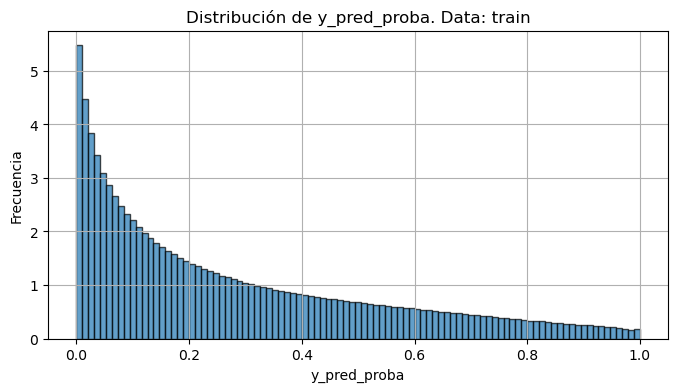

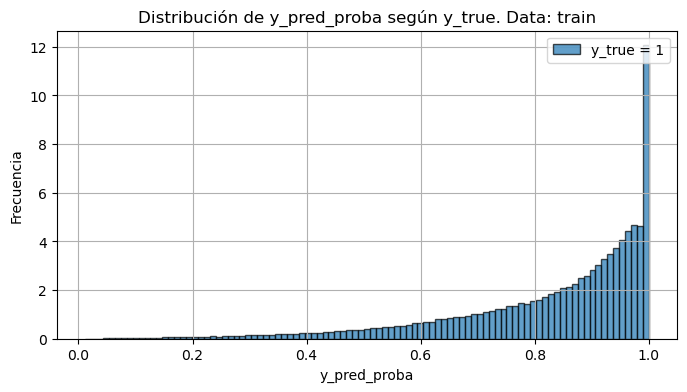

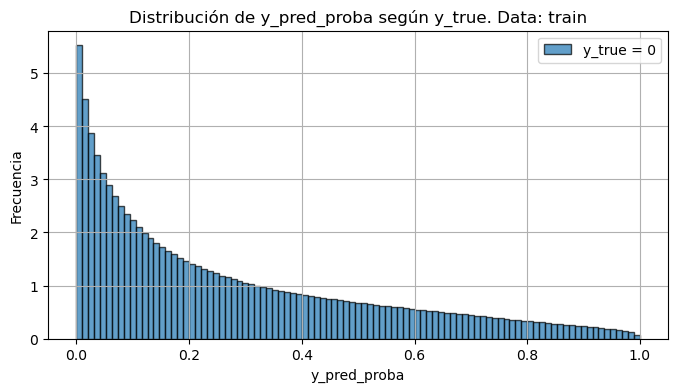

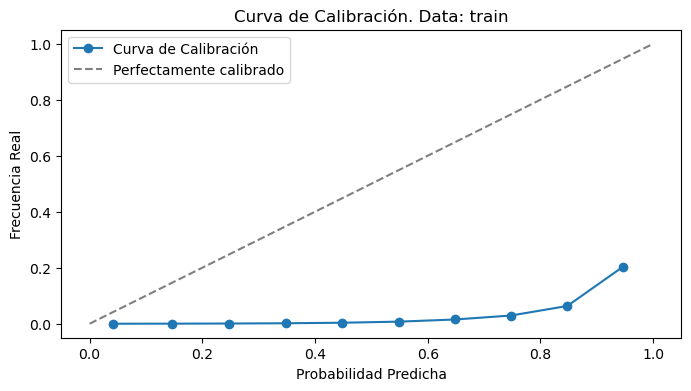

[01/29/25 14:39:48] INFO     TOP N: 1686719                                                           ]8;id=749603;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=345120;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1116\1116]8;;\

[01/29/25 14:39:50] INFO     Try Segment Dist Probs: 90                                               ]8;id=543375;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=597484;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

                    INFO     Try Segment Dist Probs: 85                                               ]8;id=495860;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=738199;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

                    INFO     Try Segment Dist Probs: 80                                               ]8;id=861340;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=983738;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:39:51] INFO     Try Segment Dist Probs: 75                                               ]8;id=750947;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=252268;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

                    INFO     Try Segment Dist Probs: 70                                               ]8;id=631483;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=597255;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

                    INFO     Try Segment Dist Probs: 65                                               ]8;id=502888;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=534721;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

                    INFO     Try Segment Dist Probs: 60                                               ]8;id=336052;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=76265;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1150\1150]8;;\

[01/29/25 14:39:52] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=763350;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=664051;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=209972;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=26046;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [59, 58, 57, 56, 55, 54, 53, 52, 51, 50,    ]8;id=589127;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=621677;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             49, 48, 47, 46, 45, 44, 43, 42, 41, 40]                                               

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=727748;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=219892;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=352397;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=321151;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=645419;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=734896;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=923323;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=74000;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=132295;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=520476;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=130107;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=203312;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=640615;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=478027;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=882706;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=627920;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[01/29/25 14:39:54] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=509180;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=344138;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

[01/29/25 14:39:55] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=944845;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=248533;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=759459;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=115715;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67,               
                             66, 65]                                                                               

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=513709;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=15368;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=738882;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=342802;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=853814;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=901535;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=458234;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=713766;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=188869;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=894348;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=343145;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=466969;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=112238;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=687881;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=242408;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=381911;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=171643;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=958515;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  74 out of 100 | elapsed:    1.9s remaining:    0.7s
[Parallel(n_jobs=64)]: Done 100 out of 100 | elapsed:    2.3s finished


[01/29/25 14:39:58] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=117249;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=105627;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=511123;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=911158;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=172994;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=369643;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67,               
                             66, 65, 63, 61]                                                                       

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=497495;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=879190;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=686403;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=602960;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=322475;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=395894;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=2193;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=118940;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=481288;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=77948;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=964126;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=339283;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=526502;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=819787;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=153562;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=512405;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=305942;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=192478;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=160504;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=148163;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[01/29/25 14:40:03] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=55778;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=608335;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=729700;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=718353;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=509523;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=560029;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67,               
                             66, 65, 63]                                                                           

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=87598;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=758757;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=283259;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=269299;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=977058;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=823195;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=70032;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=560250;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=285768;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=424053;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=194687;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=243116;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=473370;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=638130;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=106986;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=869551;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=342033;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=785641;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=222013;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=395648;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=604944;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=270613;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[01/29/25 14:40:05] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=326172;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=732181;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=768106;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=31014;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=939683;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=643009;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67,               
                             66, 65, 64]                                                                           

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=988788;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=630866;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=928015;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=928841;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=323194;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=712713;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=783788;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=423084;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=523237;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=624299;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=391249;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=151349;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=206298;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=106090;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=671401;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=717626;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=534995;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=505418;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=517366;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=111536;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=49173;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=10357;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=358284;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=193748;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

[01/29/25 14:40:11] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=390291;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=990593;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#755\755]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=461846;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=819882;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#793\793]8;;\

                    INFO     Deciles donde el ks aumenta:  [94, 93, 92, 91, 90, 89, 88, 87, 86, 85,    ]8;id=130920;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=792849;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#817\817]8;;\
                             84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67]               

                    INFO     Iniciando el procesamiento del ks                                        ]8;id=667579;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=744584;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1169\1169]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=249372;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=890033;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=995728;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=23992;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=333170;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=199775;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=477174;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=710180;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=63623;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=242415;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=636427;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=350656;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=755080;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=266624;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=326317;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=210598;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=345485;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=694888;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=954118;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=865847;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=626582;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=844876;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             bog_integration_fabrica_personas/pipelines/model_selection/nodes.py:11                
                             8: SettingWithCopyWarning:                                                            
                             A value is trying to be set on a copy of a slice from a DataFrame                     
                                                                                                                   
                             See the caveats in the documentation:                                                 
                             https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#                
                             returning-a-view-versus-a-copy                                                        
                               sub_group.loc[index,'prob_min'] = value_copy                                        
                                                                                                                   

                    INFO     Finalizando el procesamiento del ks                                      ]8;id=750806;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=865973;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#1177\1177]8;;\

                    INFO     Tipo de Threshold: KS                                                     ]8;id=363366;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=796793;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#295\295]8;;\

                    INFO     ------------------------------------------------------                    ]8;id=624446;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=123185;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: MLP_3,Run4. Weight: 1                                             ]8;id=525341;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=386550;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:40:12] INFO     Update probs: Selected: 0, Target Select: 1686719, Diff %: -1.0           ]8;id=929131;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=774346;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:40:13] INFO     Update probs: Selected: 93700, Target Select: 1686719, Diff %:            ]8;id=773140;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=499565;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9444483639539247                                                                   

[01/29/25 14:40:14] INFO     Update probs: Selected: 187512, Target Select: 1686719, Diff %:           ]8;id=167588;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=209213;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8888303268060656                                                                   

[01/29/25 14:40:15] INFO     Update probs: Selected: 281193, Target Select: 1686719, Diff %:           ]8;id=285252;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=336902;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8332899552326143                                                                   

[01/29/25 14:40:17] INFO     Update probs: Selected: 374766, Target Select: 1686719, Diff %:           ]8;id=622418;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=847729;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7778136132930262                                                                   

[01/29/25 14:40:18] INFO     Update probs: Selected: 468666, Target Select: 1686719, Diff %:           ]8;id=581815;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=109740;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7221434038509081                                                                   

[01/29/25 14:40:19] INFO     Update probs: Selected: 562344, Target Select: 1686719, Diff %:           ]8;id=700297;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=515660;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6666048108783976                                                                   

[01/29/25 14:40:20] INFO     Update probs: Selected: 655784, Target Select: 1686719, Diff %:           ]8;id=296865;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=27393;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.611207320247178                                                                    

[01/29/25 14:40:21] INFO     Update probs: Selected: 749489, Target Select: 1686719, Diff %:           ]8;id=622305;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=936461;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5556527198662018                                                                   

[01/29/25 14:40:22] INFO     Update probs: Selected: 843222, Target Select: 1686719, Diff %:           ]8;id=156441;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=352139;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5000815192097795                                                                   

[01/29/25 14:40:23] INFO     Update probs: Selected: 936792, Target Select: 1686719, Diff %:           ]8;id=529172;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=371860;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4446069558711321                                                                   

[01/29/25 14:40:24] INFO     Update probs: Selected: 1030444, Target Select: 1686719, Diff %:          ]8;id=151788;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=784597;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3890837774401071                                                                   

[01/29/25 14:40:25] INFO     Update probs: Selected: 1124251, Target Select: 1686719, Diff %:          ]8;id=204553;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=358548;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3334687046271489                                                                   

[01/29/25 14:40:26] INFO     Update probs: Selected: 1218874, Target Select: 1686719, Diff %:          ]8;id=700898;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=952154;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.27736985235833594                                                                  

[01/29/25 14:40:27] INFO     Update probs: Selected: 1405337, Target Select: 1686719, Diff %:          ]8;id=21071;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=979524;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.16682209662664618                                                                  

[01/29/25 14:40:28] INFO     Update probs: Selected: 1499491, Target Select: 1686719, Diff %:          ]8;id=150949;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=278811;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.11100129897155366                                                                  

[01/29/25 14:40:29] INFO     Update probs: Selected: 1592955, Target Select: 1686719, Diff %:          ]8;id=151780;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=203907;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.055589579532808964                                                                 

[01/29/25 14:40:30] INFO     Update probs: Selected: 1686649, Target Select: 1686719, Diff %:          ]8;id=867212;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=153640;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -4.150068861499752e-05                                                                

[01/29/25 14:40:31] INFO     Update probs: Selected: 1686719, Target Select: 1686719, Diff %: 0.0      ]8;id=107306;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=673239;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=363200;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=696130;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

                    INFO     ------------------------------------------------------                    ]8;id=228462;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=679437;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: xgboost_4,Run5. Weight: 1                                         ]8;id=416479;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=430505;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:40:33] INFO     Update probs: Selected: 0, Target Select: 1686719, Diff %: -1.0           ]8;id=353508;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=60064;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:40:34] INFO     Update probs: Selected: 59211, Target Select: 1686719, Diff %:            ]8;id=857762;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=498899;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.964895753234534                                                                    

[01/29/25 14:40:35] INFO     Update probs: Selected: 118407, Target Select: 1686719, Diff %:           ]8;id=555506;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=938355;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9298003994737712                                                                   

[01/29/25 14:40:36] INFO     Update probs: Selected: 177444, Target Select: 1686719, Diff %:           ]8;id=396029;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=565823;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8947993115628625                                                                   

[01/29/25 14:40:37] INFO     Update probs: Selected: 236726, Target Select: 1686719, Diff %:           ]8;id=278297;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=824615;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8596529712418014                                                                   

[01/29/25 14:40:38] INFO     Update probs: Selected: 295822, Target Select: 1686719, Diff %:           ]8;id=875127;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=407088;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8246169041790601                                                                   

[01/29/25 14:40:39] INFO     Update probs: Selected: 354994, Target Select: 1686719, Diff %:           ]8;id=340852;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=909882;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7895357792258224                                                                   

[01/29/25 14:40:40] INFO     Update probs: Selected: 414479, Target Select: 1686719, Diff %:           ]8;id=754700;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=933473;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7542690869077777                                                                   

[01/29/25 14:40:41] INFO     Update probs: Selected: 473582, Target Select: 1686719, Diff %:           ]8;id=806370;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=550745;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.719228869776175                                                                    

[01/29/25 14:40:42] INFO     Update probs: Selected: 532660, Target Select: 1686719, Diff %:           ]8;id=822912;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=910240;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6842034743190775                                                                   

[01/29/25 14:40:43] INFO     Update probs: Selected: 651237, Target Select: 1686719, Diff %:           ]8;id=713103;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=902350;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6139030864062123                                                                   

[01/29/25 14:40:44] INFO     Update probs: Selected: 710287, Target Select: 1686719, Diff %:           ]8;id=362708;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=470941;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5788942912245608                                                                   

[01/29/25 14:40:45] INFO     Update probs: Selected: 769256, Target Select: 1686719, Diff %:           ]8;id=578259;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=692734;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5439335182683067                                                                   

[01/29/25 14:40:46] INFO     Update probs: Selected: 828788, Target Select: 1686719, Diff %:           ]8;id=961304;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=487441;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.508638961202192                                                                    

[01/29/25 14:40:47] INFO     Update probs: Selected: 887936, Target Select: 1686719, Diff %:           ]8;id=152225;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=931336;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4735720650564795                                                                   

[01/29/25 14:40:48] INFO     Update probs: Selected: 947261, Target Select: 1686719, Diff %:           ]8;id=728895;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=296838;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4384002314552691                                                                   

[01/29/25 14:40:49] INFO     Update probs: Selected: 1006230, Target Select: 1686719, Diff %:          ]8;id=879932;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=559873;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.40343945849901497                                                                  

[01/29/25 14:40:50] INFO     Update probs: Selected: 1065123, Target Select: 1686719, Diff %:          ]8;id=779195;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=499947;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3685237434332571                                                                   

[01/29/25 14:40:51] INFO     Update probs: Selected: 1124766, Target Select: 1686719, Diff %:          ]8;id=113524;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=671968;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3331633781323386                                                                   

[01/29/25 14:40:52] INFO     Update probs: Selected: 1242568, Target Select: 1686719, Diff %:          ]8;id=736444;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=407287;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.26332246212913946                                                                  

[01/29/25 14:40:53] INFO     Update probs: Selected: 1361104, Target Select: 1686719, Diff %:          ]8;id=400251;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=873521;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.1930463817624631                                                                   

[01/29/25 14:40:54] INFO     Update probs: Selected: 1420202, Target Select: 1686719, Diff %:          ]8;id=840234;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=523386;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.15800912896576133                                                                  

[01/29/25 14:40:55] INFO     Update probs: Selected: 1479742, Target Select: 1686719, Diff %:          ]8;id=504199;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=55333;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12270982896380488                                                                  

[01/29/25 14:40:56] INFO     Update probs: Selected: 1538746, Target Select: 1686719, Diff %:          ]8;id=996576;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=222352;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.08772830566324326                                                                  

[01/29/25 14:40:57] INFO     Update probs: Selected: 1598299, Target Select: 1686719, Diff %:          ]8;id=435551;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=486298;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.05242129839054401                                                                  

[01/29/25 14:40:58] INFO     Update probs: Selected: 1656860, Target Select: 1686719, Diff %:          ]8;id=338117;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=4898;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.017702415162217298                                                                 

[01/29/25 14:40:59] INFO     Update probs: Selected: 1686719, Target Select: 1686719, Diff %: 0.0      ]8;id=780005;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=332970;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=122938;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=686503;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

                    INFO     ------------------------------------------------------                    ]8;id=548917;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=999867;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: random_forest_5,Run6. Weight: 1                                   ]8;id=148151;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=657991;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done  74 out of 100 | elapsed:    1.9s remaining:    0.7s
[Parallel(n_jobs=64)]: Done 100 out of 100 | elapsed:    2.3s finished


[01/29/25 14:41:02] INFO     Update probs: Selected: 0, Target Select: 1686719, Diff %: -1.0           ]8;id=799291;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=40755;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:41:03] INFO     Update probs: Selected: 59155, Target Select: 1686719, Diff %:            ]8;id=177370;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=599286;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.964928953785426                                                                    

[01/29/25 14:41:04] INFO     Update probs: Selected: 118263, Target Select: 1686719, Diff %:           ]8;id=561318;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=96289;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9298857723189221                                                                   

[01/29/25 14:41:05] INFO     Update probs: Selected: 177347, Target Select: 1686719, Diff %:           ]8;id=977463;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=43546;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8948568196599433                                                                   

[01/29/25 14:41:06] INFO     Update probs: Selected: 236836, Target Select: 1686719, Diff %:           ]8;id=520581;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=324889;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8595877558739778                                                                   

[01/29/25 14:41:07] INFO     Update probs: Selected: 296190, Target Select: 1686719, Diff %:           ]8;id=133611;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=836073;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8243987291303412                                                                   

[01/29/25 14:41:08] INFO     Update probs: Selected: 354667, Target Select: 1686719, Diff %:           ]8;id=77780;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=800068;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7897296467283526                                                                   

[01/29/25 14:41:10] INFO     Update probs: Selected: 473599, Target Select: 1686719, Diff %:           ]8;id=703572;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=695190;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7192187910375113                                                                   

[01/29/25 14:41:11] INFO     Update probs: Selected: 532850, Target Select: 1686719, Diff %:           ]8;id=433742;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=507210;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6840908295928367                                                                   

[01/29/25 14:41:12] INFO     Update probs: Selected: 591607, Target Select: 1686719, Diff %:           ]8;id=595189;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=802664;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.649255744436388                                                                    

[01/29/25 14:41:13] INFO     Update probs: Selected: 651273, Target Select: 1686719, Diff %:           ]8;id=72607;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=459577;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6138817431949246                                                                   

[01/29/25 14:41:14] INFO     Update probs: Selected: 710446, Target Select: 1686719, Diff %:           ]8;id=249680;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=877939;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5788000253747068                                                                   

[01/29/25 14:41:15] INFO     Update probs: Selected: 769045, Target Select: 1686719, Diff %:           ]8;id=42154;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=513694;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5440586132011319                                                                   

[01/29/25 14:41:16] INFO     Update probs: Selected: 828136, Target Select: 1686719, Diff %:           ]8;id=171336;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=68886;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5090255104732916                                                                   

[01/29/25 14:41:17] INFO     Update probs: Selected: 887603, Target Select: 1686719, Diff %:           ]8;id=15555;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=759586;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.47376948976089084                                                                  

[01/29/25 14:41:18] INFO     Update probs: Selected: 948352, Target Select: 1686719, Diff %:           ]8;id=374940;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=54832;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4377534135798553                                                                   

[01/29/25 14:41:19] INFO     Update probs: Selected: 1003590, Target Select: 1686719, Diff %:          ]8;id=631384;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=95892;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.40500462732678055                                                                  

                    INFO     Update probs: Selected: 1060275, Target Select: 1686719, Diff %:          ]8;id=375268;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=192053;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3713979625533358                                                                   

[01/29/25 14:41:20] INFO     Update probs: Selected: 1124194, Target Select: 1686719, Diff %:          ]8;id=155543;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=334525;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.33350249804502113                                                                  

[01/29/25 14:41:21] INFO     Update probs: Selected: 1185337, Target Select: 1686719, Diff %:          ]8;id=956116;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=194843;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.29725283227378124                                                                  

[01/29/25 14:41:23] INFO     Update probs: Selected: 1301631, Target Select: 1686719, Diff %:          ]8;id=176294;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=275982;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.22830595967674522                                                                  

                    INFO     Update probs: Selected: 1362084, Target Select: 1686719, Diff %:          ]8;id=182667;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=679143;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.19246537212185313                                                                  

[01/29/25 14:41:24] INFO     Update probs: Selected: 1419904, Target Select: 1686719, Diff %:          ]8;id=931382;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=995446;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.15818580332586518                                                                  

[01/29/25 14:41:25] INFO     Update probs: Selected: 1479736, Target Select: 1686719, Diff %:          ]8;id=768651;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=981927;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12271338616568617                                                                  

[01/29/25 14:41:27] INFO     Update probs: Selected: 1598840, Target Select: 1686719, Diff %:          ]8;id=295486;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=440029;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.0521005573542481                                                                   

[01/29/25 14:41:28] INFO     Update probs: Selected: 1656878, Target Select: 1686719, Diff %:          ]8;id=285744;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=548301;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.017691743556573443                                                                 

[01/29/25 14:41:29] INFO     Update probs: Selected: 1686719, Target Select: 1686719, Diff %: 0.0      ]8;id=976281;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=772844;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=561218;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=50813;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

                    INFO     ------------------------------------------------------                    ]8;id=776210;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=951960;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: xgboost_7,Run8. Weight: 1                                         ]8;id=70617;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=330285;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:41:33] INFO     Update probs: Selected: 0, Target Select: 1686719, Diff %: -1.0           ]8;id=408146;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=684527;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:41:34] INFO     Update probs: Selected: 59193, Target Select: 1686719, Diff %:            ]8;id=405638;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=443622;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9649064248401779                                                                   

[01/29/25 14:41:35] INFO     Update probs: Selected: 118273, Target Select: 1686719, Diff %:           ]8;id=184101;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=498171;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.92987984364912                                                                     

[01/29/25 14:41:36] INFO     Update probs: Selected: 177433, Target Select: 1686719, Diff %:           ]8;id=542330;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=848252;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8948058330996449                                                                   

[01/29/25 14:41:37] INFO     Update probs: Selected: 236626, Target Select: 1686719, Diff %:           ]8;id=747430;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=870854;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8597122579398229                                                                   

[01/29/25 14:41:38] INFO     Update probs: Selected: 295699, Target Select: 1686719, Diff %:           ]8;id=687227;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=883932;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8246898268176264                                                                   

[01/29/25 14:41:39] INFO     Update probs: Selected: 354834, Target Select: 1686719, Diff %:           ]8;id=346952;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=352325;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7896306379426568                                                                   

                    INFO     Update probs: Selected: 414224, Target Select: 1686719, Diff %:           ]8;id=134832;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=617825;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7544202679877324                                                                   

[01/29/25 14:41:40] INFO     Update probs: Selected: 473233, Target Select: 1686719, Diff %:           ]8;id=936151;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=421496;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7194357803522697                                                                   

[01/29/25 14:41:41] INFO     Update probs: Selected: 532406, Target Select: 1686719, Diff %:           ]8;id=432498;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=513917;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6843540625320519                                                                   

[01/29/25 14:41:42] INFO     Update probs: Selected: 591771, Target Select: 1686719, Diff %:           ]8;id=395636;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=559085;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.649158514251633                                                                    

[01/29/25 14:41:43] INFO     Update probs: Selected: 650852, Target Select: 1686719, Diff %:           ]8;id=36706;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=558393;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6141313401935948                                                                   

[01/29/25 14:41:44] INFO     Update probs: Selected: 709872, Target Select: 1686719, Diff %:           ]8;id=536532;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=91230;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5791403310213498                                                                   

[01/29/25 14:41:45] INFO     Update probs: Selected: 769468, Target Select: 1686719, Diff %:           ]8;id=244482;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=674662;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5438078304685012                                                                   

[01/29/25 14:41:46] INFO     Update probs: Selected: 828335, Target Select: 1686719, Diff %:           ]8;id=354140;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=354457;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.508907529944229                                                                    

[01/29/25 14:41:47] INFO     Update probs: Selected: 887474, Target Select: 1686719, Diff %:           ]8;id=506184;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=129184;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.47384596960133846                                                                  

[01/29/25 14:41:48] INFO     Update probs: Selected: 946803, Target Select: 1686719, Diff %:           ]8;id=956196;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=151439;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4386717645322072                                                                   

[01/29/25 14:41:49] INFO     Update probs: Selected: 1005983, Target Select: 1686719, Diff %:          ]8;id=732428;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=475640;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4035858966431279                                                                   

[01/29/25 14:41:50] INFO     Update probs: Selected: 1065165, Target Select: 1686719, Diff %:          ]8;id=114043;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=836457;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3684988430200881                                                                   

[01/29/25 14:41:51] INFO     Update probs: Selected: 1124529, Target Select: 1686719, Diff %:          ]8;id=259592;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=607491;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.33330388760664936                                                                  

[01/29/25 14:41:52] INFO     Update probs: Selected: 1183550, Target Select: 1686719, Diff %:          ]8;id=300887;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=285963;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2983122855674241                                                                   

[01/29/25 14:41:53] INFO     Update probs: Selected: 1242710, Target Select: 1686719, Diff %:          ]8;id=164624;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=899101;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.26323827501794905                                                                  

[01/29/25 14:41:54] INFO     Update probs: Selected: 1301642, Target Select: 1686719, Diff %:          ]8;id=884050;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=51618;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.22829943813996284                                                                  

[01/29/25 14:41:55] INFO     Update probs: Selected: 1361231, Target Select: 1686719, Diff %:          ]8;id=443740;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=731573;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.1929710876559759                                                                   

[01/29/25 14:41:56] INFO     Update probs: Selected: 1420413, Target Select: 1686719, Diff %:          ]8;id=992966;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=773862;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.15788403403293613                                                                  

[01/29/25 14:41:57] INFO     Update probs: Selected: 1479574, Target Select: 1686719, Diff %:          ]8;id=424110;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=184231;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12280943061648088                                                                  

[01/29/25 14:41:58] INFO     Update probs: Selected: 1538281, Target Select: 1686719, Diff %:          ]8;id=493861;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=736498;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.08800398880904288                                                                  

[01/29/25 14:41:59] INFO     Update probs: Selected: 1598082, Target Select: 1686719, Diff %:          ]8;id=468611;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=245417;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.0525499505252505                                                                   

[01/29/25 14:42:00] INFO     Update probs: Selected: 1656856, Target Select: 1686719, Diff %:          ]8;id=971780;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=977598;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.017704786630138157                                                                 

[01/29/25 14:42:01] INFO     Update probs: Selected: 1686719, Target Select: 1686719, Diff %: 0.0      ]8;id=617387;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=939954;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=969714;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=129693;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

                    INFO     ------------------------------------------------------                    ]8;id=627014;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=804091;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: MLP_9,Run10. Weight: 1                                            ]8;id=984317;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=541590;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:42:02] INFO     Update probs: Selected: 0, Target Select: 1686719, Diff %: -1.0           ]8;id=802628;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=935737;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:42:03] INFO     Update probs: Selected: 59143, Target Select: 1686719, Diff %:            ]8;id=77857;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=969221;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9649360681891886                                                                   

[01/29/25 14:42:04] INFO     Update probs: Selected: 118290, Target Select: 1686719, Diff %:           ]8;id=68653;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=749478;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9298697649104564                                                                   

[01/29/25 14:42:05] INFO     Update probs: Selected: 177476, Target Select: 1686719, Diff %:           ]8;id=354279;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=679360;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8947803398194957                                                                   

[01/29/25 14:42:06] INFO     Update probs: Selected: 236646, Target Select: 1686719, Diff %:           ]8;id=170404;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=975067;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8597004006002186                                                                   

[01/29/25 14:42:07] INFO     Update probs: Selected: 295884, Target Select: 1686719, Diff %:           ]8;id=229203;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=866185;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8245801464262867                                                                   

[01/29/25 14:42:08] INFO     Update probs: Selected: 355027, Target Select: 1686719, Diff %:           ]8;id=834445;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=581631;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7895162146154754                                                                   

[01/29/25 14:42:09] INFO     Update probs: Selected: 414310, Target Select: 1686719, Diff %:           ]8;id=27070;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=899099;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.754369281427434                                                                    

[01/29/25 14:42:10] INFO     Update probs: Selected: 473211, Target Select: 1686719, Diff %:           ]8;id=331910;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=447685;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7194488234258344                                                                   

[01/29/25 14:42:11] INFO     Update probs: Selected: 532606, Target Select: 1686719, Diff %:           ]8;id=744707;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=41832;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6842354891360091                                                                   

[01/29/25 14:42:12] INFO     Update probs: Selected: 591573, Target Select: 1686719, Diff %:           ]8;id=664737;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=320535;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6492759019137153                                                                   

[01/29/25 14:42:13] INFO     Update probs: Selected: 710045, Target Select: 1686719, Diff %:           ]8;id=148207;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=642503;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5790377650337727                                                                   

[01/29/25 14:42:14] INFO     Update probs: Selected: 769278, Target Select: 1686719, Diff %:           ]8;id=549292;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=506602;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.543920475194742                                                                    

[01/29/25 14:42:15] INFO     Update probs: Selected: 828718, Target Select: 1686719, Diff %:           ]8;id=279214;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=521086;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.508680461890807                                                                    

[01/29/25 14:42:16] INFO     Update probs: Selected: 887627, Target Select: 1686719, Diff %:           ]8;id=862372;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=680288;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4737552609533657                                                                   

[01/29/25 14:42:17] INFO     Update probs: Selected: 947232, Target Select: 1686719, Diff %:           ]8;id=687743;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=8469;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4384174245976953                                                                   

[01/29/25 14:42:18] INFO     Update probs: Selected: 1006379, Target Select: 1686719, Diff %:          ]8;id=95725;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=820027;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.403351121318963                                                                    

[01/29/25 14:42:19] INFO     Update probs: Selected: 1065003, Target Select: 1686719, Diff %:          ]8;id=499550;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=288916;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3685948874708828                                                                   

[01/29/25 14:42:20] INFO     Update probs: Selected: 1124271, Target Select: 1686719, Diff %:          ]8;id=94776;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=392569;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.33345684728754466                                                                  

[01/29/25 14:42:21] INFO     Update probs: Selected: 1183603, Target Select: 1686719, Diff %:          ]8;id=331864;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=153591;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.29828086361747275                                                                  

[01/29/25 14:42:22] INFO     Update probs: Selected: 1242834, Target Select: 1686719, Diff %:          ]8;id=592037;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=214644;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2631647595124025                                                                   

[01/29/25 14:42:23] INFO     Update probs: Selected: 1301588, Target Select: 1686719, Diff %:          ]8;id=503205;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=627107;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.22833145295689442                                                                  

[01/29/25 14:42:24] INFO     Update probs: Selected: 1361603, Target Select: 1686719, Diff %:          ]8;id=187582;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=764176;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.19275054113933618                                                                  

[01/29/25 14:42:25] INFO     Update probs: Selected: 1420782, Target Select: 1686719, Diff %:          ]8;id=95156;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=524018;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.15766526611723708                                                                  

[01/29/25 14:42:26] INFO     Update probs: Selected: 1479905, Target Select: 1686719, Diff %:          ]8;id=284034;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=595447;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12261319164602996                                                                  

[01/29/25 14:42:27] INFO     Update probs: Selected: 1539018, Target Select: 1686719, Diff %:          ]8;id=689138;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=371305;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.08756704584462498                                                                  

[01/29/25 14:42:28] INFO     Update probs: Selected: 1597832, Target Select: 1686719, Diff %:          ]8;id=814551;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=28266;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.05269816727030406                                                                  

[01/29/25 14:42:29] INFO     Update probs: Selected: 1657408, Target Select: 1686719, Diff %:          ]8;id=431578;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=446753;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.01737752405705989                                                                  

[01/29/25 14:42:30] INFO     Update probs: Selected: 1686719, Target Select: 1686719, Diff %: 0.0      ]8;id=265991;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=631679;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=776717;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=6474;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

                    INFO     ------------------------------------------------------                    ]8;id=931145;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=775703;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#313\313]8;;\

                    INFO     Modelo: xgboost_10,Run11. Weight: 1                                       ]8;id=304140;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=365231;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#314\314]8;;\

[01/29/25 14:42:36] INFO     Update probs: Selected: 0, Target Select: 1686719, Diff %: -1.0           ]8;id=16017;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=202423;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

[01/29/25 14:42:37] INFO     Update probs: Selected: 59161, Target Select: 1686719, Diff %:            ]8;id=822779;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=782740;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.9649253965835447                                                                   

[01/29/25 14:42:38] INFO     Update probs: Selected: 118329, Target Select: 1686719, Diff %:           ]8;id=177566;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=242909;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.929846643098228                                                                    

[01/29/25 14:42:39] INFO     Update probs: Selected: 177510, Target Select: 1686719, Diff %:           ]8;id=873038;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=650761;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8947601823421685                                                                   

[01/29/25 14:42:40] INFO     Update probs: Selected: 236795, Target Select: 1686719, Diff %:           ]8;id=428860;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=608213;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8596120634201666                                                                   

[01/29/25 14:42:41] INFO     Update probs: Selected: 295839, Target Select: 1686719, Diff %:           ]8;id=418335;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=347911;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.8246068254403964                                                                   

[01/29/25 14:42:42] INFO     Update probs: Selected: 355023, Target Select: 1686719, Diff %:           ]8;id=616753;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=455792;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7895185860833962                                                                   

[01/29/25 14:42:43] INFO     Update probs: Selected: 414308, Target Select: 1686719, Diff %:           ]8;id=602291;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=98504;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7543704671613944                                                                   

[01/29/25 14:42:44] INFO     Update probs: Selected: 473434, Target Select: 1686719, Diff %:           ]8;id=10191;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=32857;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.7193166140892466                                                                   

[01/29/25 14:42:45] INFO     Update probs: Selected: 532746, Target Select: 1686719, Diff %:           ]8;id=985372;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=469944;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.684152487758779                                                                    

[01/29/25 14:42:46] INFO     Update probs: Selected: 591948, Target Select: 1686719, Diff %:           ]8;id=167595;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=720550;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.649053576796135                                                                    

[01/29/25 14:42:47] INFO     Update probs: Selected: 651087, Target Select: 1686719, Diff %:           ]8;id=615998;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=846293;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.6139920164532444                                                                   

[01/29/25 14:42:48] INFO     Update probs: Selected: 710209, Target Select: 1686719, Diff %:           ]8;id=339148;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=156094;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5789405348490175                                                                   

[01/29/25 14:42:49] INFO     Update probs: Selected: 769448, Target Select: 1686719, Diff %:           ]8;id=293534;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=768543;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5438196878081055                                                                   

                    INFO     Update probs: Selected: 828568, Target Select: 1686719, Diff %:           ]8;id=90893;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=735705;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.5087693919378391                                                                   

[01/29/25 14:42:50] INFO     Update probs: Selected: 887697, Target Select: 1686719, Diff %:           ]8;id=603605;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=156844;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.4737137602647507                                                                   

[01/29/25 14:42:51] INFO     Update probs: Selected: 947102, Target Select: 1686719, Diff %:           ]8;id=234932;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=266814;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.43849449730512313                                                                  

[01/29/25 14:42:52] INFO     Update probs: Selected: 1006026, Target Select: 1686719, Diff %:          ]8;id=829894;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=72711;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.40356040336297866                                                                  

[01/29/25 14:42:53] INFO     Update probs: Selected: 1065299, Target Select: 1686719, Diff %:          ]8;id=440856;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=382423;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3684193988447394                                                                   

[01/29/25 14:42:54] INFO     Update probs: Selected: 1124606, Target Select: 1686719, Diff %:          ]8;id=681115;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=763190;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.3332582368491729                                                                   

[01/29/25 14:42:55] INFO     Update probs: Selected: 1183795, Target Select: 1686719, Diff %:          ]8;id=1649;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=840391;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2981670331572716                                                                   

[01/29/25 14:42:56] INFO     Update probs: Selected: 1242764, Target Select: 1686719, Diff %:          ]8;id=189884;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=802239;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.2632062602010175                                                                   

[01/29/25 14:42:57] INFO     Update probs: Selected: 1301922, Target Select: 1686719, Diff %:          ]8;id=945731;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=475881;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.22813343538550285                                                                  

[01/29/25 14:42:58] INFO     Update probs: Selected: 1361276, Target Select: 1686719, Diff %:          ]8;id=118128;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=127402;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.19294440864186624                                                                  

[01/29/25 14:42:59] INFO     Update probs: Selected: 1420520, Target Select: 1686719, Diff %:          ]8;id=389918;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=543481;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.15782059726605321                                                                  

[01/29/25 14:43:00] INFO     Update probs: Selected: 1479489, Target Select: 1686719, Diff %:          ]8;id=672611;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=982739;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.12285982430979908                                                                  

[01/29/25 14:43:01] INFO     Update probs: Selected: 1538862, Target Select: 1686719, Diff %:          ]8;id=794595;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=989117;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.0876595330935384                                                                   

[01/29/25 14:43:02] INFO     Update probs: Selected: 1597699, Target Select: 1686719, Diff %:          ]8;id=707491;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=664838;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.052777018578672556                                                                 

[01/29/25 14:43:03] INFO     Update probs: Selected: 1657013, Target Select: 1686719, Diff %:          ]8;id=87017;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=967063;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\
                             -0.01761170651424452                                                                  

[01/29/25 14:43:04] INFO     Update probs: Selected: 1686719, Target Select: 1686719, Diff %: 0.0      ]8;id=943721;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=927319;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#225\225]8;;\

                    INFO     Finish                                                                    ]8;id=610480;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=254349;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#251\251]8;;\

                    INFO     Iniciando sistema de votaciones..                                         ]8;id=728239;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=905020;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#331\331]8;;\

[01/29/25 14:43:06] INFO     Ok Sistema de votaciones                                                  ]8;id=251628;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py\nodes.py]8;;\:]8;id=135405;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_selection/nodes.py#350\350]8;;\

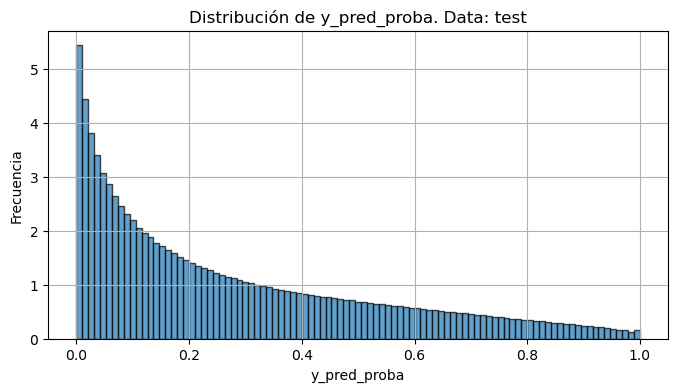

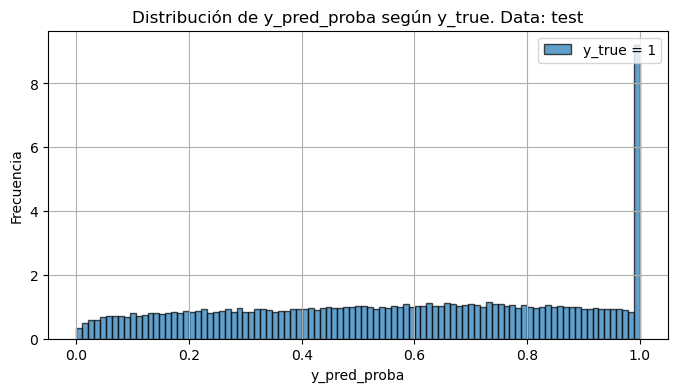

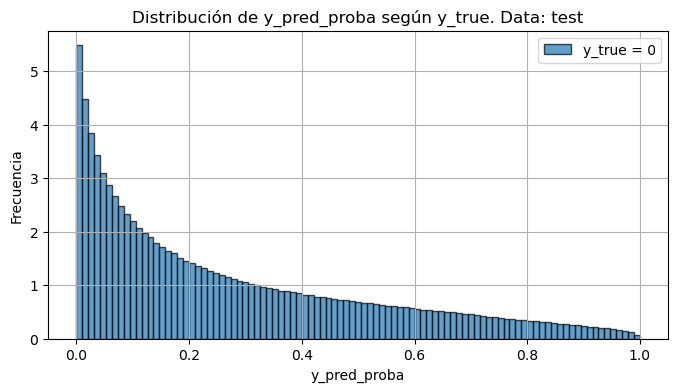

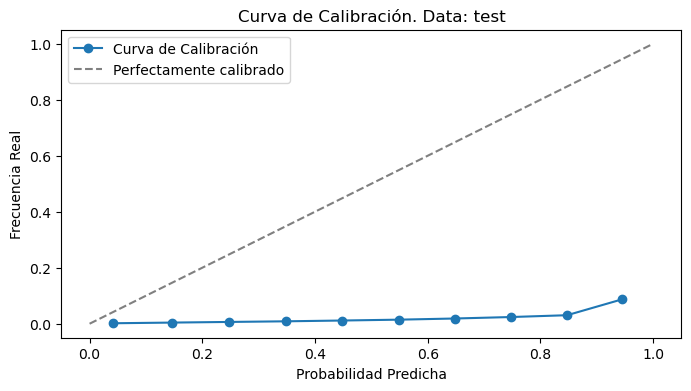

value           name_model  \
class_name metric_name    dataset_name                                
1          f1-score n_top test          4.1516  [3, 4, 5, 7, 9, 10]   
           true_sum n_top test           35755  [3, 4, 5, 7, 9, 10]   
           backtest       test          2.1198  [3, 4, 5, 7, 9, 10]   

                                       model_name       select_model  
class_name metric_name    dataset_name                                
1          f1-score n_top test           Ensamble  modelo_produccion  
           true_sum n_top test           Ensamble  modelo_produccion  
           backtest       test           Ensamble  modelo_produccion

In [22]:
info_save2=ms.calc_metrics_before_backtesting(info_save_all, info_save_temp,params)

In [26]:
# EDA MVP4, experimento 1, prueba 3
check_df_cientifico = info_save2['select_model2']
check_df_cientifico = check_df_cientifico[np.in1d(check_df_cientifico.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_cientifico = check_df_cientifico[check_df_cientifico['class_name'].isin([1,1.0,'1','1.0'])]
check_df_cientifico = check_df_cientifico.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_cientifico

value  \
metric_name     dataset_name class_name select_model        name_model                    
Precision n_top test         1          best_fitting_model  Run3                 1.8797   
                                        best_model_name     Run2                 2.1156   
                                        best_unbiased_model Run3                 1.8797   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  2.1352   
                train        1          best_fitting_model  Run3                 1.8909   
                                        best_model_name     Run2                  2.327   
                                        best_unbiased_model Run3                 1.8909   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  2.4651   
backtest        test         1          best_fitting_model  Run3                 1.8797   
                                        best_model_name     Run2                 2.1156   
                                        best_unbiased_model Run3                 1.8797   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  2.1352   
                train        1          best_fitting_model  Run3                 1.8909   
                                        best_model_name     Run2                  2.327   
                                        best_unbiased_model Run3                 1.8909   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  2.4651   
f1-score n_top  test         1          best_fitting_model  Run3                 3.6901   
                                        best_model_name     Run2                 4.1436   
                                        best_unbiased_model Run3                 3.6901   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  4.1811   
                train        1          best_fitting_model  Run3                 3.7116   
                                        best_model_name     Run2                 4.5482   
                                        best_unbiased_model Run3                 3.7116   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  4.8117   
recall n_top    test         1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]   100.0   
                train        1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]   100.0   

                                                                                      model_name  
metric_name     dataset_name class_name select_model        name_model                            
Precision n_top test         1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run2                       xgboost_1  
                                        best_unbiased_model Run3                 random_forest_2  
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]         Ensamble  
                train        1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run2                       xgboost_1  
                                        best_unbiased_model Run3                 random_forest_2  
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]         Ensamble

In [23]:
# EDA MVP4, experimento 2, prueba 4
check_df_cientifico = info_save2['select_model2']
check_df_cientifico = check_df_cientifico[np.in1d(check_df_cientifico.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_cientifico = check_df_cientifico[check_df_cientifico['class_name'].isin([1,1.0,'1','1.0'])]
check_df_cientifico = check_df_cientifico.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_cientifico

value  \
metric_name     dataset_name class_name select_model        name_model                    
Precision n_top test         1          best_fitting_model  Run3                 1.7931   
                                        best_model_name     Run11                2.1328   
                                        best_unbiased_model Run3                 1.7931   
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]  2.1198   
                train        1          best_fitting_model  Run3                  1.799   
                                        best_model_name     Run11                2.9302   
                                        best_unbiased_model Run3                  1.799   
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]   2.545   
backtest        test         1          best_fitting_model  Run3                 1.7931   
                                        best_model_name     Run11                2.1328   
                                        best_unbiased_model Run3                 1.7931   
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]  2.1198   
                train        1          best_fitting_model  Run3                  1.799   
                                        best_model_name     Run11                2.9302   
                                        best_unbiased_model Run3                  1.799   
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]   2.545   
f1-score n_top  test         1          best_fitting_model  Run3                 3.5231   
                                        best_model_name     Run11                4.1766   
                                        best_unbiased_model Run3                 3.5231   
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]  4.1516   
                train        1          best_fitting_model  Run3                 3.5344   
                                        best_model_name     Run11                5.6935   
                                        best_unbiased_model Run3                 3.5344   
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]  4.9636   
recall n_top    test         1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run11                 100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]   100.0   
                train        1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run11                 100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]   100.0   

                                                                                      model_name  
metric_name     dataset_name class_name select_model        name_model                            
Precision n_top test         1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run11                     xgboost_10  
                                        best_unbiased_model Run3                 random_forest_2  
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]         Ensamble  
                train        1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run11                     xgboost_10  
                                        best_unbiased_model Run3                 random_forest_2  
                                        modelo_produccion   [3, 4, 5, 7, 9, 10]         Ensamble

In [21]:
# sin eda, experimento 1
check_df_cientifico = info_save2['select_model2']
check_df_cientifico = check_df_cientifico[np.in1d(check_df_cientifico.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_cientifico = check_df_cientifico[check_df_cientifico['class_name'].isin([1,1.0,'1','1.0'])]
check_df_cientifico = check_df_cientifico.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_cientifico

value  \
metric_name     dataset_name class_name select_model        name_model                    
Precision n_top test         1          best_fitting_model  Run12                2.0344   
                                        best_model_name     Run2                 2.1813   
                                        best_unbiased_model Run3                 2.0075   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  2.1837   
                train        1          best_fitting_model  Run12                2.0389   
                                        best_model_name     Run2                 2.3458   
                                        best_unbiased_model Run3                 2.0137   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  2.3164   
backtest        test         1          best_fitting_model  Run12                2.0344   
                                        best_model_name     Run2                 2.1813   
                                        best_unbiased_model Run3                 2.0075   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  2.1837   
                train        1          best_fitting_model  Run12                2.0389   
                                        best_model_name     Run2                 2.3458   
                                        best_unbiased_model Run3                 2.0137   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  2.3164   
f1-score n_top  test         1          best_fitting_model  Run12                3.9876   
                                        best_model_name     Run2                 4.2694   
                                        best_unbiased_model Run3                  3.936   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  4.2741   
                train        1          best_fitting_model  Run12                3.9963   
                                        best_model_name     Run2                 4.5841   
                                        best_unbiased_model Run3                  3.948   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  4.5279   
recall n_top    test         1          best_fitting_model  Run12                 100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run12                 100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]   100.0   

                                                                                       model_name  
metric_name     dataset_name class_name select_model        name_model                             
Precision n_top test         1          best_fitting_model  Run12                random_forest_11  
                                        best_model_name     Run2                        xgboost_1  
                                        best_unbiased_model Run3                  random_forest_2  
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]          Ensamble  
                train        1          best_fitting_model  Run12                random_forest_11  
                                        best_model_name     Run2                        xgboost_1  
                                        best_unbiased_model Run3                  random_forest_2  
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]        

In [24]:
# sin eda, experimento 2
check_df_cientifico = info_save2['select_model2']
check_df_cientifico = check_df_cientifico[np.in1d(check_df_cientifico.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_cientifico = check_df_cientifico[check_df_cientifico['class_name'].isin([1,1.0,'1','1.0'])]
check_df_cientifico = check_df_cientifico.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_cientifico

value  \
metric_name     dataset_name class_name select_model        name_model                    
Precision n_top test         1          best_fitting_model  Run3                 2.0016   
                                        best_model_name     Run2                 2.1684   
                                        best_unbiased_model Run1                 2.1086   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  2.2088   
                train        1          best_fitting_model  Run3                 2.0102   
                                        best_model_name     Run2                 2.6928   
                                        best_unbiased_model Run1                 2.1157   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  2.5047   
backtest        test         1          best_fitting_model  Run3                 2.0016   
                                        best_model_name     Run2                 2.1684   
                                        best_unbiased_model Run1                 2.1086   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  2.2088   
                train        1          best_fitting_model  Run3                 2.0102   
                                        best_model_name     Run2                 2.6928   
                                        best_unbiased_model Run1                 2.1157   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  2.5047   
f1-score n_top  test         1          best_fitting_model  Run3                 3.9247   
                                        best_model_name     Run2                 4.2447   
                                        best_unbiased_model Run1                 4.1302   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  4.3222   
                train        1          best_fitting_model  Run3                 3.9412   
                                        best_model_name     Run2                 5.2444   
                                        best_unbiased_model Run1                 4.1438   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  4.8869   
recall n_top    test         1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run1                  100.0   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run1                  100.0   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]   100.0   

                                                                                      model_name  
metric_name     dataset_name class_name select_model        name_model                            
Precision n_top test         1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run2                       xgboost_1  
                                        best_unbiased_model Run1                           MLP_0  
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]         Ensamble  
                train        1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run2                       xgboost_1  
                                        best_unbiased_model Run1                           MLP_0  
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]         Ensamble

In [24]:
# ks en uno de los modeos del ensamble
display(info_save2[info_save2['modelo_produccion']['nodos_select'][0]]['ks_train'].head())
display(info_save2[info_save2['modelo_produccion']['nodos_select'][0]]['ks_test'].head())

,prob_min,prob_max,tasa_aperturas
0,75.12,100.00,4.21
1,71.88,75.12,3.23
2,69.13,71.88,2.72
3,66.61,69.13,2.37
4,64.42,66.61,2.16


,prob_min,prob_max,tasa_aperturas
0,75.13,99.97,4.18
1,71.88,75.13,3.06
2,69.10,71.88,2.75
3,66.60,69.10,2.34
4,64.41,66.60,2.15


# optimizar ensamblado

In [25]:
train = info_save2['Votaciones']['train']
train2 = train.replace(0,np.nan).dropna(how = 'all').replace(np.nan,0)
index_train = ~train.index.isin(train2.index.tolist())
drops = train.index[index_train]
train.shape

test = info_save2['Votaciones']['test']
test2 = test.replace(0,np.nan).dropna(how = 'all').replace(np.nan,0)
index_test = ~test.index.isin(test2.index.tolist())
drops2 = test.index[index_test]
#test.index = list(range(test.shape[0]))
test.shape

(5622397, 7)

In [26]:
best_probs = params['n_obs_filter']
best_probs = 0.2
import itertools
from multiprocessing import Pool, cpu_count
import matplotlib.pyplot as plt
import seaborn as sns
import time
import math
def calcular_metricas(itter,best_probs = best_probs):
    res = results[itter]
    total_count = res.shape[0]
    selected = res.nlargest(int(total_count * best_probs)).index
    return itter, y_true['y'][selected].sum()  # o la métrica que necesites

mejor_test_dado_mejores_train = True
ignore_train = False
first_loop = False

In [47]:
mejor_test_dado_mejores_train = True
ignore_train = False
first_loop = True

In [36]:
mejor_test_dado_mejores_train = False
ignore_train = True
first_loop = True

In [48]:
# Obtener el número de núcleos disponibles
timing = time.time()
num_nucleos = int(cpu_count()/2) # Puedes ajustar este número según sea necesario
msj = ['Train Data','Test Data']
lopps_df = [train,test]
nulls = [drops,drops2]
if ignore_train == True:
    msj = ["test Data"]
    lopps_df = [test]
    nulls = [drops2]
df_model_unic = pd.DataFrame()

for t,df_select in enumerate(lopps_df):
    y_true = df_select[['y']]
    tot = int(y_true.shape[0]*best_probs)
    print("N TOP",tot,".EMPEZAMOS: ",msj[t])
    dropping = nulls[t]
    df_select = df_select.drop('y', axis = 1).drop(dropping, axis = 0)

    if t == 0:
        n = df_select.shape[1]
        # Lista de elementos
        modelos = list(range(0,min(n,3),1)) # el algoritmo se ponderara son con 3 discriminaciones
        # Obtener todas las combinaciones de 2 elementos
        combinaciones = list(itertools.product(modelos, repeat = n))
        combinaciones = pd.DataFrame(combinaciones, columns = df_select.columns.tolist())
        weights = combinaciones.div(combinaciones.sum(axis=1), axis=0).dropna(how = 'all')
        modelos_unicos = []
        for i in range(n):
            filt = combinaciones[combinaciones[combinaciones.columns[i]] == 1]
            filt = filt.drop(combinaciones.columns[i], axis = 1)
            filt = filt.loc[(filt == 0).all(axis=1)]
            modelos_unicos.append(filt.index[0])
        weights_unicos = weights.loc[modelos_unicos]
        weights = weights.drop_duplicates()
    else:
        if mejor_test_dado_mejores_train == True:
            weights = weights.loc[best_iter_w.index.tolist()+modelos_unicos]
        else:
            pass
        #results_train = results.copy()
    logger.info(f"Numero de iteraciones: {weights.shape[0]}. {msj[t]}")
    #results = df_select @ weights.T # observaciones x iteraciones
    results = df_select.astype(np.float32).values @ weights.astype(np.float32).T.values
    results = pd.DataFrame(results, index = df_select.index, columns = weights.T.columns)
    nulos_temp =pd.DataFrame(np.zeros((dropping.shape[0],weights.shape[0])),index = dropping, columns = results.columns)
    results = pd.concat([results,nulos_temp], axis = 0)
    results = results.loc[y_true.index]
    # Usar Pool para paralelizar
    if __name__ == '__main__':
        with Pool(processes=num_nucleos) as pool:  # Especificar el número de núcleos
            resultados = pool.map(calcular_metricas, results.columns)
    
        # Convertir los resultados a un DataFrame
        epochs = pd.DataFrame(resultados, columns=['Iteracion', 'Valor'])
        epochs.set_index('Iteracion', inplace=True)

    maxi_true = epochs['Valor'].max()
    best_iter_w = epochs[epochs['Valor'] == maxi_true]
    trues = y_true['y'].sum()
    logger.info(f"TP: {maxi_true}. True: {trues}. Tasa de Exito: {np.round(maxi_true/tot*100,4)}%. Usando {best_probs} deciles para {msj[t]}")
    if best_iter_w.shape[0] == 1:
        logger.info(f"Numero de Iteraciones Finales: {best_iter_w.shape[0]}. {msj[t]}")
        print('------------------------')        
        break
    if t == 1:
        logger.info(f"Numero de Iteraciones Finales: {best_iter_w.shape[0]}. {msj[t]}")
        print('------------------------')
    if first_loop == True:
        break
minutess = (time.time() - timing) /60
hrs = math.floor(minutess / 60)
minutes = minutess - hrs * 60
logger.info(f"Hrs: {hrs}. Min {minutes}")
epochs.shape

N TOP 4497917 .EMPEZAMOS:  Train Data


[01/29/25 15:03:28] INFO     Numero de iteraciones: 665. Train Data                                ]8;id=257069;file:///tmp/ipykernel_210/3713006134.py\3713006134.py]8;;\:]8;id=46934;file:///tmp/ipykernel_210/3713006134.py#42\42]8;;\

[01/29/25 15:07:50] INFO     TP: 190422.0. True: 203101.0. Tasa de Exito: 4.2336%. Usando 0.2      ]8;id=15706;file:///tmp/ipykernel_210/3713006134.py\3713006134.py]8;;\:]8;id=246632;file:///tmp/ipykernel_210/3713006134.py#61\61]8;;\
                             deciles para Train Data                                                               

                    INFO     Numero de Iteraciones Finales: 1. Train Data                          ]8;id=994944;file:///tmp/ipykernel_210/3713006134.py\3713006134.py]8;;\:]8;id=967272;file:///tmp/ipykernel_210/3713006134.py#63\63]8;;\

------------------------


                    INFO     Hrs: 0. Min 4.384841851393381                                         ]8;id=488551;file:///tmp/ipykernel_210/3713006134.py\3713006134.py]8;;\:]8;id=141955;file:///tmp/ipykernel_210/3713006134.py#74\74]8;;\

(665, 1)

In [49]:
print(mejor_test_dado_mejores_train)
print(ignore_train)
print(first_loop)

True
False
True


In [50]:
epochs_select = (epochs.loc[modelos_unicos]/tot*100).round(4).sort_values(by="Valor", ascending = False)
mejor_unico = epochs_select.index[0]
print("Mejor modelo Unico")
display(combinaciones.loc[[mejor_unico]])
print("% TP en n_filt_obs de los modelos individuales o unicos ejecutados")
display(epochs_select)
print("Cominaciones e ietraciones de modelos unicos")
display(combinaciones.loc[modelos_unicos])
toti = int(y_true.shape[0]*0.1)
a,b = calcular_metricas(mejor_unico,0.1)
print("Decil 1: ",(a,np.round(100*b/toti,4)))
toti = int(y_true.shape[0]*0.2)
a,b = calcular_metricas(mejor_unico,0.2)
print("Decil 2: ",(a,np.round(100*b/toti,4)))
toti = int(y_true.shape[0]*0.3)
a,b = calcular_metricas(mejor_unico,0.3)
print("Decil 3: ",(a,np.round(100*b/toti,4)))

Mejor modelo Unico


,Run4,Run5,Run6,Run8,Run10,Run11
1,0,0,0,0,0,1


% TP en n_filt_obs de los modelos individuales o unicos ejecutados


,Valor
Iteracion,
1,4.2336
9,3.2687
81,2.8914
3,2.4316
27,2.3062
243,2.2084


Cominaciones e ietraciones de modelos unicos


,Run4,Run5,Run6,Run8,Run10,Run11
243,1,0,0,0,0,0
81,0,1,0,0,0,0
27,0,0,1,0,0,0
9,0,0,0,1,0,0
3,0,0,0,0,1,0
1,0,0,0,0,0,1


Decil 1:  (1, 7.4585)
Decil 2:  (1, 4.2336)
Decil 3:  (1, 2.9302)


In [51]:
epochs_select = (epochs/tot*100).round(4).sort_values(by="Valor", ascending = False)
mejor_combinado = epochs_select.index[0]
print("Mejor modelo Iteraciones")
display(combinaciones.loc[[mejor_combinado]])
print("% TP en n_filt_obs de los modelos individuales o unicos ejecutados")
display(epochs_select.head())
toti = int(y_true.shape[0]*0.1)
a,b = calcular_metricas(mejor_combinado,0.1)
print("Decil 1: ",(a,np.round(100*b/toti,4)))
toti = int(y_true.shape[0]*0.2)
a,b = calcular_metricas(mejor_combinado,0.2)
print("Decil 2: ",(a,np.round(100*b/toti,4)))
toti = int(y_true.shape[0]*0.3)
a,b = calcular_metricas(mejor_combinado,0.3)
print("Decil 3: ",(a,np.round(100*b/toti,4)))

Mejor modelo Iteraciones


,Run4,Run5,Run6,Run8,Run10,Run11
1,0,0,0,0,0,1


% TP en n_filt_obs de los modelos individuales o unicos ejecutados


,Valor
Iteracion,
1,4.2336
11,4.0960
83,4.0624
29,4.0598
5,4.0596


Decil 1:  (1, 7.4585)
Decil 2:  (1, 4.2336)
Decil 3:  (1, 2.9302)


**Experimento 4**

In [52]:
# EDA MVP4, experimento 2, prueba 4
iterr = [95,92,14,101,335] # test best in test
iterr2 = iterr   # test best in train
iterr3 = [1,11,83,29,5] # train best in test
iterr4 = iterr3 # train best in train

In [43]:
# EDA MVP4, experimento 2, prueba 4
# test best in test
display(combinaciones.loc[iterr])
display(epochs_select.loc[iterr])

,Run4,Run5,Run6,Run8,Run10,Run11
95,0,1,0,1,1,2
92,0,1,0,1,0,2
14,0,0,0,1,1,2
101,0,1,0,2,0,2
335,1,1,0,1,0,2


,Valor
Iteracion,
95,2.7264
92,2.7231
14,2.7212
101,2.7210
335,2.7198


In [53]:
# EDA MVP4, experimento 2, prueba 4
# test best in train
display(combinaciones.loc[iterr2])
display(epochs_select.loc[iterr2])

,Run4,Run5,Run6,Run8,Run10,Run11
95,0,1,0,1,1,2
92,0,1,0,1,0,2
14,0,0,0,1,1,2
101,0,1,0,2,0,2
335,1,1,0,1,0,2


,Valor
Iteracion,
95,3.8744
92,3.9764
14,3.9787
101,3.9026
335,3.8650


In [44]:
# EDA MVP4, experimento 2, prueba 4
# train best in test
display(combinaciones.loc[iterr3])
display(epochs_select.loc[iterr3])

,Run4,Run5,Run6,Run8,Run10,Run11
1,0,0,0,0,0,1
11,0,0,0,1,0,2
83,0,1,0,0,0,2
29,0,0,1,0,0,2
5,0,0,0,0,1,2


,Valor
Iteracion,
1,2.6484
11,2.7102
83,2.7131
29,2.6830
5,2.6980


In [54]:
# EDA MVP4, experimento 2, prueba 4
# train best in train
display(combinaciones.loc[iterr4])
display(epochs_select.loc[iterr4])

,Run4,Run5,Run6,Run8,Run10,Run11
1,0,0,0,0,0,1
11,0,0,0,1,0,2
83,0,1,0,0,0,2
29,0,0,1,0,0,2
5,0,0,0,0,1,2


,Valor
Iteracion,
1,4.2336
11,4.0960
83,4.0624
29,4.0598
5,4.0596


**Experimento 3**

In [57]:
# EDA MVP4, experimento 1, prueba 3
iterr = [101,263,335,344,173] # test best in test
iterr2 = iterr   # test best in train
iterr3 = [1,11,245,83,5] # train best in test
iterr4 = iterr3 # train best in train

In [48]:
# EDA MVP4, experimento 1, prueba 3
# test best in test
display(combinaciones.loc[iterr])
display(epochs_select.loc[iterr])

,Run2,Run5,Run7,Run8,Run9,Run11
101,0,1,0,2,0,2
263,1,0,0,2,0,2
335,1,1,0,1,0,2
344,1,1,0,2,0,2
173,0,2,0,1,0,2


,Valor
Iteracion,
101,2.6947
263,2.6936
335,2.6930
344,2.6918
173,2.6916


In [58]:
# EDA MVP4, experimento 1, prueba 3
# test best in train
display(combinaciones.loc[iterr2])
display(epochs_select.loc[iterr2])

,Run2,Run5,Run7,Run8,Run9,Run11
101,0,1,0,2,0,2
263,1,0,0,2,0,2
335,1,1,0,1,0,2
344,1,1,0,2,0,2
173,0,2,0,1,0,2


,Valor
Iteracion,
101,3.6431
263,3.6517
335,3.6311
344,3.5711
173,3.6219


In [49]:
# EDA MVP4, experimento 1, prueba 3
# train best in test
display(combinaciones.loc[iterr3])
display(epochs_select.loc[iterr3])

,Run2,Run5,Run7,Run8,Run9,Run11
1,0,0,0,0,0,1
11,0,0,0,1,0,2
245,1,0,0,0,0,2
83,0,1,0,0,0,2
5,0,0,0,0,1,2


,Valor
Iteracion,
1,2.6299
11,2.6786
245,2.6788
83,2.6803
5,2.6400


In [59]:
# EDA MVP4, experimento 1, prueba 3
# train best in train
display(combinaciones.loc[iterr4])
display(epochs_select.loc[iterr4])

,Run2,Run5,Run7,Run8,Run9,Run11
1,0,0,0,0,0,1
11,0,0,0,1,0,2
245,1,0,0,0,0,2
83,0,1,0,0,0,2
5,0,0,0,0,1,2


,Valor
Iteracion,
1,3.9880
11,3.8457
245,3.8279
83,3.8201
5,3.8124


**Sin eda Experimento 1**

In [50]:
# sin eda, experimento 1
iterr = [167,86,95,176,89] # test best in test
iterr2 = iterr   # test best in train
iterr3 = [1,5,83,4,82] # train best in test
iterr4 = iterr3 # train best in train

In [40]:
# sin eda, experimento 1
# test best in test
display(combinaciones.loc[iterr])
display(epochs_select.loc[iterr])

,Run1,Run2,Run3,Run5,Run8,Run11
167,0,2,0,0,1,2
86,0,1,0,0,1,2
95,0,1,0,1,1,2
176,0,2,0,1,1,2
89,0,1,0,0,2,2


,Valor
Iteracion,
167,2.7443
86,2.7430
95,2.7422
176,2.7421
89,2.7418


In [51]:
# sin eda, experimento 1
# test best in train
display(combinaciones.loc[iterr2])
display(epochs_select.loc[iterr2])

,Run1,Run2,Run3,Run5,Run8,Run11
167,0,2,0,0,1,2
86,0,1,0,0,1,2
95,0,1,0,1,1,2
176,0,2,0,1,1,2
89,0,1,0,0,2,2


,Valor
Iteracion,
167,3.2162
86,3.2418
95,3.1883
176,3.1721
89,3.2148


In [41]:
# sin eda, experimento 1
# train best in test
display(combinaciones.loc[iterr3])
display(epochs_select.loc[iterr3])

,Run1,Run2,Run3,Run5,Run8,Run11
1,0,0,0,0,0,1
5,0,0,0,0,1,2
83,0,1,0,0,0,2
4,0,0,0,0,1,1
82,0,1,0,0,0,1


,Valor
Iteracion,
1,2.7281
5,2.7371
83,2.7417
4,2.7369
82,2.7387


In [52]:
# sin eda, experimento 1
# train best in train
display(combinaciones.loc[iterr4])
display(epochs_select.loc[iterr4])

,Run1,Run2,Run3,Run5,Run8,Run11
1,0,0,0,0,0,1
5,0,0,0,0,1,2
83,0,1,0,0,0,2
4,0,0,0,0,1,1
82,0,1,0,0,0,1


,Valor
Iteracion,
1,3.3763
5,3.2870
83,3.2846
4,3.2447
82,3.2421


**Sin eda Experimento 2**

In [41]:
# sin eda, experimento 2
iterr = [410,194,416,200,419] # test best in test
iterr2 = iterr   # test best in train
iterr3 = [1,83,82,163,5] # train best in test
iterr4 = iterr3 # train best in train

In [42]:
# test best in test
display(combinaciones.loc[iterr])
display(epochs_select.loc[iterr])

,Run1,Run2,Run4,Run5,Run8,Run11
410,1,2,0,0,1,2
194,0,2,1,0,1,2
416,1,2,0,1,0,2
200,0,2,1,1,0,2
419,1,2,0,1,1,2


,Valor
Iteracion,
410,2.8010
194,2.8001
416,2.7996
200,2.7978
419,2.7977


In [52]:
# test best in train
display(combinaciones.loc[iterr2])
display(epochs_select.loc[iterr2])

,Run1,Run2,Run4,Run5,Run8,Run11
410,1,2,0,0,1,2
194,0,2,1,0,1,2
416,1,2,0,1,0,2
200,0,2,1,1,0,2
419,1,2,0,1,1,2


,Valor
Iteracion,
410,2.8010
194,2.8001
416,2.7996
200,2.7978
419,2.7977


In [44]:
# train best in test
display(combinaciones.loc[iterr3])
display(epochs_select.loc[iterr3])

,Run1,Run2,Run4,Run5,Run8,Run11
1,0,0,0,0,0,1
83,0,1,0,0,0,2
82,0,1,0,0,0,1
163,0,2,0,0,0,1
5,0,0,0,0,1,2


,Valor
Iteracion,
1,2.6887
83,2.7639
82,2.7666
163,2.7679
5,2.7511


In [53]:
# train best in train
display(combinaciones.loc[iterr4])
display(epochs_select.loc[iterr4])

,Run1,Run2,Run4,Run5,Run8,Run11
1,0,0,0,0,0,1
83,0,1,0,0,0,2
82,0,1,0,0,0,1
163,0,2,0,0,0,1
5,0,0,0,0,1,2


,Valor
Iteracion,
1,2.6887
83,2.7639
82,2.7666
163,2.7679
5,2.7511


**Analisis**

In [56]:
combinaciones_interes = list(set([mejor_unico]+iterr+iterr2+iterr3+iterr4))
rangos = sorted(list(set([params['n_obs_filter'],0.01,0.05,0.1,0.2,0.3,0.5])))
print('Iteracion: ',combinaciones_interes)
print('Calling: ',rangos)

Iteracion:  [1, 101, 5, 11, 14, 335, 83, 92, 29, 95]
Calling:  [0.01, 0.05, 0.1, 0.2, 0.3, 0.5]


In [57]:
# sin eda train, prueba 4 - experimento 2 Feature selection MVP4
summary = pd.DataFrame()
for mejor_combinado in combinaciones_interes:
    toti = int(y_true.shape[0]*0.1)
    
    for nodo in rangos:
        a,b = calcular_metricas(mejor_combinado,nodo)
        res1234 = np.round(100*b/toti,4)
        summary.loc[mejor_combinado,nodo] = res1234
summary.index.name = 'Iteraccion'
summary

,0.01,0.05,0.10,0.20,0.30,0.50
Iteraccion,,,,,,
1,2.8756,6.0879,7.4585,8.4671,8.7906,8.8598
101,2.6994,5.4416,6.7057,7.8053,8.3156,8.8426
5,2.8280,5.8870,7.1765,8.1192,8.4424,8.8370
11,2.8331,5.8692,7.1855,8.1920,8.5696,8.8516
14,2.7858,5.6843,6.9397,7.9575,8.3873,8.8373
335,2.7237,5.4797,6.6895,7.7299,8.2592,8.8333
83,2.8041,5.8350,7.1388,8.1247,8.5073,8.8421
92,2.7603,5.6363,6.9058,7.9528,8.4056,8.8426
29,2.8471,5.9230,7.2218,8.1196,8.4150,8.8342


In [46]:
# sin eda test, prueba 4 - experimento 2 Feature selection MVP4
summary_test = pd.DataFrame()
for mejor_combinado in combinaciones_interes:
    toti = int(y_true.shape[0]*0.1)
    
    for nodo in rangos:
        a,b = calcular_metricas(mejor_combinado,nodo)
        res1234 = np.round(100*b/toti,4)
        summary_test.loc[mejor_combinado,nodo] = res1234
summary_test.index.name = 'Iteraccion'
summary_test

,0.01,0.05,0.10,0.20,0.30,0.50
Iteraccion,,,,,,
1,1.2897,2.5646,3.7112,5.2969,6.3985,7.1372
101,1.3107,2.6606,3.8391,5.4420,6.5360,7.6969
5,1.2929,2.5921,3.7626,5.3959,6.4654,7.5685
11,1.3062,2.6492,3.8274,5.4205,6.4727,7.5653
14,1.3055,2.6366,3.8190,5.4423,6.5552,7.7188
335,1.3082,2.6471,3.8181,5.4397,6.5453,7.7577
83,1.3005,2.6439,3.8123,5.4262,6.4835,7.5722
92,1.3115,2.6636,3.8359,5.4463,6.5563,7.6969
29,1.2923,2.5621,3.7315,5.3660,6.4448,7.5505


In [61]:
# sin eda train, prueba 3 - experimento 1 Feature selection MVP4
summary = pd.DataFrame()
for mejor_combinado in combinaciones_interes:
    toti = int(y_true.shape[0]*0.1)
    
    for nodo in rangos:
        a,b = calcular_metricas(mejor_combinado,nodo)
        res1234 = np.round(100*b/toti,4)
        summary.loc[mejor_combinado,nodo] = res1234
summary.index.name = 'Iteraccion'
summary

,0.01,0.05,0.10,0.20,0.30,0.50
Iteraccion,,,,,,
1,2.3585,5.1903,6.6654,7.9760,8.5289,8.6729
101,2.2365,4.6345,5.9792,7.2861,7.9322,8.6495
5,2.3400,5.0383,6.4344,7.6247,8.1537,8.6317
263,2.2486,4.6445,5.9927,7.3034,7.9453,8.6501
11,2.3328,4.9924,6.4138,7.6915,8.3193,8.6596
173,2.2221,4.6144,5.9522,7.2439,7.8943,8.6495
335,2.2427,4.6308,5.9687,7.2622,7.9543,8.6452
83,2.3118,4.9681,6.3741,7.6402,8.2785,8.6494
245,2.3274,4.9812,6.3891,7.6558,8.2906,8.6514


In [51]:
# sin eda test, prueba 3 - experimento 1 Feature selection MVP4
summary_test = pd.DataFrame()
for mejor_combinado in combinaciones_interes:
    toti = int(y_true.shape[0]*0.1)
    
    for nodo in rangos:
        a,b = calcular_metricas(mejor_combinado,nodo)
        res1234 = np.round(100*b/toti,4)
        summary_test.loc[mejor_combinado,nodo] = res1234
summary_test.index.name = 'Iteraccion'
summary_test

,0.01,0.05,0.10,0.20,0.30,0.50
Iteraccion,,,,,,
1,1.2429,2.5176,3.6230,5.2599,6.3738,7.1286
101,1.2779,2.6281,3.7890,5.3893,6.5020,7.6094
5,1.2484,2.5217,3.6831,5.2800,6.4133,7.4952
263,1.2822,2.6218,3.7950,5.3872,6.5038,7.6144
11,1.2657,2.5991,3.7790,5.3572,6.4499,7.5265
173,1.2808,2.6275,3.7838,5.3831,6.5019,7.6094
335,1.2849,2.6325,3.7914,5.3860,6.5099,7.6473
83,1.2543,2.5960,3.7584,5.3605,6.4448,7.5187
245,1.2621,2.5959,3.7648,5.3575,6.4425,7.5183


In [54]:
# sin eda train
summary = pd.DataFrame()
for mejor_combinado in combinaciones_interes:
    toti = int(y_true.shape[0]*0.1)
    
    for nodo in rangos:
        a,b = calcular_metricas(mejor_combinado,nodo)
        res1234 = np.round(100*b/toti,4)
        summary.loc[mejor_combinado,nodo] = res1234
summary.index.name = 'Iteraccion'
summary

,0.01,0.05,0.10,0.20,0.30,0.50
Iteraccion,,,,,,
1,2.0804,4.0812,5.3395,6.7525,7.5689,7.9841
4,1.9819,3.8718,5.0862,6.4894,7.3056,7.9787
5,2.0337,3.9697,5.1884,6.5741,7.5032,7.9787
167,1.9669,3.8187,5.0166,6.4324,7.2408,7.9712
176,1.9301,3.7335,4.9252,6.3441,7.1780,7.9605
82,1.9957,3.8758,5.0809,6.4843,7.2968,7.9633
83,2.0390,3.9720,5.1854,6.5692,7.5001,7.9633
86,2.0035,3.8874,5.0862,6.4835,7.3320,7.9712
89,1.9588,3.8165,5.0145,6.4296,7.2478,7.9712


In [43]:
# sin eda test
summary_test = pd.DataFrame()
for mejor_combinado in combinaciones_interes:
    toti = int(y_true.shape[0]*0.1)
    
    for nodo in rangos:
        a,b = calcular_metricas(mejor_combinado,nodo)
        res1234 = np.round(100*b/toti,4)
        summary_test.loc[mejor_combinado,nodo] = res1234
summary_test.index.name = 'Iteraccion'
summary_test

,0.01,0.05,0.10,0.20,0.30,0.50
Iteraccion,,,,,,
1,1.3012,2.6508,3.8249,5.4562,6.5924,7.2768
4,1.3055,2.6675,3.8606,5.4738,6.6077,7.4568
5,1.3044,2.6743,3.8565,5.4742,6.6018,7.4568
167,1.3096,2.6732,3.8750,5.4886,6.6079,7.5107
176,1.3133,2.6677,3.8628,5.4841,6.6011,7.5413
82,1.3099,2.6784,3.8717,5.4774,6.6073,7.4534
83,1.3117,2.6791,3.8580,5.4834,6.6016,7.4534
86,1.3114,2.6761,3.8692,5.4861,6.6264,7.5107
89,1.3085,2.6718,3.8702,5.4836,6.6034,7.5107


In [54]:
# sin eda train, experimento 2
summary = pd.DataFrame()
for mejor_combinado in combinaciones_interes:
    toti = int(y_true.shape[0]*0.1)
    
    for nodo in rangos:
        a,b = calcular_metricas(mejor_combinado,nodo)
        res1234 = np.round(100*b/toti,4)
        summary.loc[mejor_combinado,nodo] = res1234
summary.index.name = 'Iteraccion'
summary

,0.01,0.05,0.10,0.20,0.30,0.50
Iteraccion,,,,,,
416,2.6713,5.1125,6.2941,7.3582,7.9451,8.5798
1,2.6297,5.4303,6.7679,7.9122,8.4282,8.6000
194,2.6806,5.1300,6.3227,7.4031,8.0057,8.5865
419,2.6342,5.0138,6.1884,7.2667,7.8849,8.5860
163,2.7141,5.2603,6.4993,7.6671,8.1711,8.6194
5,2.5839,5.2412,6.5122,7.6072,8.1888,8.5772
200,2.6715,5.1139,6.2950,7.3550,7.9426,8.5777
81,2.4780,4.9306,6.2085,7.4462,8.0784,8.3480
82,2.7531,5.3516,6.5960,7.7425,8.2577,8.6194


In [48]:
# sin eda test, experimento 2
summary_test = pd.DataFrame()
for mejor_combinado in combinaciones_interes:
    toti = int(y_true.shape[0]*0.1)
    
    for nodo in rangos:
        a,b = calcular_metricas(mejor_combinado,nodo)
        res1234 = np.round(100*b/toti,4)
        summary_test.loc[mejor_combinado,nodo] = res1234
summary_test.index.name = 'Iteraccion'
summary_test

,0.01,0.05,0.10,0.20,0.30,0.50
Iteraccion,,,,,,
416,1.3519,2.7867,4.0051,5.5992,6.6776,7.8244
1,1.3229,2.6571,3.8140,5.3774,6.4302,7.1692
194,1.3557,2.7778,4.0099,5.6003,6.6856,7.8477
419,1.3549,2.7824,3.9960,5.5955,6.6915,7.8600
163,1.3439,2.7730,3.9531,5.5359,6.5796,7.5852
5,1.3308,2.7277,3.9049,5.5023,6.5342,7.6032
200,1.3507,2.7814,4.0059,5.5957,6.6788,7.8269
81,1.2977,2.6533,3.8060,5.4128,6.5015,7.2161
82,1.3475,2.7832,3.9709,5.5332,6.6274,7.5852


**Sin EDA, exp1:**

<Axes: ylabel='Iteraccion'>

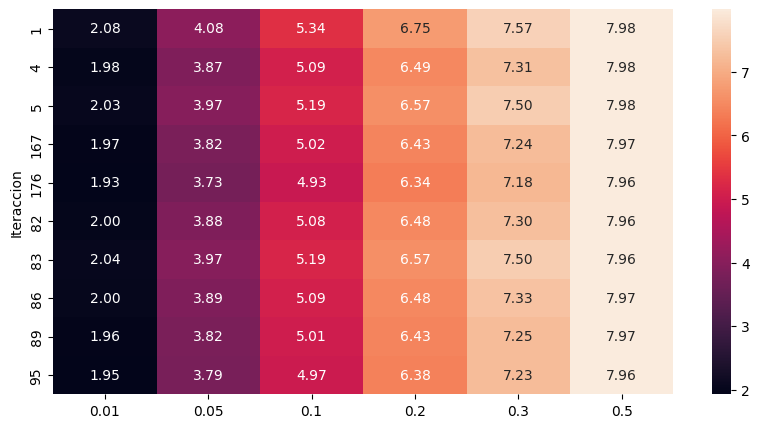

In [55]:
# sin eda train
plt.figure(figsize = (10,5))
sns.heatmap(summary, annot=True,  fmt=".2f")

<Axes: ylabel='Iteraccion'>

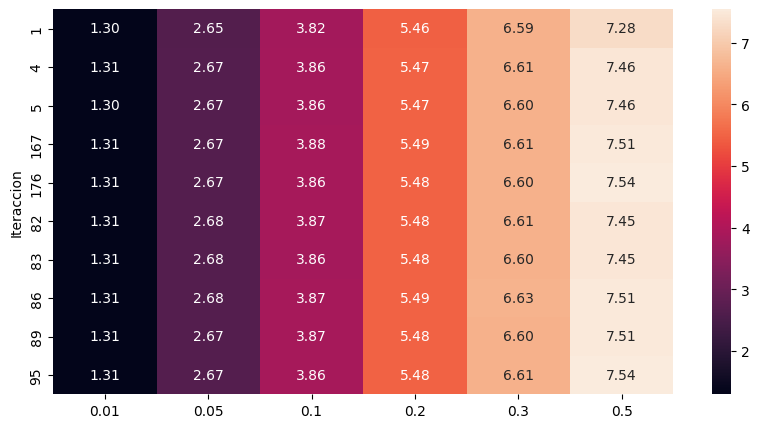

In [56]:
# sin eda test
plt.figure(figsize = (10,5))
sns.heatmap(summary_test, annot=True,  fmt=".2f")

<Axes: ylabel='Iteraccion'>

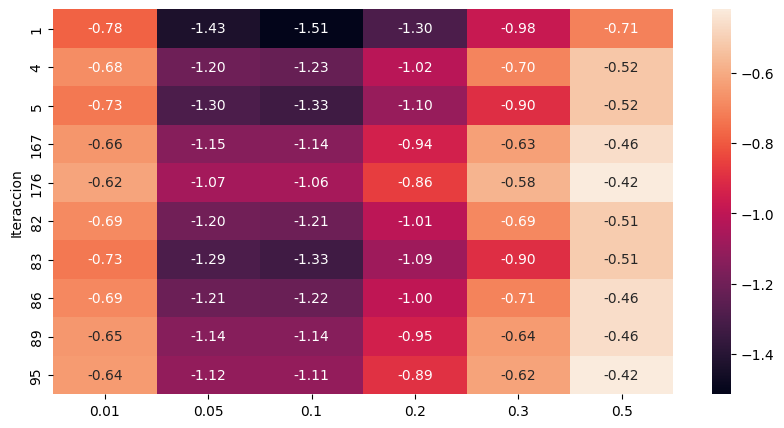

In [57]:
# sin eda test-train
plt.figure(figsize = (10,5))
sns.heatmap(summary_test -summary, annot=True,  fmt=".2f")

**Sin EDA, exp2**

<Axes: ylabel='Iteraccion'>

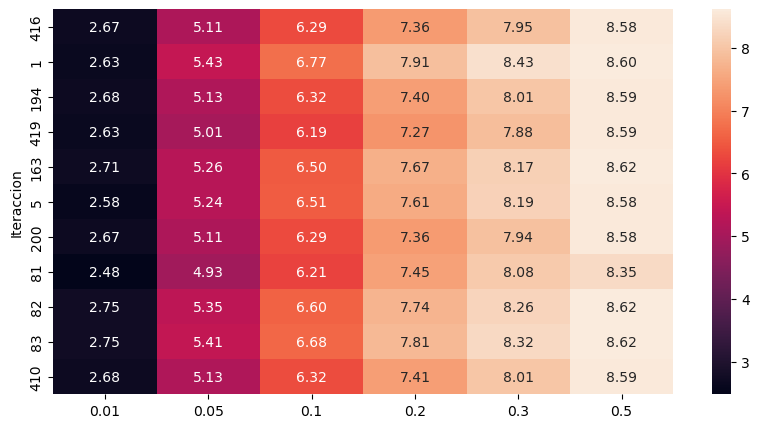

In [55]:
# sin eda train, experimento 2
plt.figure(figsize = (10,5))
sns.heatmap(summary, annot=True,  fmt=".2f")

<Axes: ylabel='Iteraccion'>

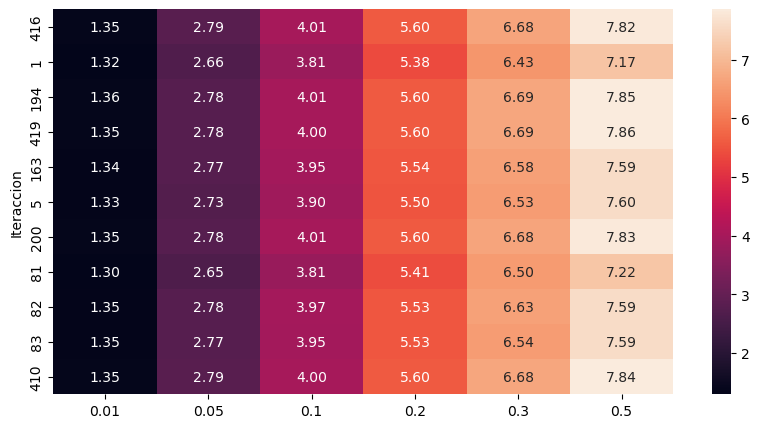

In [56]:
# sin eda test, experimento 2
plt.figure(figsize = (10,5))
sns.heatmap(summary_test, annot=True,  fmt=".2f")

<Axes: ylabel='Iteraccion'>

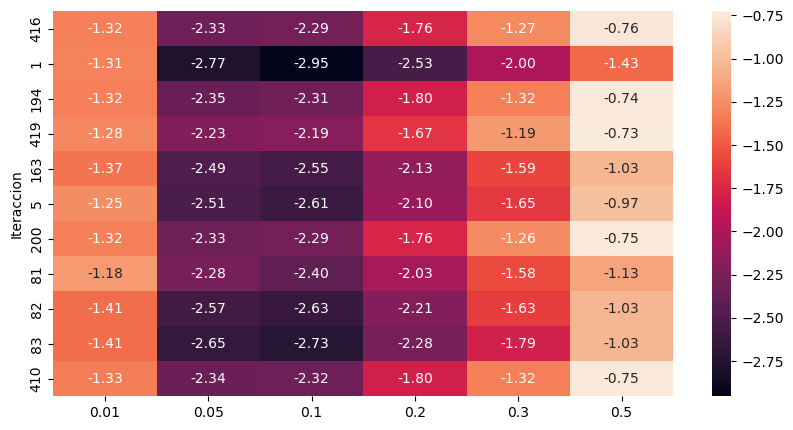

In [57]:
# sin eda test-train
plt.figure(figsize = (10,5))
sns.heatmap(summary_test -summary, annot=True,  fmt=".2f") 

**EDA MVP4, Prueba3, experimento 1**

<Axes: ylabel='Iteraccion'>

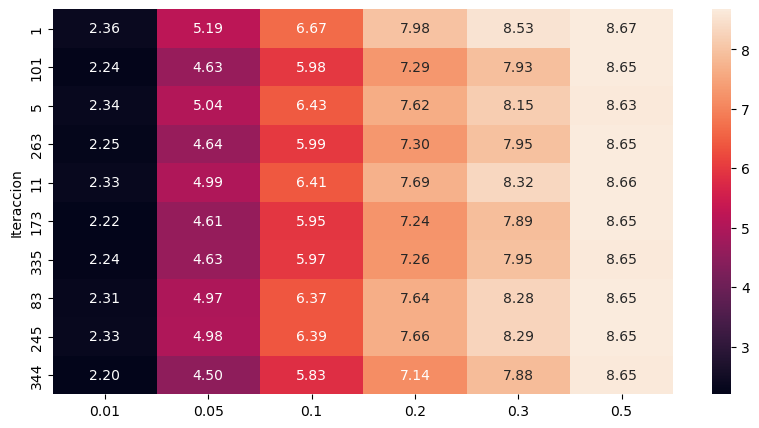

In [62]:
# EDA MVP4, experimento 1, prueba3
plt.figure(figsize = (10,5))
sns.heatmap(summary, annot=True,  fmt=".2f")

<Axes: ylabel='Iteraccion'>

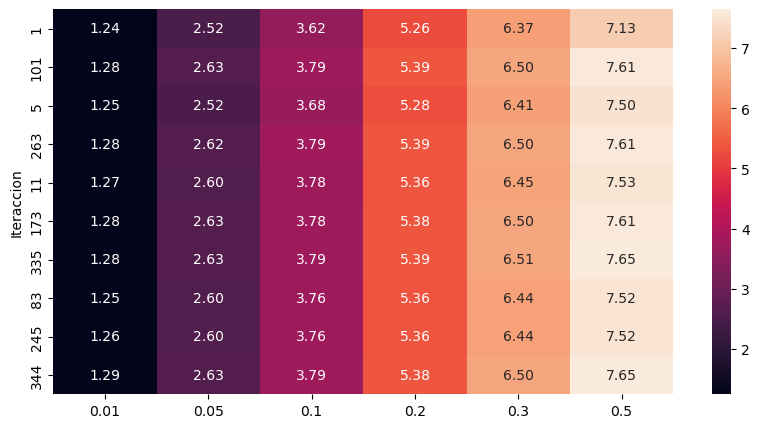

In [63]:
# EDA MVP4, experimento 1, prueba3
plt.figure(figsize = (10,5))
sns.heatmap(summary_test, annot=True,  fmt=".2f")

<Axes: ylabel='Iteraccion'>

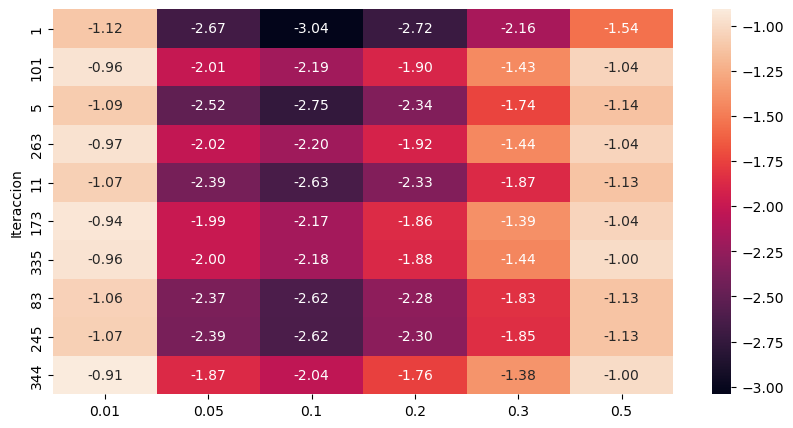

In [64]:
# EDA MVP4, experimento 1, prueba3,  test-train
plt.figure(figsize = (10,5))
sns.heatmap(summary_test -summary, annot=True,  fmt=".2f") 

**EDA MVP4, Prueba4, experimento 2**

<Axes: ylabel='Iteraccion'>

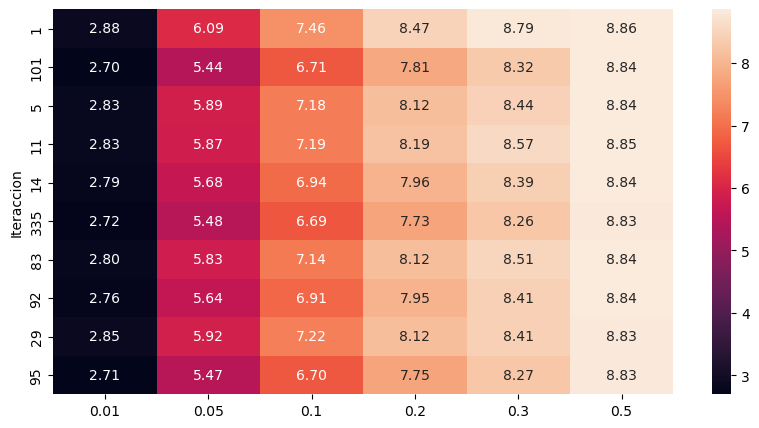

In [58]:
# EDA MVP4, experimento 2, prueba4
plt.figure(figsize = (10,5))
sns.heatmap(summary, annot=True,  fmt=".2f")

<Axes: ylabel='Iteraccion'>

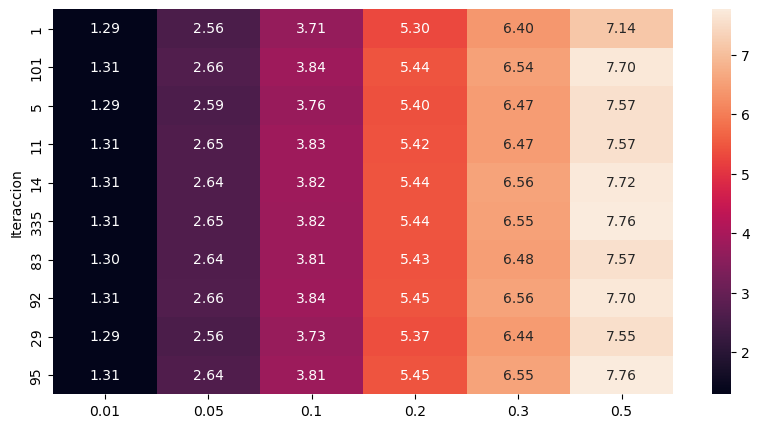

In [59]:
# EDA MVP4, experimento 2, prueba4
plt.figure(figsize = (10,5))
sns.heatmap(summary_test, annot=True,  fmt=".2f")

<Axes: ylabel='Iteraccion'>

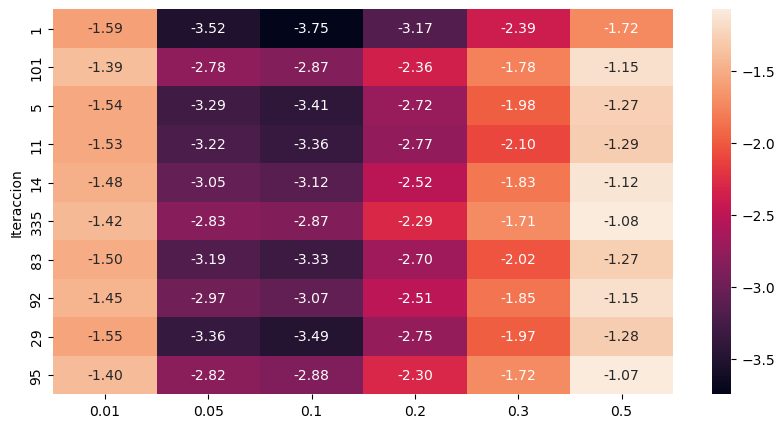

In [60]:
# EDA MVP4, experimento 2, prueba4,  test-train
plt.figure(figsize = (10,5))
sns.heatmap(summary_test -summary, annot=True,  fmt=".2f") 

<Axes: ylabel='Iteraccion'>

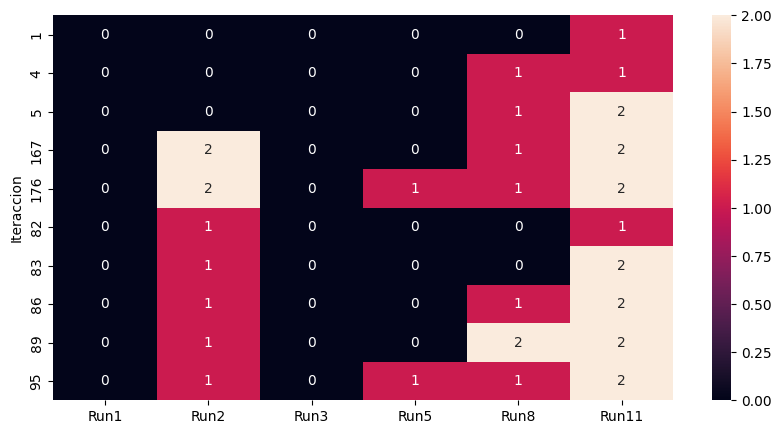

In [58]:
# sin eda, experimento 1
plt.figure(figsize = (10,5)) #modelo mejor: 95, 176 (el run2 es x2 en 176 y este modelo tiene el mejor f1 y lacombinacion tiene -overfitting)
sns.heatmap(combinaciones.loc[summary.index],annot=True)
# modelo 176 pero le fue mal en backtesting y el modelo 95 = info_save_select_v2 dio resultadosparecidos

<Axes: ylabel='Iteraccion'>

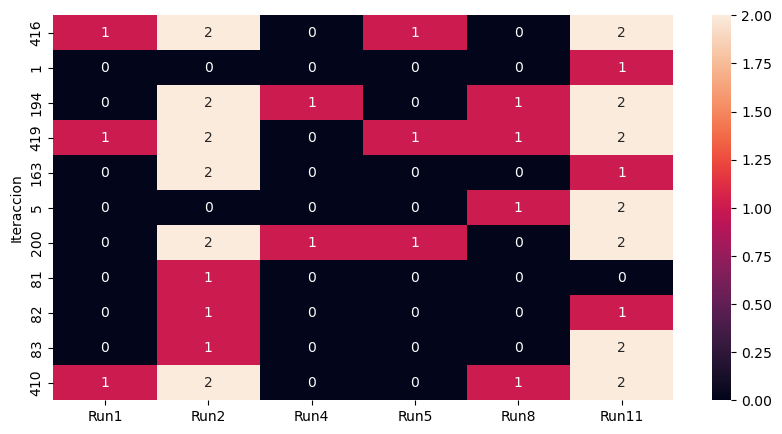

In [58]:
# sin eda, experimento 2
plt.figure(figsize = (10,5))
sns.heatmap(combinaciones.loc[summary.index],annot=True)
# mejormodelo el 419 y luego el modelo 194

<Axes: ylabel='Iteraccion'>

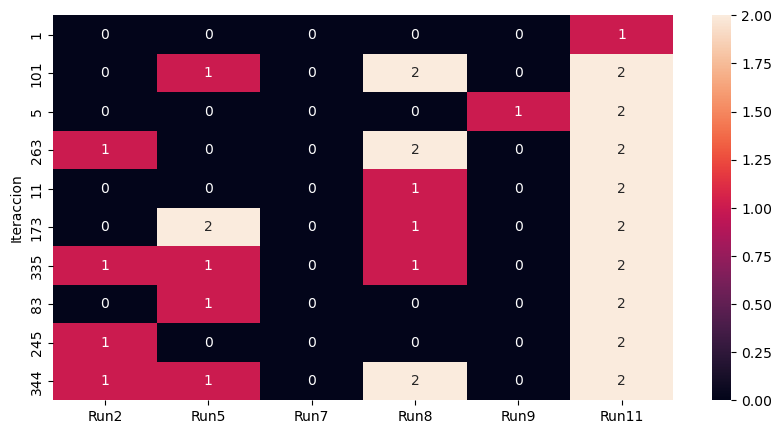

In [65]:
# EDA MVP4, experimento 1, prueba3
plt.figure(figsize = (10,5))
sns.heatmap(combinaciones.loc[summary.index],annot=True)
# modelo 344 y 335 son iguales en testeo pero es mejor 344 por menos overfitting

<Axes: ylabel='Iteraccion'>

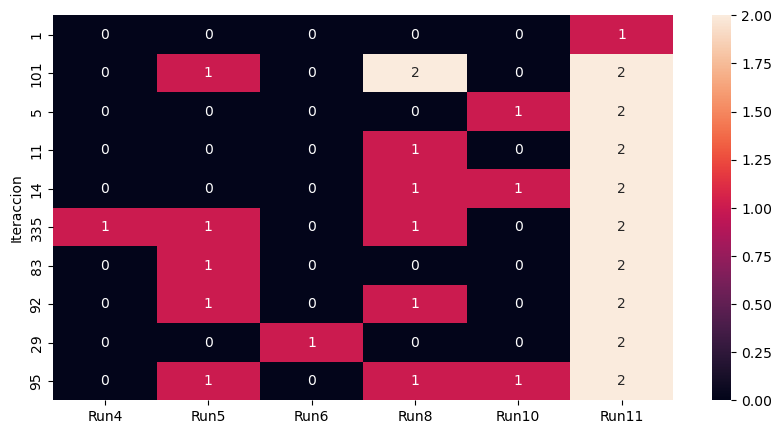

In [61]:
# EDA MVP4, experimento 2, prueba4
plt.figure(figsize = (10,5))
sns.heatmap(combinaciones.loc[summary.index],annot=True)
# modelo 335

In [62]:
# mejor modelo
check_df

value  \
metric_name     dataset_name class_name select_model        name_model                       
Precision n_top test         1          best_fitting_model  Run5                   38.3046   
                                        best_model_name     Run4                   74.6892   
                                        best_unbiased_model Run1                   73.0549   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  75.9876   
                train        1          best_fitting_model  Run5                   38.5012   
                                        best_model_name     Run4                   79.6692   
                                        best_unbiased_model Run1                   73.1474   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  78.9009   
backtest        test         1          best_fitting_model  Run5                   38.3046   
                                        best_model_name     Run4                   74.6892   
                                        best_unbiased_model Run1                   73.0549   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  75.9876   
                train        1          best_fitting_model  Run5                   38.5012   
                                        best_model_name     Run4                   79.6692   
                                        best_unbiased_model Run1                   73.1474   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  78.9009   
f1-score n_top  test         1          best_fitting_model  Run5                   55.3916   
                                        best_model_name     Run4                   85.5109   
                                        best_unbiased_model Run1                   84.4298   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  86.3556   
                train        1          best_fitting_model  Run5                   55.5969   
                                        best_model_name     Run4                   88.6843   
                                        best_unbiased_model Run1                   84.4915   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]  88.2063   
recall n_top    test         1          best_fitting_model  Run5                     100.0   
                                        best_model_name     Run4                     100.0   
                                        best_unbiased_model Run1                     100.0   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]    100.0   
                train        1          best_fitting_model  Run5                     100.0   
                                        best_model_name     Run4                     100.0   
                                        best_unbiased_model Run1                     100.0   
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]    100.0   

                                                                                        model_name  
metric_name     dataset_name class_name select_model        name_model                              
Precision n_top test         1          best_fitting_model  Run5                   random_forest_4  
                                        best_model_name     Run4                         xgboost_3  
                                        best_unbiased_model Run1                             MLP_0  
                                        modelo_produccion   [0, 1, 2, 3, 5, 6, 9]         Ensamble  
                train        1          best_fitting_model  Run5                   random_forest_4  
                                        best_model_name     Run4                         xgboost_3  
                                        best_unbiased_model Run1                

In [ ]:
# MVP2
check_df_mvp2

In [63]:
# ensamble sin optimizar, experimento 1
check_df_cientifico

value  \
metric_name     dataset_name class_name select_model        name_model                    
Precision n_top test         1          best_fitting_model  Run12                2.0344   
                                        best_model_name     Run2                 2.1813   
                                        best_unbiased_model Run3                 2.0075   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  2.1837   
                train        1          best_fitting_model  Run12                2.0389   
                                        best_model_name     Run2                 2.3458   
                                        best_unbiased_model Run3                 2.0137   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  2.3164   
backtest        test         1          best_fitting_model  Run12                2.0344   
                                        best_model_name     Run2                 2.1813   
                                        best_unbiased_model Run3                 2.0075   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  2.1837   
                train        1          best_fitting_model  Run12                2.0389   
                                        best_model_name     Run2                 2.3458   
                                        best_unbiased_model Run3                 2.0137   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  2.3164   
f1-score n_top  test         1          best_fitting_model  Run12                3.9876   
                                        best_model_name     Run2                 4.2694   
                                        best_unbiased_model Run3                  3.936   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  4.2741   
                train        1          best_fitting_model  Run12                3.9963   
                                        best_model_name     Run2                 4.5841   
                                        best_unbiased_model Run3                  3.948   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]  4.5279   
recall n_top    test         1          best_fitting_model  Run12                 100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run12                 100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]   100.0   

                                                                                       model_name  
metric_name     dataset_name class_name select_model        name_model                             
Precision n_top test         1          best_fitting_model  Run12                random_forest_11  
                                        best_model_name     Run2                        xgboost_1  
                                        best_unbiased_model Run3                  random_forest_2  
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]          Ensamble  
                train        1          best_fitting_model  Run12                random_forest_11  
                                        best_model_name     Run2                        xgboost_1  
                                        best_unbiased_model Run3                  random_forest_2  
                                        modelo_produccion   [0, 1, 2, 4, 7, 10]        

In [59]:
# ensamble sin optimizar, experimento 2
check_df_cientifico

value  \
metric_name     dataset_name class_name select_model        name_model                    
Precision n_top test         1          best_fitting_model  Run3                 2.0016   
                                        best_model_name     Run2                 2.1684   
                                        best_unbiased_model Run1                 2.1086   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  2.2088   
                train        1          best_fitting_model  Run3                 2.0102   
                                        best_model_name     Run2                 2.6928   
                                        best_unbiased_model Run1                 2.1157   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  2.5047   
backtest        test         1          best_fitting_model  Run3                 2.0016   
                                        best_model_name     Run2                 2.1684   
                                        best_unbiased_model Run1                 2.1086   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  2.2088   
                train        1          best_fitting_model  Run3                 2.0102   
                                        best_model_name     Run2                 2.6928   
                                        best_unbiased_model Run1                 2.1157   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  2.5047   
f1-score n_top  test         1          best_fitting_model  Run3                 3.9247   
                                        best_model_name     Run2                 4.2447   
                                        best_unbiased_model Run1                 4.1302   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  4.3222   
                train        1          best_fitting_model  Run3                 3.9412   
                                        best_model_name     Run2                 5.2444   
                                        best_unbiased_model Run1                 4.1438   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]  4.8869   
recall n_top    test         1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run1                  100.0   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run1                  100.0   
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]   100.0   

                                                                                      model_name  
metric_name     dataset_name class_name select_model        name_model                            
Precision n_top test         1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run2                       xgboost_1  
                                        best_unbiased_model Run1                           MLP_0  
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]         Ensamble  
                train        1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run2                       xgboost_1  
                                        best_unbiased_model Run1                           MLP_0  
                                        modelo_produccion   [0, 1, 3, 4, 7, 10]         Ensamble

In [66]:
# ensamble sin optimizar, prueba 3, experimento 1 =EDA MVP4
check_df_cientifico

value  \
metric_name     dataset_name class_name select_model        name_model                    
Precision n_top test         1          best_fitting_model  Run3                 1.8797   
                                        best_model_name     Run2                 2.1156   
                                        best_unbiased_model Run3                 1.8797   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  2.1352   
                train        1          best_fitting_model  Run3                 1.8909   
                                        best_model_name     Run2                  2.327   
                                        best_unbiased_model Run3                 1.8909   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  2.4651   
backtest        test         1          best_fitting_model  Run3                 1.8797   
                                        best_model_name     Run2                 2.1156   
                                        best_unbiased_model Run3                 1.8797   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  2.1352   
                train        1          best_fitting_model  Run3                 1.8909   
                                        best_model_name     Run2                  2.327   
                                        best_unbiased_model Run3                 1.8909   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  2.4651   
f1-score n_top  test         1          best_fitting_model  Run3                 3.6901   
                                        best_model_name     Run2                 4.1436   
                                        best_unbiased_model Run3                 3.6901   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  4.1811   
                train        1          best_fitting_model  Run3                 3.7116   
                                        best_model_name     Run2                 4.5482   
                                        best_unbiased_model Run3                 3.7116   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]  4.8117   
recall n_top    test         1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]   100.0   
                train        1          best_fitting_model  Run3                  100.0   
                                        best_model_name     Run2                  100.0   
                                        best_unbiased_model Run3                  100.0   
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]   100.0   

                                                                                      model_name  
metric_name     dataset_name class_name select_model        name_model                            
Precision n_top test         1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run2                       xgboost_1  
                                        best_unbiased_model Run3                 random_forest_2  
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]         Ensamble  
                train        1          best_fitting_model  Run3                 random_forest_2  
                                        best_model_name     Run2                       xgboost_1  
                                        best_unbiased_model Run3                 random_forest_2  
                                        modelo_produccion   [1, 4, 6, 7, 8, 10]         Ensamble

In [64]:
info_save_select_ensamble = catalog.load("info_save_select_mvp7") # modelo generado 176, experimento 1
print('Run_name: ',info_save_select_ensamble['modelo_produccion']['nodos_select'])
print('W: ',info_save_select_ensamble['modelo_produccion']['weights'])
check_df_opt = info_save_select_ensamble['select_model2']
check_df_opt = check_df_opt[np.in1d(check_df_opt.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_opt = check_df_opt[check_df_opt['class_name'].isin([1,1.0,'1','1.0'])]
check_df_opt = check_df_opt.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_opt

[01/14/25 21:03:57] INFO     Loading data from 'info_save_select' (PickleDataSet)...            ]8;id=449413;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=714181;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

Run_name:  [1, 4, 7, 10]
W:  [2, 1, 1, 2]


value  \
metric_name     dataset_name class_name select_model        name_model              
Precision n_top test         1          best_fitting_model  Run12          2.0344   
                                        best_model_name     Run2           2.1813   
                                        best_unbiased_model Run3           2.0075   
                                        modelo_produccion   [1, 4, 7, 10]  2.2004   
                train        1          best_fitting_model  Run12          2.0389   
                                        best_model_name     Run2           2.3458   
                                        best_unbiased_model Run3           2.0137   
                                        modelo_produccion   [1, 4, 7, 10]  2.3927   
backtest        test         1          best_fitting_model  Run12          2.0344   
                                        best_model_name     Run2           2.1813   
                                        best_unbiased_model Run3           2.0075   
                                        modelo_produccion   [1, 4, 7, 10]  2.2004   
                train        1          best_fitting_model  Run12          2.0389   
                                        best_model_name     Run2           2.3458   
                                        best_unbiased_model Run3           2.0137   
                                        modelo_produccion   [1, 4, 7, 10]  2.3927   
f1-score n_top  test         1          best_fitting_model  Run12          3.9876   
                                        best_model_name     Run2           4.2694   
                                        best_unbiased_model Run3            3.936   
                                        modelo_produccion   [1, 4, 7, 10]   4.306   
                train        1          best_fitting_model  Run12          3.9963   
                                        best_model_name     Run2           4.5841   
                                        best_unbiased_model Run3            3.948   
                                        modelo_produccion   [1, 4, 7, 10]  4.6735   
recall n_top    test         1          best_fitting_model  Run12           100.0   
                                        best_model_name     Run2            100.0   
                                        best_unbiased_model Run3            100.0   
                                        modelo_produccion   [1, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run12           100.0   
                                        best_model_name     Run2            100.0   
                                        best_unbiased_model Run3            100.0   
                                        modelo_produccion   [1, 4, 7, 10]   100.0   

                                                                                 model_name  
metric_name     dataset_name class_name select_model        name_model                       
Precision n_top test         1          best_fitting_model  Run12          random_forest_11  
                                        best_model_name     Run2                  xgboost_1  
                                        best_unbiased_model Run3            random_forest_2  
                                        modelo_produccion   [1, 4, 7, 10]          Ensamble  
                train        1          best_fitting_model  Run12          random_forest_11  
                                        best_model_name     Run2                  xgboost_1  
                                        best_unbiased_model Run3            random_forest_2  
                                        modelo_produccion   [1, 4, 7, 10]          Ensamble  
backtest        test         1          best_fitting_model  Run12          random_forest_11  
                                        best_model_name     Run2                  xgboost_1  
                                        best_unbiased_mod

In [8]:
info_save_select_ensamble = catalog.load("info_save_select_mvp7_v2") # modelo generado 95, experimento 1
print('Run_name: ',info_save_select_ensamble['modelo_produccion']['nodos_select'])
print('W: ',info_save_select_ensamble['modelo_produccion']['weights'])
check_df_opt = info_save_select_ensamble['select_model2']
check_df_opt = check_df_opt[np.in1d(check_df_opt.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_opt = check_df_opt[check_df_opt['class_name'].isin([1,1.0,'1','1.0'])]
check_df_opt = check_df_opt.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_opt

[01/20/25 19:54:36] INFO     Loading data from 'info_save_select_mvp7_v2' (PickleDataSet)...    ]8;id=929045;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=363537;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

Run_name:  [1, 4, 7, 10]
W:  [1, 1, 1, 2]


value  \
metric_name     dataset_name class_name select_model        name_model              
Precision n_top test         1          best_fitting_model  Run12          2.0344   
                                        best_model_name     Run2           2.1813   
                                        best_unbiased_model Run3           2.0075   
                                        modelo_produccion   [1, 4, 7, 10]  2.2034   
                train        1          best_fitting_model  Run12          2.0389   
                                        best_model_name     Run2           2.3458   
                                        best_unbiased_model Run3           2.0137   
                                        modelo_produccion   [1, 4, 7, 10]  2.4108   
backtest        test         1          best_fitting_model  Run12          2.0344   
                                        best_model_name     Run2           2.1813   
                                        best_unbiased_model Run3           2.0075   
                                        modelo_produccion   [1, 4, 7, 10]  2.2034   
                train        1          best_fitting_model  Run12          2.0389   
                                        best_model_name     Run2           2.3458   
                                        best_unbiased_model Run3           2.0137   
                                        modelo_produccion   [1, 4, 7, 10]  2.4108   
f1-score n_top  test         1          best_fitting_model  Run12          3.9876   
                                        best_model_name     Run2           4.2694   
                                        best_unbiased_model Run3            3.936   
                                        modelo_produccion   [1, 4, 7, 10]  4.3118   
                train        1          best_fitting_model  Run12          3.9963   
                                        best_model_name     Run2           4.5841   
                                        best_unbiased_model Run3            3.948   
                                        modelo_produccion   [1, 4, 7, 10]  4.7081   
recall n_top    test         1          best_fitting_model  Run12           100.0   
                                        best_model_name     Run2            100.0   
                                        best_unbiased_model Run3            100.0   
                                        modelo_produccion   [1, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run12           100.0   
                                        best_model_name     Run2            100.0   
                                        best_unbiased_model Run3            100.0   
                                        modelo_produccion   [1, 4, 7, 10]   100.0   

                                                                                 model_name  
metric_name     dataset_name class_name select_model        name_model                       
Precision n_top test         1          best_fitting_model  Run12          random_forest_11  
                                        best_model_name     Run2                  xgboost_1  
                                        best_unbiased_model Run3            random_forest_2  
                                        modelo_produccion   [1, 4, 7, 10]          Ensamble  
                train        1          best_fitting_model  Run12          random_forest_11  
                                        best_model_name     Run2                  xgboost_1  
                                        best_unbiased_model Run3            random_forest_2  
                                        modelo_produccion   [1, 4, 7, 10]          Ensamble  
backtest        test         1          best_fitting_model  Run12          random_forest_11  
                                        best_model_name     Run2                  xgboost_1  
                                        best_unbiased_mod

In [8]:
info_save_select_ensamble = catalog.load("info_save_select_mvp7_exp2") # modelo generado 419, experimento 2
print('Run_name: ',info_save_select_ensamble['modelo_produccion']['nodos_select'])
print('W: ',info_save_select_ensamble['modelo_produccion']['weights'])
check_df_opt = info_save_select_ensamble['select_model2']
check_df_opt = check_df_opt[np.in1d(check_df_opt.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_opt = check_df_opt[check_df_opt['class_name'].isin([1,1.0,'1','1.0'])]
check_df_opt = check_df_opt.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_opt

                    INFO     Loading data from 'info_save_select_mvp7_exp2' (PickleDataSet)...  ]8;id=72940;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=467216;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

Run_name:  [0, 1, 4, 7, 10]
W:  [1, 2, 1, 1, 2]


value  \
metric_name     dataset_name class_name select_model        name_model                 
Precision n_top test         1          best_fitting_model  Run3              2.0016   
                                        best_model_name     Run2              2.1684   
                                        best_unbiased_model Run1              2.1086   
                                        modelo_produccion   [0, 1, 4, 7, 10]  2.2305   
                train        1          best_fitting_model  Run3              2.0102   
                                        best_model_name     Run2              2.6928   
                                        best_unbiased_model Run1              2.1157   
                                        modelo_produccion   [0, 1, 4, 7, 10]  2.6283   
backtest        test         1          best_fitting_model  Run3              2.0016   
                                        best_model_name     Run2              2.1684   
                                        best_unbiased_model Run1              2.1086   
                                        modelo_produccion   [0, 1, 4, 7, 10]  2.2305   
                train        1          best_fitting_model  Run3              2.0102   
                                        best_model_name     Run2              2.6928   
                                        best_unbiased_model Run1              2.1157   
                                        modelo_produccion   [0, 1, 4, 7, 10]  2.6283   
f1-score n_top  test         1          best_fitting_model  Run3              3.9247   
                                        best_model_name     Run2              4.2447   
                                        best_unbiased_model Run1              4.1302   
                                        modelo_produccion   [0, 1, 4, 7, 10]  4.3636   
                train        1          best_fitting_model  Run3              3.9412   
                                        best_model_name     Run2              5.2444   
                                        best_unbiased_model Run1              4.1438   
                                        modelo_produccion   [0, 1, 4, 7, 10]   5.122   
recall n_top    test         1          best_fitting_model  Run3               100.0   
                                        best_model_name     Run2               100.0   
                                        best_unbiased_model Run1               100.0   
                                        modelo_produccion   [0, 1, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run3               100.0   
                                        best_model_name     Run2               100.0   
                                        best_unbiased_model Run1               100.0   
                                        modelo_produccion   [0, 1, 4, 7, 10]   100.0   

                                                                                   model_name  
metric_name     dataset_name class_name select_model        name_model                         
Precision n_top test         1          best_fitting_model  Run3              random_forest_2  
                                        best_model_name     Run2                    xgboost_1  
                                        best_unbiased_model Run1                        MLP_0  
                                        modelo_produccion   [0, 1, 4, 7, 10]         Ensamble  
                train        1          best_fitting_model  Run3              random_forest_2  
                                        best_model_name     Run2                    xgboost_1  
                                        best_unbiased_model Run1                        MLP_0  
                                        modelo_produccion   [0, 1, 4, 7, 10]         Ensamble  
backtest        test         1          best_fitting_model  Run3              random_forest_2  
                              

In [8]:
info_save_select_ensamble = catalog.load("info_save_select_mvp7_exp3") # modelo generado 344, experimento 1, prueba 3 = EDA MVP4
print('Run_name: ',info_save_select_ensamble['modelo_produccion']['nodos_select'])
print('W: ',info_save_select_ensamble['modelo_produccion']['weights'])
check_df_opt = info_save_select_ensamble['select_model2']
check_df_opt = check_df_opt[np.in1d(check_df_opt.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_opt = check_df_opt[check_df_opt['class_name'].isin([1,1.0,'1','1.0'])]
check_df_opt = check_df_opt.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_opt

[01/27/25 16:15:29] INFO     Loading data from 'info_save_select_mvp7_exp3' (PickleDataSet)...  ]8;id=371319;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=347546;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

Run_name:  [1, 4, 7, 10]
W:  [1, 1, 2, 2]


value  \
metric_name     dataset_name class_name select_model        name_model              
Precision n_top test         1          best_fitting_model  Run3           1.8797   
                                        best_model_name     Run2           2.1156   
                                        best_unbiased_model Run3           1.8797   
                                        modelo_produccion   [1, 4, 7, 10]  2.1665   
                train        1          best_fitting_model  Run3           1.8909   
                                        best_model_name     Run2            2.327   
                                        best_unbiased_model Run3           1.8909   
                                        modelo_produccion   [1, 4, 7, 10]  2.6251   
backtest        test         1          best_fitting_model  Run3           1.8797   
                                        best_model_name     Run2           2.1156   
                                        best_unbiased_model Run3           1.8797   
                                        modelo_produccion   [1, 4, 7, 10]  2.1665   
                train        1          best_fitting_model  Run3           1.8909   
                                        best_model_name     Run2            2.327   
                                        best_unbiased_model Run3           1.8909   
                                        modelo_produccion   [1, 4, 7, 10]  2.6251   
f1-score n_top  test         1          best_fitting_model  Run3           3.6901   
                                        best_model_name     Run2           4.1436   
                                        best_unbiased_model Run3           3.6901   
                                        modelo_produccion   [1, 4, 7, 10]   4.241   
                train        1          best_fitting_model  Run3           3.7116   
                                        best_model_name     Run2           4.5482   
                                        best_unbiased_model Run3           3.7116   
                                        modelo_produccion   [1, 4, 7, 10]  5.1158   
recall n_top    test         1          best_fitting_model  Run3            100.0   
                                        best_model_name     Run2            100.0   
                                        best_unbiased_model Run3            100.0   
                                        modelo_produccion   [1, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run3            100.0   
                                        best_model_name     Run2            100.0   
                                        best_unbiased_model Run3            100.0   
                                        modelo_produccion   [1, 4, 7, 10]   100.0   

                                                                                model_name  
metric_name     dataset_name class_name select_model        name_model                      
Precision n_top test         1          best_fitting_model  Run3           random_forest_2  
                                        best_model_name     Run2                 xgboost_1  
                                        best_unbiased_model Run3           random_forest_2  
                                        modelo_produccion   [1, 4, 7, 10]         Ensamble  
                train        1          best_fitting_model  Run3           random_forest_2  
                                        best_model_name     Run2                 xgboost_1  
                                        best_unbiased_model Run3           random_forest_2  
                                        modelo_produccion   [1, 4, 7, 10]         Ensamble  
backtest        test         1          best_fitting_model  Run3           random_forest_2  
                                        best_model_name     Run2                 xgboost_1  
                                        best_unbiased_model Run3     

In [20]:
info_save_select_ensamble = catalog.load("info_save_select_mvp7_exp4") # modelo generado 335, experimento 2, prueba 4 = EDA MVP4
print('Run_name: ',info_save_select_ensamble['modelo_produccion']['nodos_select'])
print('W: ',info_save_select_ensamble['modelo_produccion']['weights'])
check_df_opt = info_save_select_ensamble['select_model2']
check_df_opt = check_df_opt[np.in1d(check_df_opt.index.get_level_values(1),['backtest','recall n_top','Precision n_top','f1-score n_top'])].reset_index() 
check_df_opt = check_df_opt[check_df_opt['class_name'].isin([1,1.0,'1','1.0'])]
check_df_opt = check_df_opt.set_index(['metric_name','dataset_name','class_name','select_model','name_model']).sort_index()
check_df_opt

[01/29/25 19:37:52] INFO     Loading data from 'info_save_select_mvp7_exp4' (PickleDataSet)...  ]8;id=410566;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=74349;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

Run_name:  [3, 4, 7, 10]
W:  [1, 1, 1, 2]


value  \
metric_name     dataset_name class_name select_model        name_model              
Precision n_top test         1          best_fitting_model  Run3           1.7931   
                                        best_model_name     Run11          2.1328   
                                        best_unbiased_model Run3           1.7931   
                                        modelo_produccion   [3, 4, 7, 10]  2.1818   
                train        1          best_fitting_model  Run3            1.799   
                                        best_model_name     Run11          2.9302   
                                        best_unbiased_model Run3            1.799   
                                        modelo_produccion   [3, 4, 7, 10]  2.7531   
backtest        test         1          best_fitting_model  Run3           1.7931   
                                        best_model_name     Run11          2.1328   
                                        best_unbiased_model Run3           1.7931   
                                        modelo_produccion   [3, 4, 7, 10]  2.1818   
                train        1          best_fitting_model  Run3            1.799   
                                        best_model_name     Run11          2.9302   
                                        best_unbiased_model Run3            1.799   
                                        modelo_produccion   [3, 4, 7, 10]  2.7531   
f1-score n_top  test         1          best_fitting_model  Run3           3.5231   
                                        best_model_name     Run11          4.1766   
                                        best_unbiased_model Run3           3.5231   
                                        modelo_produccion   [3, 4, 7, 10]  4.2703   
                train        1          best_fitting_model  Run3           3.5344   
                                        best_model_name     Run11          5.6935   
                                        best_unbiased_model Run3           3.5344   
                                        modelo_produccion   [3, 4, 7, 10]  5.3586   
recall n_top    test         1          best_fitting_model  Run3            100.0   
                                        best_model_name     Run11           100.0   
                                        best_unbiased_model Run3            100.0   
                                        modelo_produccion   [3, 4, 7, 10]   100.0   
                train        1          best_fitting_model  Run3            100.0   
                                        best_model_name     Run11           100.0   
                                        best_unbiased_model Run3            100.0   
                                        modelo_produccion   [3, 4, 7, 10]   100.0   

                                                                                model_name  
metric_name     dataset_name class_name select_model        name_model                      
Precision n_top test         1          best_fitting_model  Run3           random_forest_2  
                                        best_model_name     Run11               xgboost_10  
                                        best_unbiased_model Run3           random_forest_2  
                                        modelo_produccion   [3, 4, 7, 10]         Ensamble  
                train        1          best_fitting_model  Run3           random_forest_2  
                                        best_model_name     Run11               xgboost_10  
                                        best_unbiased_model Run3           random_forest_2  
                                        modelo_produccion   [3, 4, 7, 10]         Ensamble  
backtest        test         1          best_fitting_model  Run3           random_forest_2  
                                        best_model_name     Run11               xgboost_10  
                                        best_unbiased_model Run3     

# backtesting

In [21]:
#info_save_select = catalog.load("info_save_select") # dio mejor en el backtesting
info_save_select = info_save_select_ensamble.copy()
print('Run_name: ',info_save_select['modelo_produccion']['nodos_select'])
print('W: ',info_save_select['modelo_produccion']['weights'])
check_df_opt = info_save_select_ensamble['select_model2']
check_df_opt = check_df_opt[np.in1d(check_df_opt.index.get_level_values(1),['backtest'])].reset_index() 
check_df_opt = check_df_opt.set_index(['select_model','name_model','dataset_name','class_name']).sort_index()
check_df_opt

Run_name:  [3, 4, 7, 10]
W:  [1, 1, 1, 2]


metric_name   value  \
select_model        name_model    dataset_name class_name                       
best_fitting_model  Run3          test         1             backtest  1.7931   
                                  train        1             backtest   1.799   
best_model_name     Run11         test         1             backtest  2.1328   
                                  train        1             backtest  2.9302   
best_unbiased_model Run3          test         1             backtest  1.7931   
                                  train        1             backtest   1.799   
modelo_produccion   [3, 4, 7, 10] test         1             backtest  2.1818   
                                  train        1             backtest  2.7531   

                                                                model_name  
select_model        name_model    dataset_name class_name                   
best_fitting_model  Run3          test         1           random_forest_2  
                                  train        1           random_forest_2  
best_model_name     Run11         test         1                xgboost_10  
                                  train        1                xgboost_10  
best_unbiased_model Run3          test         1           random_forest_2  
                                  train        1           random_forest_2  
modelo_produccion   [3, 4, 7, 10] test         1                  Ensamble  
                                  train        1                  Ensamble

In [22]:
try:
    display(info_save_select["modelo_produccion"]['Scaler'].reindex_OneHotEncoding)
    display(info_save_select["modelo_produccion"]['ks_test'])
    display(info_save_select["modelo_produccion"]['ks_train'])
except:
    display(info_save_select[info_save_select["modelo_produccion"]['nodos_select'][0]]['Scaler'].reindex_OneHotEncoding)

,REINDEX
llave,


In [23]:
print(info_save_select["modelo_produccion"]["model_name"])
print(info_save_select["modelo_produccion"]["name_model"])
if info_save_select["modelo_produccion"]["model_name"] == "Ensamble":
    print(info_save_select["modelo_produccion"]["nodos_select"])
    print(info_save_select["modelo_produccion"]["weights"])

Ensamble

[3, 4, 7, 10]
[1, 1, 1, 2]


In [16]:
#save_backtesting = catalog.load("data_backtesting")
save_backtesting = catalog.load("data_backtesting_202412_mvp7_exp4")

[01/29/25 19:34:15] INFO     Loading data from 'data_backtesting_202412_mvp7_exp4'              ]8;id=229305;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=787974;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

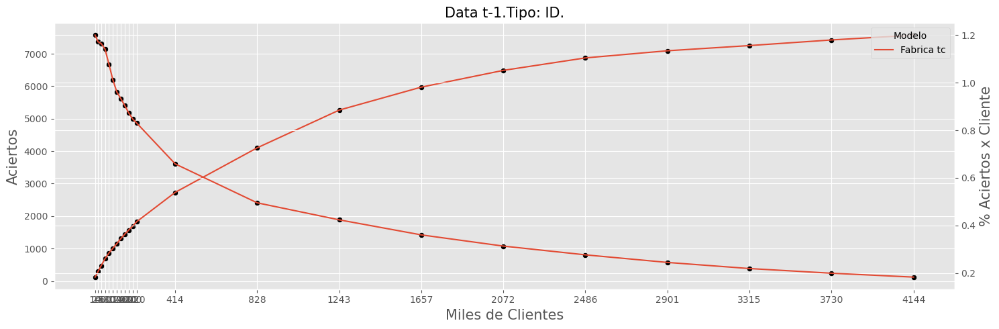

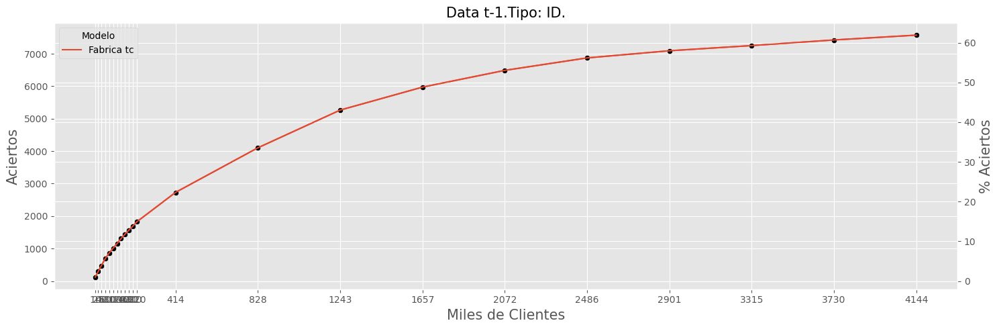

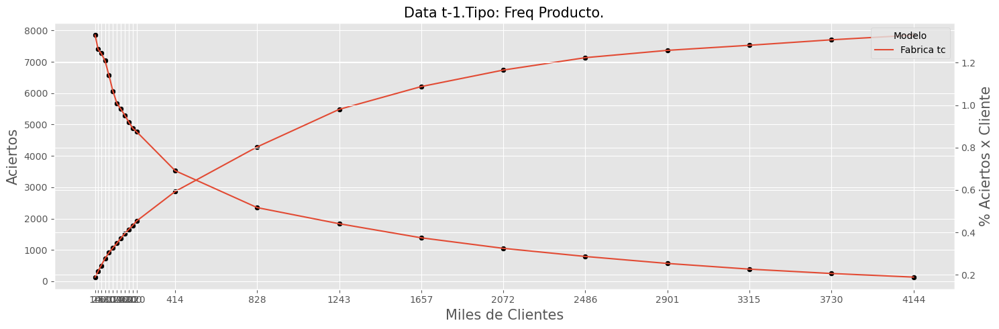

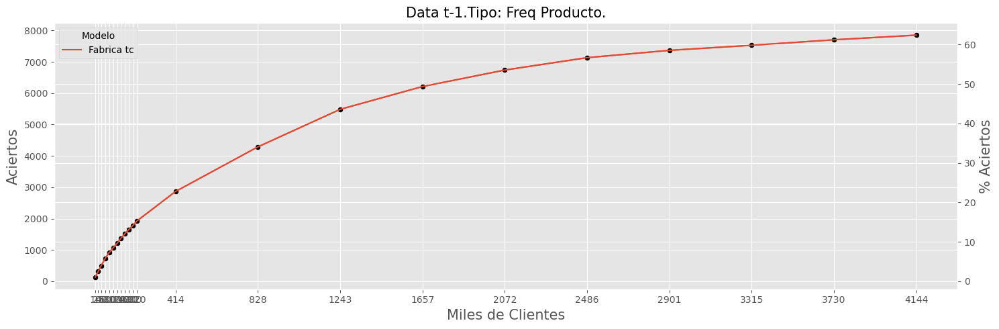

[01/29/25 19:37:44] INFO     ---------------------------------------------------                       ]8;id=439354;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=532419;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#312\312]8;;\

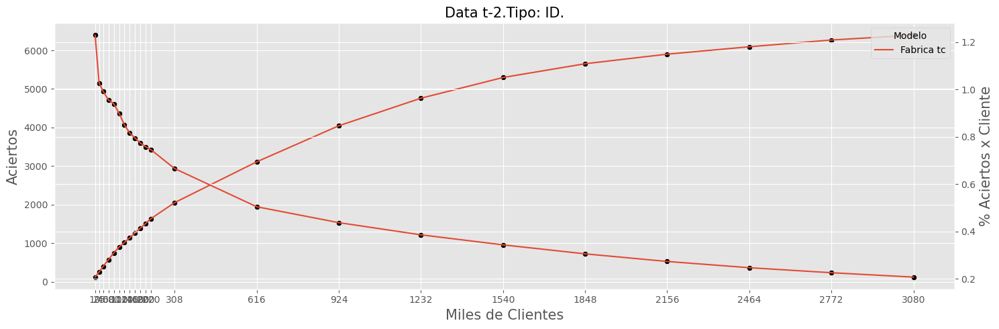

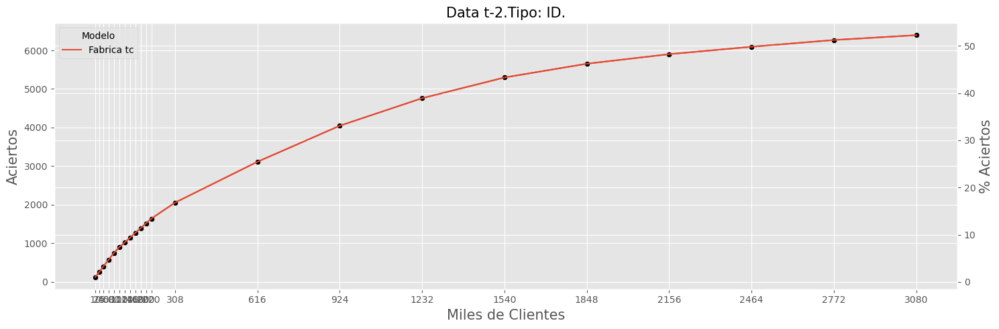

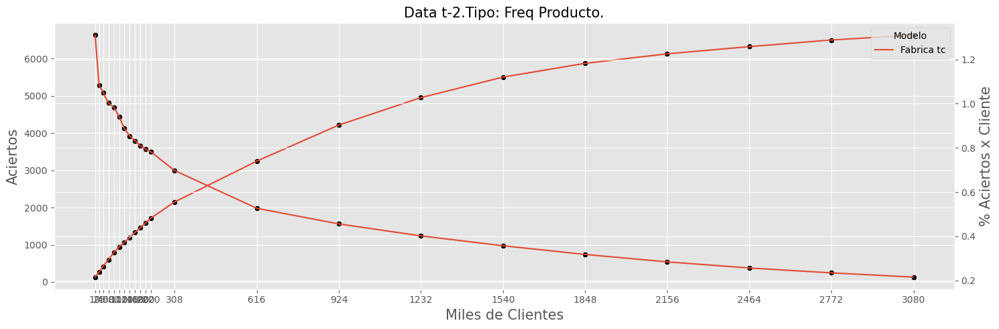

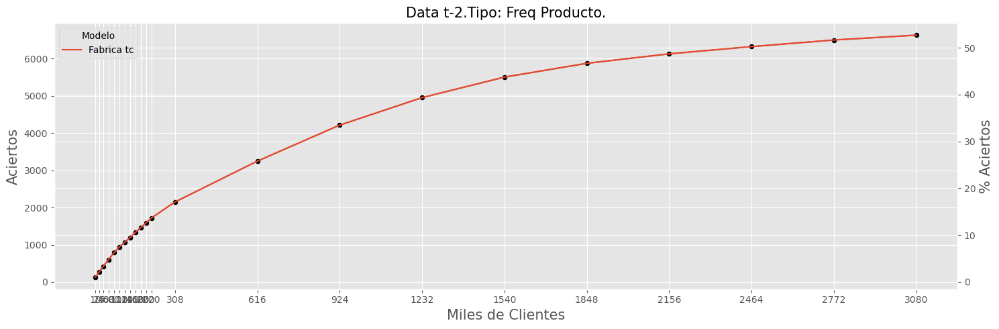

[01/29/25 19:37:46] INFO     ---------------------------------------------------                       ]8;id=662212;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=983506;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#312\312]8;;\

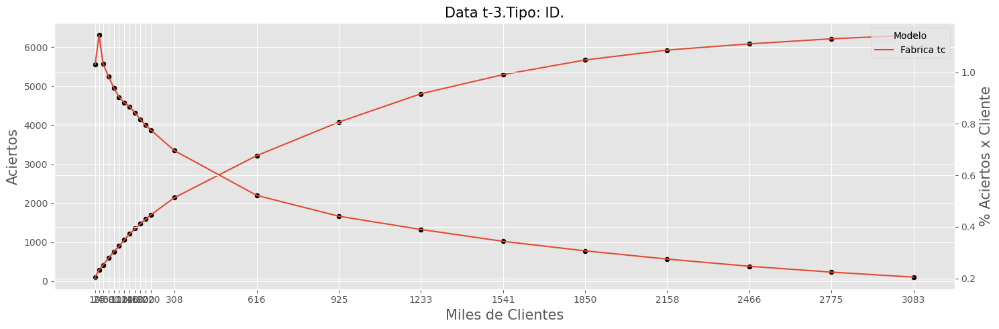

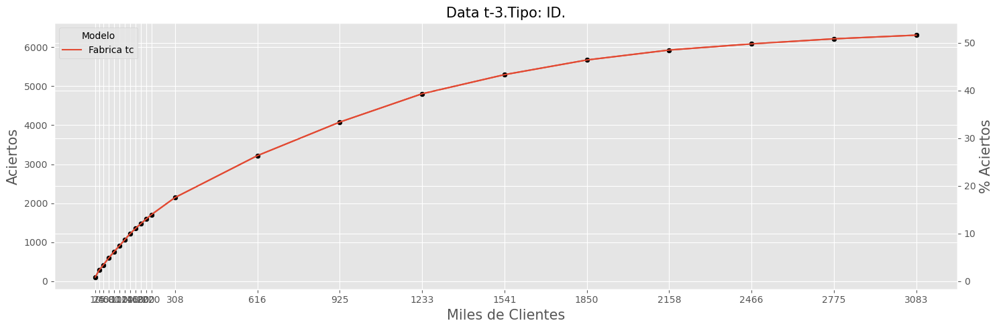

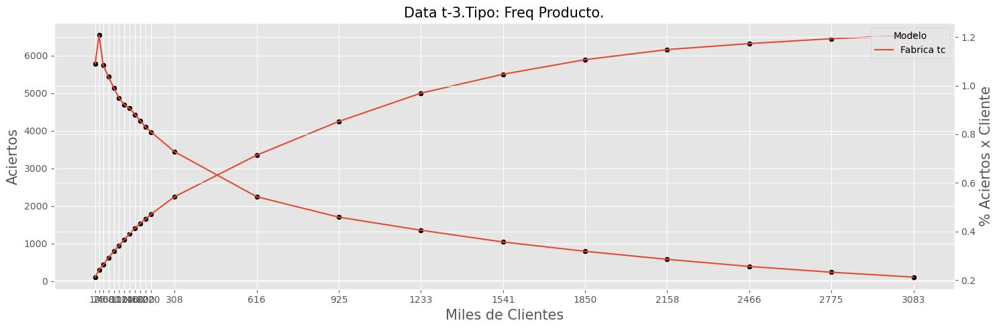

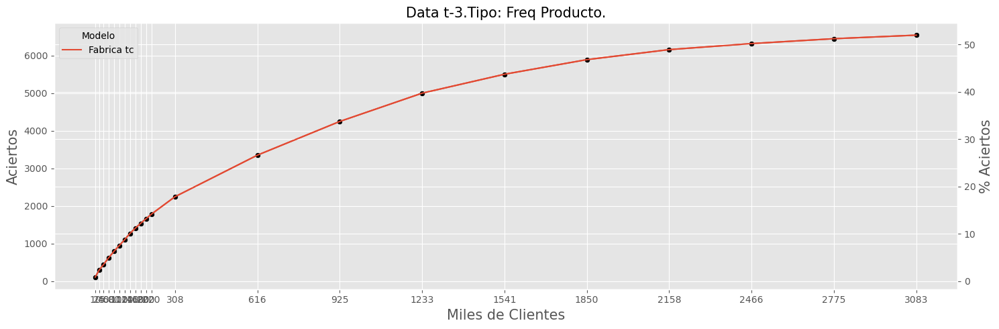

[01/29/25 19:37:47] INFO     ---------------------------------------------------                       ]8;id=733681;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=488899;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#312\312]8;;\

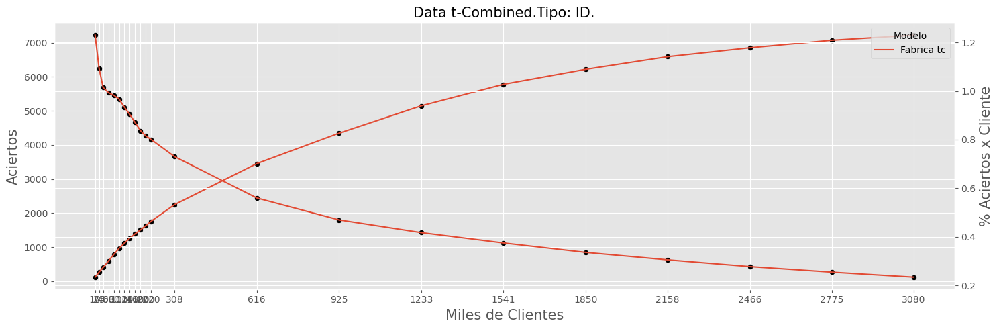

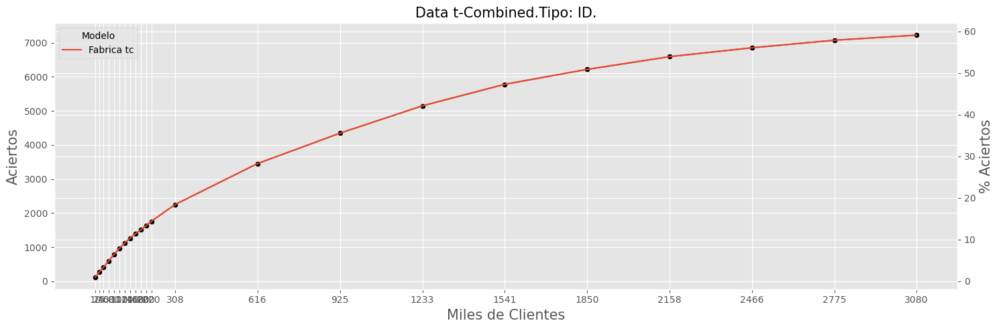

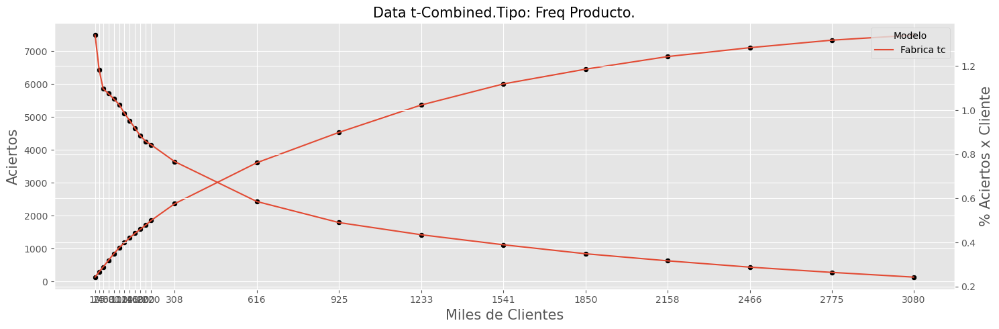

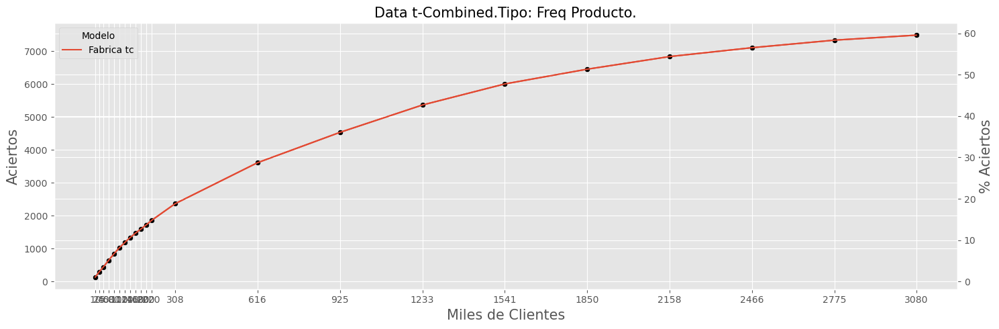

[01/29/25 19:37:49] INFO     ---------------------------------------------------                       ]8;id=394005;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=181788;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#312\312]8;;\

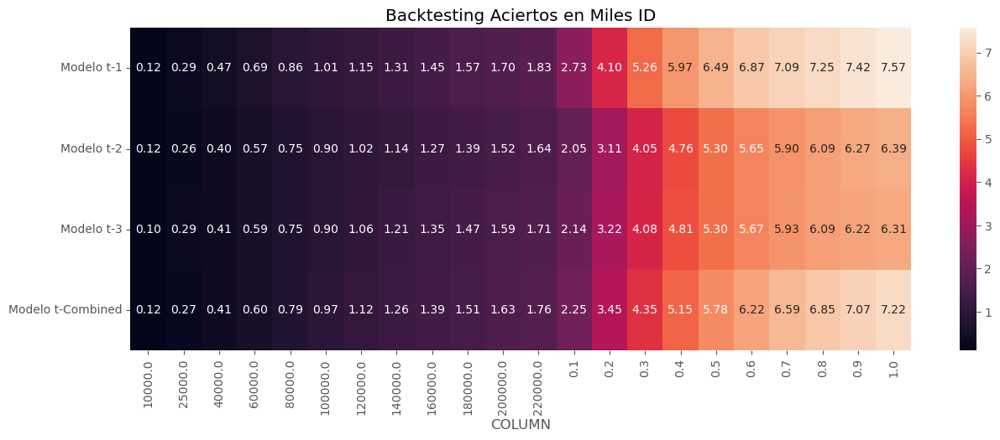

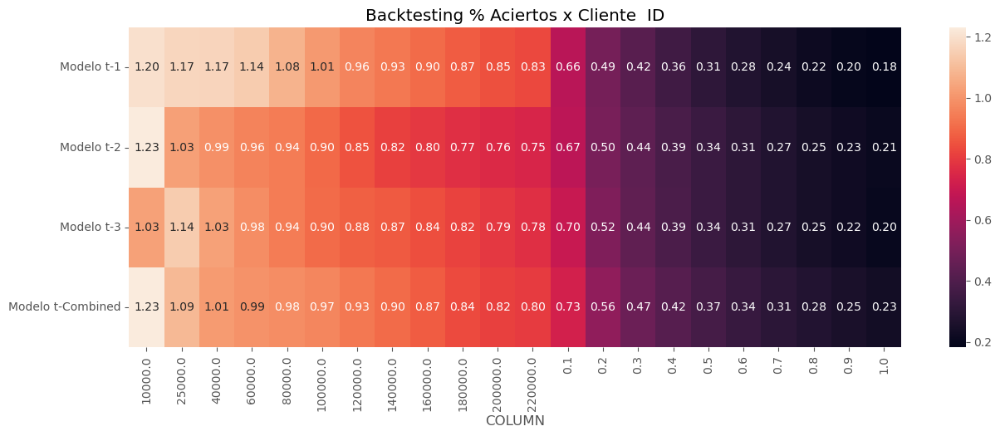

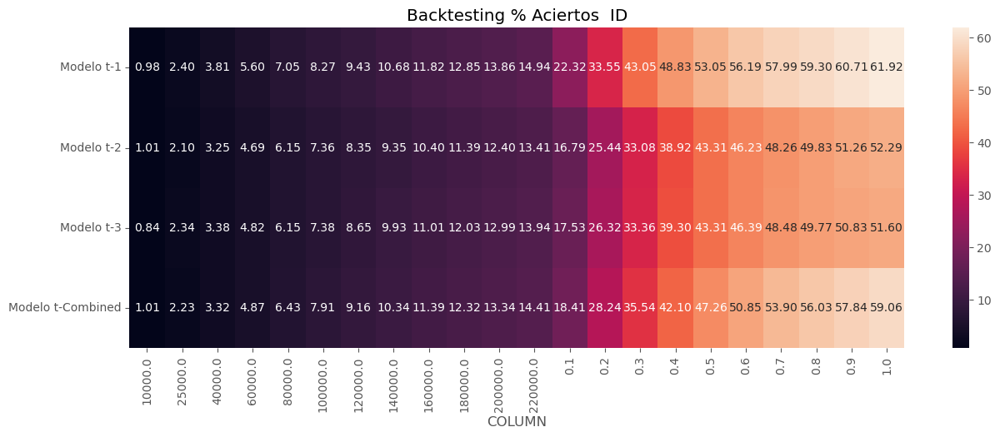

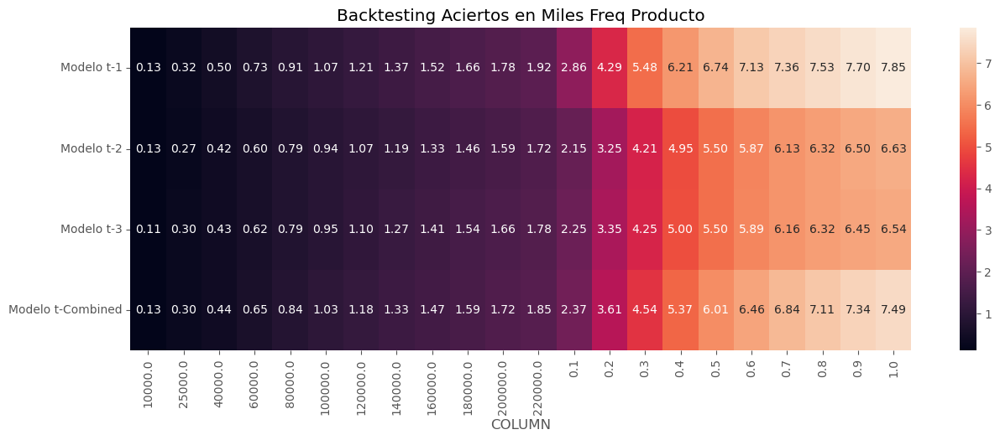

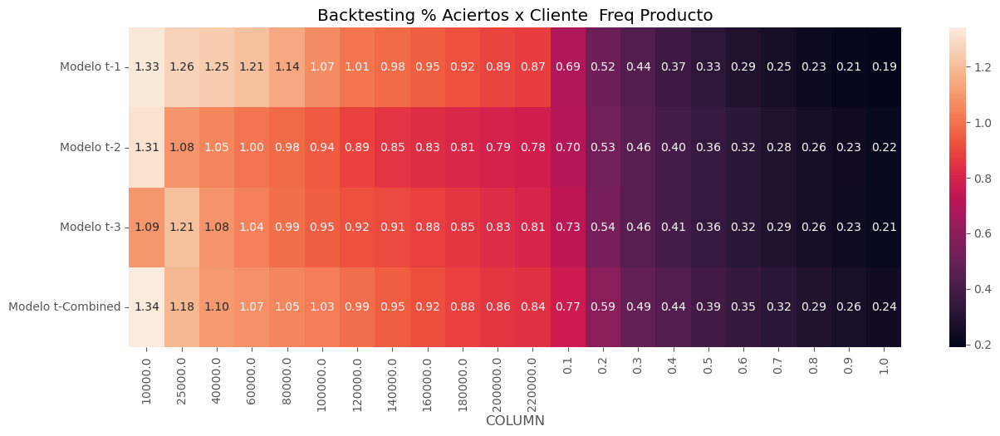

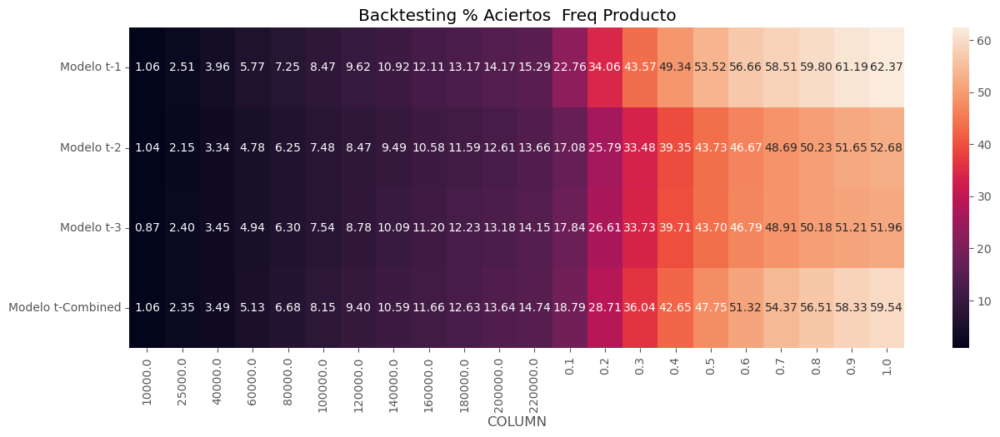

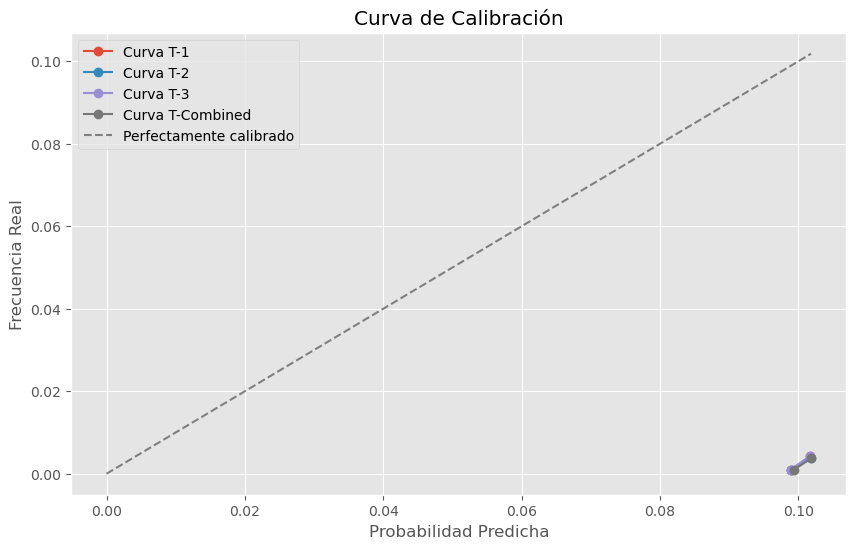

In [17]:
backtesting.plotear_curvas_rezago(save_backtesting, params)
plt.figure(figsize=(10, 6))
max_value = 0
for i in save_backtesting.keys():
    prob_true = save_backtesting[i]['prob_true']
    prob_pred = save_backtesting[i]['prob_pred']
    # Graficar la curva de calibración
    try:
        msg = str(int(i))
    except:
        msg = str(i)
    plt.plot(prob_pred, prob_true, marker='o', label='Curva'+" T-"+msg)
    max_value = np.max([max_value,np.max(prob_pred)])
plt.plot([0, max_value], [0, max_value], linestyle='--', color='gray', label='Perfectamente calibrado')
plt.title('Curva de Calibración')
plt.xlabel('Probabilidad Predicha')
plt.ylabel('Frecuencia Real')
plt.legend()
plt.show()
# curva > 45 grados = subestimar
# curva < 45 grados = sobrestimar

In [18]:
wanted_metric = ['N all','N n_top','true_sum n_top','backtest_metric n_top','Precision n_top','recall n_top','f1-score n_top']
for i in save_backtesting.keys():
    print(i,'Top Metrics')
    res = save_backtesting[i]['metrics']
    display(res[(res["metric_name"].isin(wanted_metric))&(res["class_name"].isin(['1.0','1',1,1.0,'dim shape']))].drop('timestamp', axis=1))
    display(res[res["metric_name"].isin(['True negatives','True positives','False negatives','False positives'])])
    print('------------')

1 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,1243439
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,4144798
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.4249
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.4249
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.8461
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,5283


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-29 17:04,TC,"Ensamble,",202411,True positives,overall metric,overall,7573.0
19,2025-01-29 17:04,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-29 17:04,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-29 17:04,TC,"Ensamble,",202411,False positives,overall metric,overall,4055325.0


------------
2 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,924263
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3080879
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.4438
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.4438
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.8837
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,4102


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-29 17:05,TC,"Ensamble,",202411,True positives,overall metric,overall,6395.0
19,2025-01-29 17:05,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-29 17:05,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-29 17:05,TC,"Ensamble,",202411,False positives,overall metric,overall,2932408.0


------------
3 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,925038
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3083460
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.4487
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.4487
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.8935
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,4151


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-29 17:05,TC,"Ensamble,",202411,True positives,overall metric,overall,6311.0
19,2025-01-29 17:05,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-29 17:05,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-29 17:05,TC,"Ensamble,",202411,False positives,overall metric,overall,2868346.0


------------
Combined Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,924264
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3080880
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.4787
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.4787
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.9527
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,4424


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-29 17:05,TC,"Ensamble,",202411,True positives,overall metric,overall,7223.0
19,2025-01-29 17:05,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-29 17:05,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-29 17:05,TC,"Ensamble,",202411,False positives,overall metric,overall,2976983.0


------------


In [19]:
for i in save_backtesting.keys():
    print(i)
    res = save_backtesting[i]['ks']
    display(res)

1


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,10.20,10.64,414480,2730,0.66,36.05,10.00,26.05
1,9,10.08,10.20,414480,1373,0.33,54.18,20.00,34.18
2,8,10.01,10.08,414480,1162,0.28,69.52,30.00,39.52
3,7,9.95,10.01,414479,707,0.17,78.86,40.00,38.86
4,6,9.91,9.95,404404,515,0.13,85.66,49.76,35.90
5,5,9.88,9.91,424556,385,0.09,90.74,60.00,30.74
6,4,9.86,9.88,414479,220,0.05,93.65,70.00,23.65
7,3,9.85,9.86,414480,160,0.04,95.76,80.00,15.76
8,2,9.84,9.85,414480,173,0.04,98.05,90.00,8.05
9,1,4.99,9.84,414480,148,0.04,100.00,100.00,0.00


2


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,10.24,10.64,308088,2053,0.67,32.10,10.00,22.10
1,9,10.13,10.24,308088,1058,0.34,48.65,20.00,28.65
2,8,10.07,10.13,308088,935,0.30,63.27,30.00,33.27
3,7,10.00,10.07,308088,714,0.23,74.43,40.00,34.43
4,6,9.95,10.00,308087,537,0.17,82.83,50.00,32.83
5,5,9.91,9.95,308088,357,0.12,88.41,60.00,28.41
6,4,9.89,9.91,308088,248,0.08,92.29,70.00,22.29
7,3,9.87,9.89,308088,192,0.06,95.29,80.00,15.29
8,2,9.86,9.87,307384,175,0.06,98.03,89.98,8.05
9,1,5.25,9.86,308792,126,0.04,100.00,100.00,0.00


3


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,10.21,10.64,308346,2144,0.70,33.97,10.0,23.97
1,9,10.10,10.21,308346,1075,0.35,51.01,20.0,31.01
2,8,10.04,10.10,308346,861,0.28,64.65,30.0,34.65
3,7,9.97,10.04,308346,727,0.24,76.17,40.0,36.17
4,6,9.92,9.97,308346,490,0.16,83.93,50.0,33.93
5,5,9.90,9.92,308346,377,0.12,89.91,60.0,29.91
6,4,9.87,9.90,308346,255,0.08,93.95,70.0,23.95
7,3,9.85,9.87,308346,158,0.05,96.45,80.0,16.45
8,2,9.84,9.85,308346,130,0.04,98.51,90.0,8.51
9,1,5.11,9.84,308346,94,0.03,100.00,100.0,0.00


Combined


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,10.33,10.64,308088,2250,0.73,31.15,10.0,21.15
1,9,10.20,10.33,308088,1201,0.39,47.78,20.0,27.78
2,8,10.12,10.20,308088,894,0.29,60.16,30.0,30.16
3,7,10.07,10.12,308083,802,0.26,71.26,40.0,31.26
4,6,10.02,10.07,308093,629,0.20,79.97,50.0,29.97
5,5,9.98,10.02,308088,442,0.14,86.09,60.0,26.09
6,4,9.94,9.98,308088,373,0.12,91.25,70.0,21.25
7,3,9.91,9.94,308088,261,0.08,94.86,80.0,14.86
8,2,9.90,9.91,308088,221,0.07,97.92,90.0,7.92
9,1,9.88,9.90,308088,150,0.05,100.00,100.0,0.00


## Comparar backtesting

In [8]:
data_backtesting1 = catalog.load("data_backtesting_202412_anterior")
data_backtesting111 = catalog.load("data_backtesting_202412_mvp7_exp4") # modelo 419 del experimento 2

[01/29/25 18:51:57] INFO     Loading data from 'data_backtesting_202412_anterior'               ]8;id=522333;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=690310;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

[01/29/25 18:54:39] INFO     Loading data from 'data_backtesting_202412_mvp7_exp4'              ]8;id=810463;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=358386;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

In [9]:
nametag_model = ['202412_MVP4-DF MVP7','202412_MVP7-EDA MVP4 prueba 4 exp2']
backtesting_all = [data_backtesting1,data_backtesting111]
# nametag_model = ['202410','202411']
# backtesting_all = [data_backtesting1,data_backtesting2]

dict_keys(['ID', 'Freq Producto'])


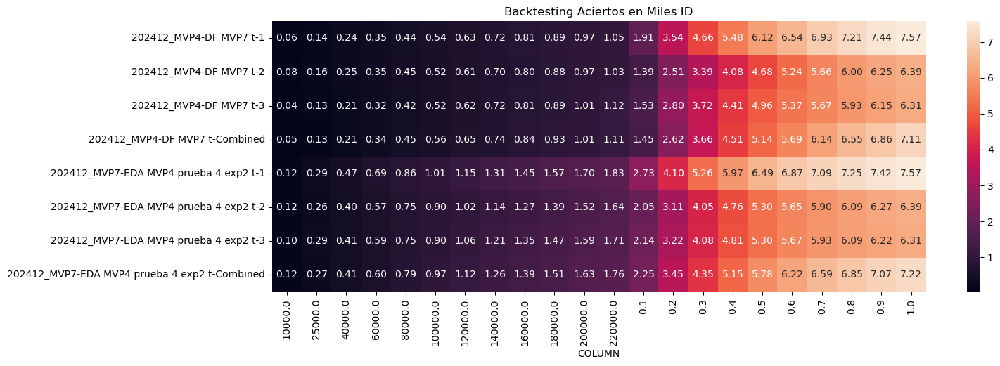

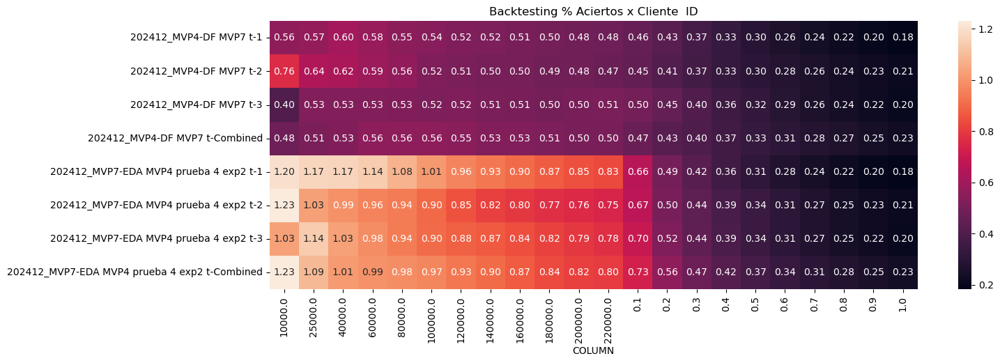

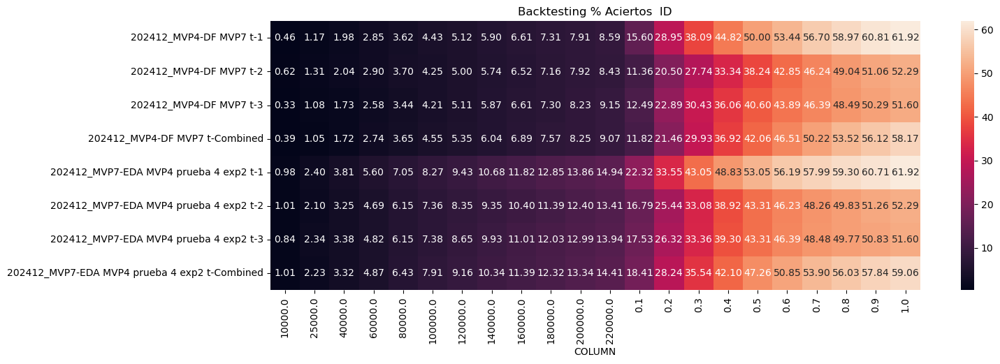

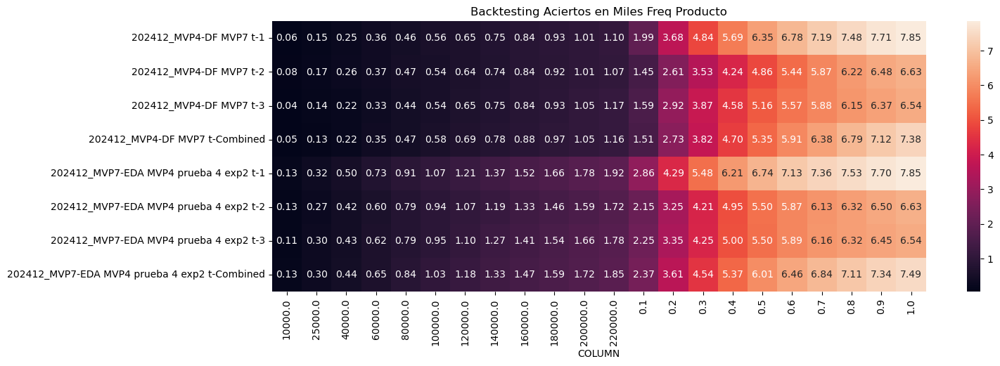

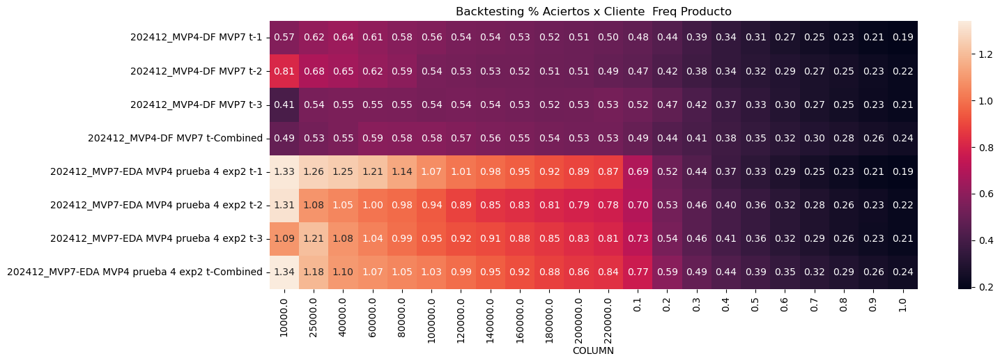

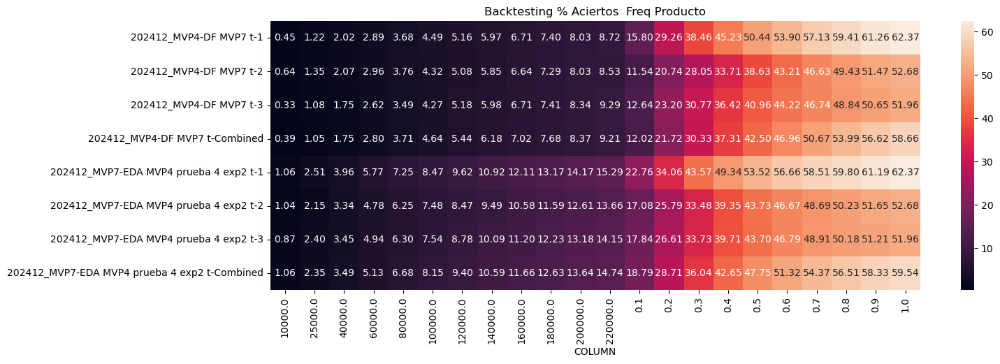

In [10]:
consolidacion_tipo = {}
for t,save_backtesting in enumerate(backtesting_all):
    for i in save_backtesting.keys():
        name = nametag_model[t]+' t-'+str(i)
        df_i = save_backtesting[i]['contactabilidad_curva']#.keys()
        df_i = df_i[~df_i['Aciertos'].isnull()]
        df_i = df_i.replace('Fabrica '+params['target'].split('_')[0],name)
        df_i = df_i[df_i['Modelo'] == name]
        for tipo in df_i['Tipo'].unique():
            df_ii = df_i[df_i['Tipo'] == tipo]
            df_ii = df_ii.set_index('COLUMN')
            if tipo not in consolidacion_tipo:
                consolidacion_tipo[tipo] = {'Aciertos': pd.DataFrame(),'% Aciertos x Cliente':pd.DataFrame(),'% Aciertos': pd.DataFrame()}
            for col in ['Aciertos','% Aciertos x Cliente','% Aciertos']:
                consolidacion_tipo[tipo][col] = pd.concat([consolidacion_tipo[tipo][col],df_ii[[col]].rename(columns = {col:name})], axis = 1)
print(consolidacion_tipo.keys())
import seaborn as sns
for col in list(consolidacion_tipo.keys()):
    for tipo in ['Aciertos','% Aciertos x Cliente','% Aciertos']:
        if tipo == 'Aciertos':
            graph = consolidacion_tipo[col][tipo].T/1000
            msj = f'Backtesting {tipo} en Miles {col}'
        else:
            graph = consolidacion_tipo[col][tipo].T
            msj = f'Backtesting {tipo}  {col}'
        plt.figure(figsize=(15,5))
        sns.heatmap(graph, annot = True, fmt= '0.02f')
        plt.title(msj)
        plt.show()

In [9]:
data_backtesting1 = catalog.load("data_backtesting_202411_anterior")
data_backtesting11 = catalog.load("data_backtesting_202411_mvp7")# modelo 176 del experimento 1
#data_backtesting111 = catalog.load("data_backtesting_202410_mvp7_v2") # modelo 95 es peorsito al 176 en el experimento 1
data_backtesting111 = catalog.load("data_backtesting_202411_mvp7_exp2") # modelo 419 del experimento 2
data_backtesting1111 = catalog.load("data_backtesting_202411_mvp7_exp3") # modelo 344 del experimento 1 con eda MV4
data_backtesting11111 = catalog.load("data_backtesting_202411_mvp7_exp4") # modelo del experimento 2 con eda MV4

[01/29/25 16:23:25] INFO     Loading data from 'data_backtesting_202411_anterior'               ]8;id=423460;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=116411;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

[01/29/25 16:25:53] INFO     Loading data from 'data_backtesting_202411_mvp7'                   ]8;id=665961;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=785328;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

[01/29/25 16:28:15] INFO     Loading data from 'data_backtesting_202411_mvp7_exp2'              ]8;id=285288;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=889919;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

[01/29/25 16:30:31] INFO     Loading data from 'data_backtesting_202411_mvp7_exp3'              ]8;id=694372;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=613072;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

[01/29/25 16:32:44] INFO     Loading data from 'data_backtesting_202411_mvp7_exp4'              ]8;id=269604;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=858583;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/core.py:1 │
│ 93 in load                                                                                       │
│                                                                                                  │
│   190 │   │   self._logger.debug("Loading %s", str(self))                                        │
│   191 │   │                                                                                      │
│   192 │   │   try:                                                                               │
│ ❱ 193 │   │   │   return self._load()                                                            │
│   194 │   │   except DatasetError:                                                               │
│   195 │   │   │   raise                                                                          │
│   196 │   │   except Exception as exc:                                                           │
│                                                                                                  │
│ /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/extras/datas │
│ ets/pickle/pickle_dataset.py:212 in _load                                                        │
│                                                                                                  │
│   209 │   def _load(self) -> Any:                                                                │
│   210 │   │   load_path = get_filepath_str(self._get_load_path(), self._protocol)                │
│   211 │   │                                                                                      │
│ ❱ 212 │   │   with self._fs.open(load_path, **self._fs_open_args_load) as fs_file:               │
│   213 │   │   │   imported_backend = importlib.import_module(self._backend)                      │
│   214 │   │   │   return imported_backend.load(fs_file, **self._load_args)  # type: ignore       │
│   215                                                                                            │
│                                                                                                  │
│ /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/fsspec/spec.py:130 │
│ 3 in open                                                                                        │
│                                                                                                  │
│   1300 │   │   │   )                                                                             │
│   1301 │   │   else:                                                                             │
│   1302 │   │   │   ac = kwargs.pop("autocommit", not self._intrans)                              │
│ ❱ 1303 │   │   │   f = self._open(                                                               │
│   1304 │   │   │   │   path,                                                                     │
│   1305 │   │   │   │   mode=mode,                                                                │
│   1306 │   │   │   │   block_size=block_size,                                                    │
│                                                                                                  │
│ /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/s3fs/core.py:688   │
│ in _open                                                                                         │
│                                                                                                  │
│    685 │   │   if cache_type is None:                                                            │
│    686 │   │   │   cache_type = self.default_cache_type                                          │
│    687 │   │                                               

In [11]:
nametag_model = ['202411_MVP4','202411_MVP7','202411_MVP7 exp2','202411_MVP7-EDA MVP4 exp1','202411_MVP7-EDA MVP4 prueba 4 exp2']
backtesting_all = [data_backtesting1,data_backtesting11,data_backtesting111,data_backtesting1111,data_backtesting11111]
# nametag_model = ['202410','202411']
# backtesting_all = [data_backtesting1,data_backtesting2]

dict_keys(['ID', 'Freq Producto'])


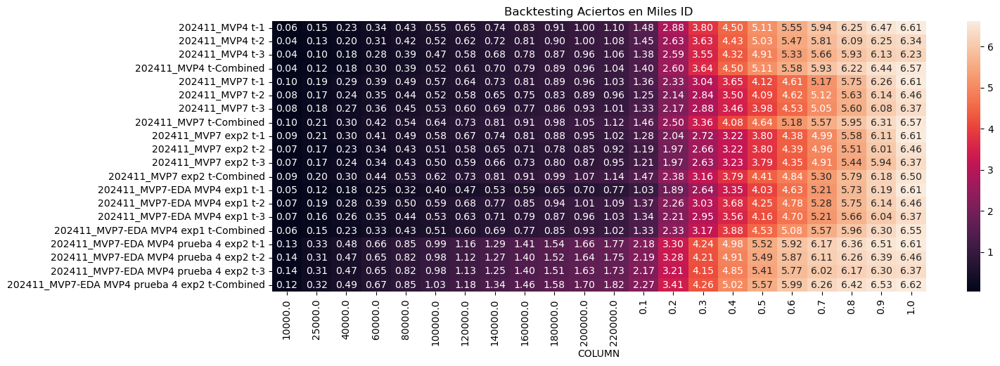

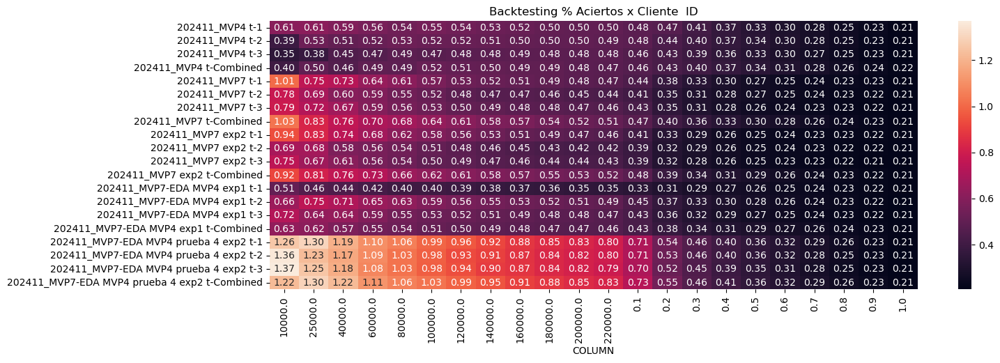

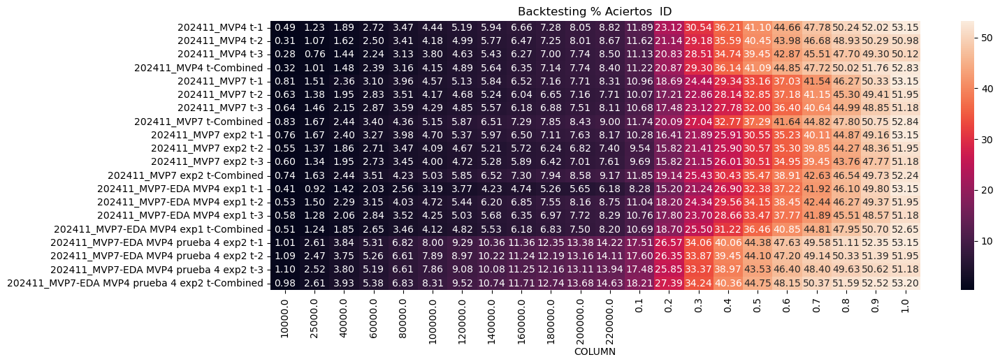

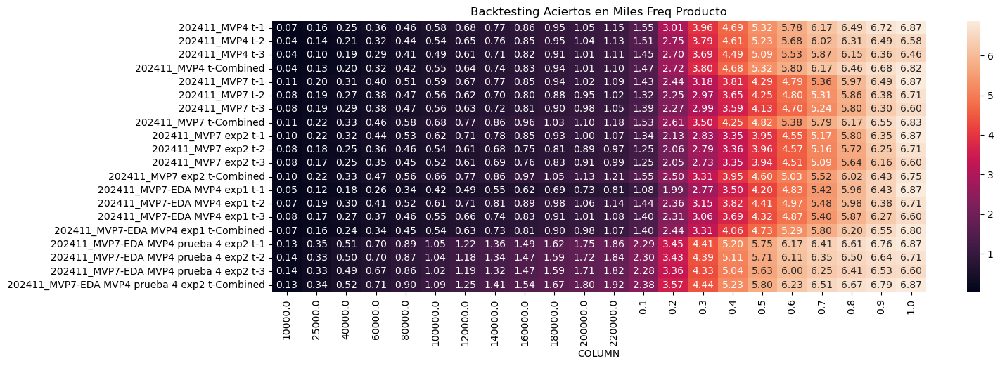

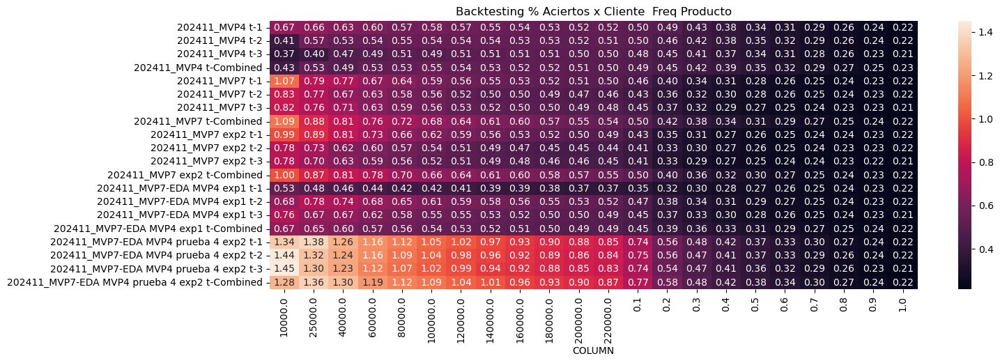

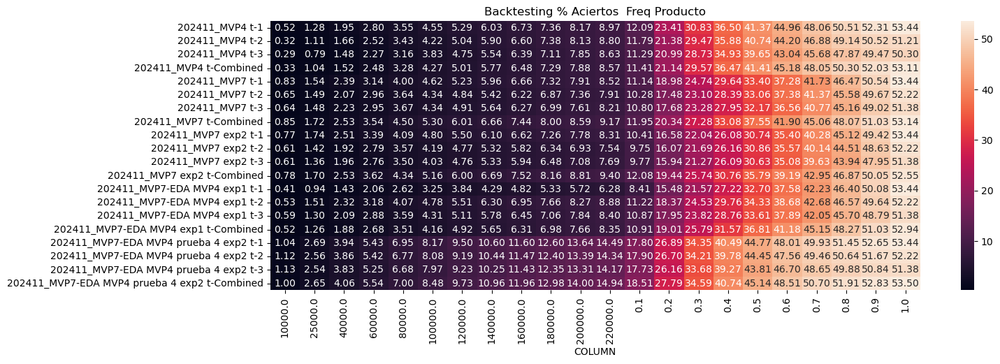

In [12]:
consolidacion_tipo = {}
for t,save_backtesting in enumerate(backtesting_all):
    for i in save_backtesting.keys():
        name = nametag_model[t]+' t-'+str(i)
        df_i = save_backtesting[i]['contactabilidad_curva']#.keys()
        df_i = df_i[~df_i['Aciertos'].isnull()]
        df_i = df_i.replace('Fabrica '+params['target'].split('_')[0],name)
        df_i = df_i[df_i['Modelo'] == name]
        for tipo in df_i['Tipo'].unique():
            df_ii = df_i[df_i['Tipo'] == tipo]
            df_ii = df_ii.set_index('COLUMN')
            if tipo not in consolidacion_tipo:
                consolidacion_tipo[tipo] = {'Aciertos': pd.DataFrame(),'% Aciertos x Cliente':pd.DataFrame(),'% Aciertos': pd.DataFrame()}
            for col in ['Aciertos','% Aciertos x Cliente','% Aciertos']:
                consolidacion_tipo[tipo][col] = pd.concat([consolidacion_tipo[tipo][col],df_ii[[col]].rename(columns = {col:name})], axis = 1)
print(consolidacion_tipo.keys())
import seaborn as sns
for col in list(consolidacion_tipo.keys()):
    for tipo in ['Aciertos','% Aciertos x Cliente','% Aciertos']:
        if tipo == 'Aciertos':
            graph = consolidacion_tipo[col][tipo].T/1000
            msj = f'Backtesting {tipo} en Miles {col}'
        else:
            graph = consolidacion_tipo[col][tipo].T
            msj = f'Backtesting {tipo}  {col}'
        plt.figure(figsize=(15,5))
        sns.heatmap(graph, annot = True, fmt= '0.02f')
        plt.title(msj)
        plt.show()

In [ ]:
data_backtesting1 = catalog.load("data_backtesting_202410_anterior")
data_backtesting11 = catalog.load("data_backtesting_202410_mvp7")# modelo 176 del experimento 1
#data_backtesting111 = catalog.load("data_backtesting_202410_mvp7_v2") # modelo 95 es peorsito al 176 en el experimento 1
data_backtesting111 = catalog.load("data_backtesting_202410_mvp7_exp2") # modelo 419 del experimento 2

[01/29/25 18:57:23] INFO     Loading data from 'data_backtesting_202410_anterior'               ]8;id=949933;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=846675;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

[01/29/25 19:00:25] INFO     Loading data from 'data_backtesting_202410_mvp7'                   ]8;id=853599;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=869145;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

[01/29/25 19:02:56] INFO     Loading data from 'data_backtesting_202410_mvp7_exp2'              ]8;id=419417;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=838517;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

In [24]:
nametag_model = ['202410_MVP4','202410_MVP7','202410_MVP7 exp2']
backtesting_all = [data_backtesting1,data_backtesting11,data_backtesting111]
# nametag_model = ['202410','202411']
# backtesting_all = [data_backtesting1,data_backtesting2]

dict_keys(['ID', 'Freq Producto'])


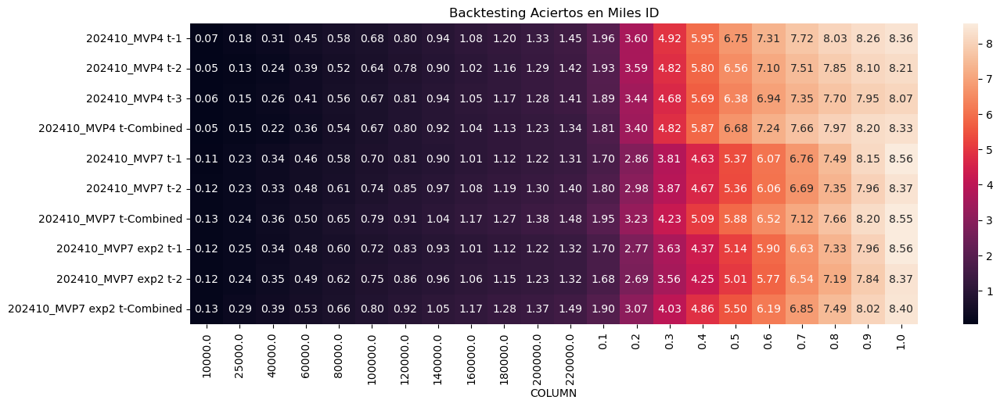

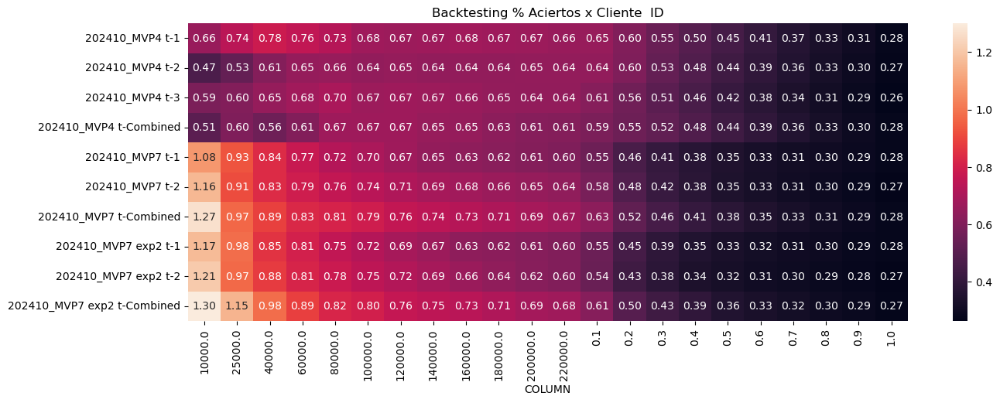

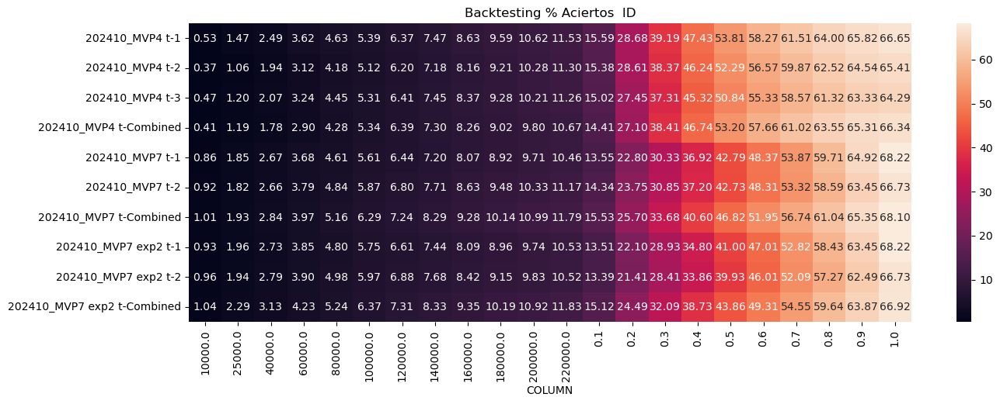

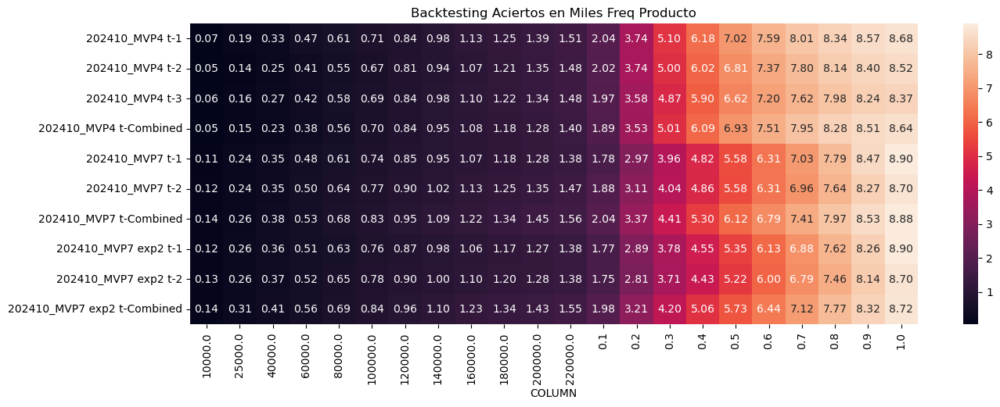

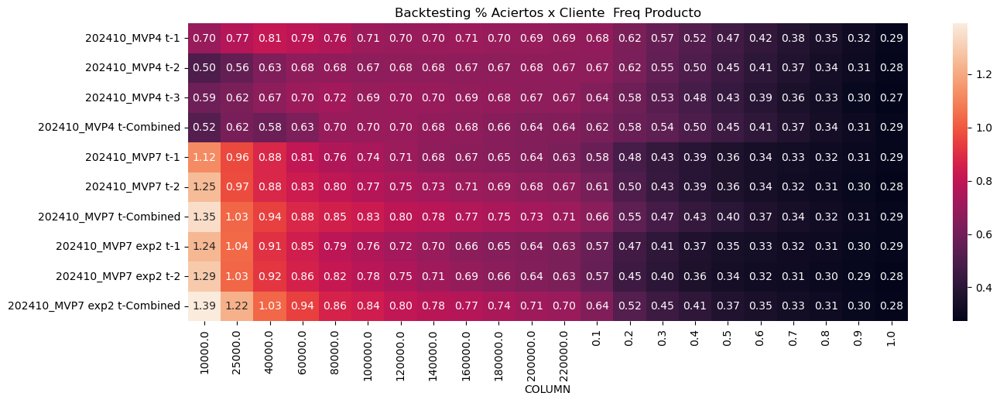

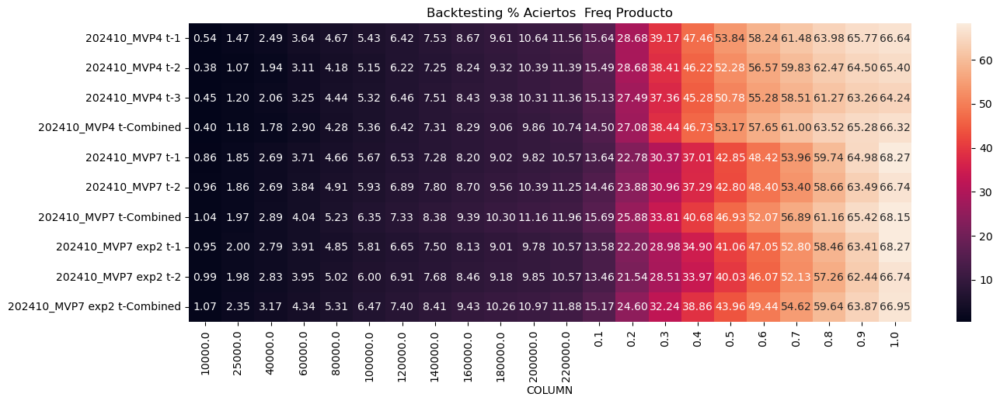

In [ ]:
consolidacion_tipo = {}
for t,save_backtesting in enumerate(backtesting_all):
    for i in save_backtesting.keys():
        name = nametag_model[t]+' t-'+str(i)
        df_i = save_backtesting[i]['contactabilidad_curva']#.keys()
        df_i = df_i[~df_i['Aciertos'].isnull()]
        df_i = df_i.replace('Fabrica '+params['target'].split('_')[0],name)
        df_i = df_i[df_i['Modelo'] == name]
        for tipo in df_i['Tipo'].unique():
            df_ii = df_i[df_i['Tipo'] == tipo]
            df_ii = df_ii.set_index('COLUMN')
            if tipo not in consolidacion_tipo:
                consolidacion_tipo[tipo] = {'Aciertos': pd.DataFrame(),'% Aciertos x Cliente':pd.DataFrame(),'% Aciertos': pd.DataFrame()}
            for col in ['Aciertos','% Aciertos x Cliente','% Aciertos']:
                consolidacion_tipo[tipo][col] = pd.concat([consolidacion_tipo[tipo][col],df_ii[[col]].rename(columns = {col:name})], axis = 1)
print(consolidacion_tipo.keys())
import seaborn as sns
for col in list(consolidacion_tipo.keys()):
    for tipo in ['Aciertos','% Aciertos x Cliente','% Aciertos']:
        if tipo == 'Aciertos':
            graph = consolidacion_tipo[col][tipo].T/1000
            msj = f'Backtesting {tipo} en Miles {col}'
        else:
            graph = consolidacion_tipo[col][tipo].T
            msj = f'Backtesting {tipo}  {col}'
        plt.figure(figsize=(15,5))
        sns.heatmap(graph, annot = True, fmt= '0.02f')
        plt.title(msj)
        plt.show()

In [ ]:
for t,save_backtesting in enumerate(backtesting_all):
    for i in save_backtesting.keys():
        name = nametag_model[t]+' t-'+str(i)
        print(name)
        res = save_backtesting[i]['ks']
        display(res)

202410_MVP4 t-1


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.53,82.99,300137,1957,0.65,23.40,10.0,13.40
1,9,0.82,1.53,300136,1642,0.55,43.03,20.0,23.03
2,8,0.58,0.82,300136,1319,0.44,58.80,30.0,28.80
3,7,0.44,0.58,300137,1035,0.34,71.17,40.0,31.17
4,6,0.36,0.44,300136,800,0.27,80.74,50.0,30.74
5,5,0.30,0.36,300136,560,0.19,87.43,60.0,27.43
6,4,0.25,0.30,300129,406,0.14,92.29,70.0,22.29
7,3,0.19,0.25,300144,313,0.10,96.03,80.0,16.03
8,2,0.13,0.19,300136,228,0.08,98.76,90.0,8.76
9,1,0.00,0.13,300137,104,0.03,100.00,100.0,0.00


202410_MVP4 t-2


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.53,83.00,301027,1930,0.64,23.51,10.0,13.51
1,9,0.82,1.53,301026,1661,0.55,43.74,20.0,23.74
2,8,0.58,0.82,301026,1224,0.41,58.66,30.0,28.66
3,7,0.45,0.58,301026,988,0.33,70.69,40.0,30.69
4,6,0.36,0.45,301026,760,0.25,79.95,50.0,29.95
5,5,0.30,0.36,301026,536,0.18,86.48,60.0,26.48
6,4,0.25,0.30,301026,415,0.14,91.53,70.0,21.53
7,3,0.20,0.25,301026,332,0.11,95.58,80.0,15.58
8,2,0.14,0.20,301026,254,0.08,98.67,90.0,8.67
9,1,0.00,0.14,301027,109,0.04,100.00,100.0,0.00


202410_MVP4 t-3


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.55,82.99,306616,1885,0.61,23.36,10.0,13.36
1,9,0.83,1.55,306616,1560,0.51,42.69,20.0,22.69
2,8,0.59,0.83,306616,1237,0.40,58.02,30.0,28.02
3,7,0.45,0.59,306615,1006,0.33,70.49,40.0,30.49
4,6,0.36,0.45,306616,693,0.23,79.08,50.0,29.08
5,5,0.30,0.36,306616,563,0.18,86.06,60.0,26.06
6,4,0.25,0.30,306615,407,0.13,91.10,70.0,21.10
7,3,0.20,0.25,306616,345,0.11,95.38,80.0,15.38
8,2,0.14,0.20,306616,252,0.08,98.50,90.0,8.50
9,1,0.00,0.14,306616,121,0.04,100.00,100.0,0.00


202410_MVP4 t-Combined


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,2.90,83.00,300116,1770,0.59,21.26,10.0,11.26
1,9,1.17,2.90,300115,1558,0.52,39.97,20.0,19.97
2,8,0.77,1.17,300116,1430,0.48,57.15,30.0,27.15
3,7,0.58,0.77,300115,1032,0.34,69.54,40.0,29.54
4,6,0.47,0.58,300115,824,0.27,79.44,50.0,29.44
5,5,0.39,0.47,300116,562,0.19,86.19,60.0,26.19
6,4,0.32,0.39,300066,435,0.14,91.41,70.0,21.41
7,3,0.27,0.32,300165,326,0.11,95.33,80.0,15.33
8,2,0.22,0.27,300115,212,0.07,97.87,90.0,7.87
9,1,0.15,0.22,300116,177,0.06,100.00,100.0,0.00


202410_MVP7 t-1


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,12.41,12.41,308263,1701,0.55,19.87,10.00,9.87
1,9,12.41,12.41,308177,1159,0.38,33.41,19.99,13.42
2,8,12.41,12.41,308467,946,0.31,44.46,30.00,14.46
3,7,12.41,12.41,308343,827,0.27,54.12,40.00,14.12
4,6,12.41,12.41,308295,737,0.24,62.73,49.99,12.73
5,5,12.41,12.41,308519,700,0.23,70.90,60.00,10.90
6,4,12.41,12.41,308330,691,0.22,78.97,70.00,8.98
7,3,12.41,12.41,308256,733,0.24,87.54,80.00,7.54
8,2,12.41,12.41,308462,654,0.21,95.18,90.00,5.18
9,1,11.24,12.41,308348,413,0.13,100.00,100.00,0.00


202410_MVP7 t-2


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,12.41,12.41,309210,1800,0.58,21.50,10.00,11.50
1,9,12.41,12.41,309067,1180,0.38,35.59,19.99,15.59
2,8,12.41,12.41,309120,891,0.29,46.23,29.99,16.24
3,7,12.41,12.41,309243,796,0.26,55.73,39.99,15.74
4,6,12.41,12.41,309406,695,0.22,64.03,50.00,14.03
5,5,12.41,12.41,309329,701,0.23,72.40,60.00,12.40
6,4,12.41,12.41,309172,629,0.20,79.91,70.00,9.92
7,3,12.41,12.41,309268,661,0.21,87.81,80.00,7.81
8,2,12.41,12.41,309235,610,0.20,95.09,90.00,5.09
9,1,11.83,12.41,309245,411,0.13,100.00,100.00,0.00


202410_MVP7 t-Combined


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,12.41,12.41,308164,1944,0.63,22.75,9.99,12.75
1,9,12.41,12.41,308523,1277,0.41,37.69,20.00,17.69
2,8,12.41,12.41,308001,996,0.32,49.34,29.99,19.36
3,7,12.41,12.41,308539,868,0.28,59.50,39.99,19.51
4,6,12.41,12.41,308131,779,0.25,68.62,49.99,18.63
5,5,12.41,12.41,308562,642,0.21,76.13,59.99,16.13
6,4,12.41,12.41,308410,603,0.20,83.19,70.00,13.19
7,3,12.41,12.41,308333,539,0.17,89.49,80.00,9.50
8,2,12.41,12.41,308418,546,0.18,95.88,90.00,5.88
9,1,12.41,12.41,308380,352,0.11,100.00,100.00,0.00


202410_MVP7 exp2 t-1


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,12.30,12.30,308346,1696,0.55,19.81,10.0,9.81
1,9,12.30,12.30,308346,1078,0.35,32.40,20.0,12.40
2,8,12.30,12.30,308346,857,0.28,42.41,30.0,12.41
3,7,12.30,12.30,308346,737,0.24,51.02,40.0,11.02
4,6,12.30,12.30,308346,777,0.25,60.10,50.0,10.10
5,5,12.30,12.30,308346,755,0.24,68.92,60.0,8.92
6,4,12.30,12.30,308346,729,0.24,77.43,70.0,7.43
7,3,12.30,12.30,308346,704,0.23,85.66,80.0,5.66
8,2,12.29,12.30,308346,630,0.20,93.01,90.0,3.01
9,1,3.78,12.29,308346,598,0.19,100.00,100.0,0.00


202410_MVP7 exp2 t-2


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,12.30,12.30,309230,1681,0.54,20.07,10.0,10.07
1,9,12.30,12.30,309229,1006,0.33,32.09,20.0,12.09
2,8,12.30,12.30,309230,878,0.28,42.57,30.0,12.57
3,7,12.30,12.30,309228,685,0.22,50.75,40.0,10.75
4,6,12.30,12.30,309230,761,0.25,59.84,50.0,9.84
5,5,12.30,12.30,309230,763,0.25,68.95,60.0,8.95
6,4,12.30,12.30,309229,763,0.25,78.06,70.0,8.06
7,3,12.30,12.30,309230,650,0.21,85.83,80.0,5.83
8,2,12.29,12.30,309229,655,0.21,93.65,90.0,3.65
9,1,3.67,12.29,309230,532,0.17,100.00,100.0,0.00


202410_MVP7 exp2 t-Combined


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,12.30,12.3,308346,1894,0.61,22.55,10.00,12.55
1,9,12.30,12.3,308346,1171,0.38,36.49,20.00,16.49
2,8,12.30,12.3,308346,955,0.31,47.86,30.00,17.86
3,7,12.30,12.3,307597,832,0.27,57.77,39.98,17.79
4,6,12.30,12.3,309095,652,0.21,65.53,50.00,15.53
5,5,12.30,12.3,308346,672,0.22,73.53,60.00,13.53
6,4,12.30,12.3,308346,649,0.21,81.26,70.00,11.26
7,3,12.30,12.3,308346,646,0.21,88.95,80.00,8.95
8,2,12.30,12.3,300659,538,0.18,95.36,89.75,5.61
9,1,12.27,12.3,316034,390,0.12,100.00,100.00,0.00


In [ ]:
wanted_metric = ['N all','N n_top','true_sum n_top','backtest_metric n_top','Precision n_top','recall n_top','f1-score n_top']
for t,save_backtesting in enumerate(backtesting_all):
    for i in save_backtesting.keys():
        name = nametag_model[t]+' t-'+str(i)
        print(name,'Top Metrics')
        res = save_backtesting[i]['metrics']
        display(res[(res["metric_name"].isin(wanted_metric))&(res["class_name"].isin(['1.0','1',1,1.0,'dim shape']))].drop('timestamp', axis=1))
        display(res[res["metric_name"].isin(['True negatives','True positives','False negatives','False positives'])])
        print('------------')

202410_MVP4 t-1 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,900409
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3001364
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.5529
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.5529
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,1.0996
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,4978


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
20,2025-01-17 23:24,TC,"Ensamble,",202410,True positives,overall metric,overall,8364.0
21,2025-01-17 23:24,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
22,2025-01-17 23:24,TC,"Ensamble,",202410,True negatives,overall metric,overall,208.0
23,2025-01-17 23:24,TC,"Ensamble,",202410,False positives,overall metric,overall,2920514.0


------------
202410_MVP4 t-2 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,903078
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3010262
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.545
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.545
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,1.0841
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,4922


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
20,2025-01-17 23:24,TC,"Ensamble,",202410,True positives,overall metric,overall,8209.0
21,2025-01-17 23:24,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
22,2025-01-17 23:24,TC,"Ensamble,",202410,True negatives,overall metric,overall,200.0
23,2025-01-17 23:24,TC,"Ensamble,",202410,False positives,overall metric,overall,2844316.0


------------
202410_MVP4 t-3 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,919847
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3066158
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.5357
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.5357
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,1.0658
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,4928


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
20,2025-01-17 23:24,TC,"Ensamble,",202410,True positives,overall metric,overall,8069.0
21,2025-01-17 23:24,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
22,2025-01-17 23:24,TC,"Ensamble,",202410,True negatives,overall metric,overall,208.0
23,2025-01-17 23:24,TC,"Ensamble,",202410,False positives,overall metric,overall,2763103.0


------------
202410_MVP4 t-Combined Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,900346
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3001155
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.551
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.551
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,1.096
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,4961


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-17 23:25,TC,"Ensamble,",202410,True positives,overall metric,overall,8326.0
19,2025-01-17 23:25,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
20,2025-01-17 23:25,TC,"Ensamble,",202410,True negatives,overall metric,overall,0.0
21,2025-01-17 23:25,TC,"Ensamble,",202410,False positives,overall metric,overall,2704897.0


------------
202410_MVP7 t-1 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,925038
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3083460
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.4163
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.4163
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.8292
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,3851


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-14 22:18,TC,"Ensamble,",202411,True positives,overall metric,overall,8561.0
19,2025-01-14 22:18,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-14 22:18,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-14 22:18,TC,"Ensamble,",202411,False positives,overall metric,overall,3002505.0


------------
202410_MVP7 t-2 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,927688
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3092295
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.4245
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.4245
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.8454
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,3938


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-14 22:18,TC,"Ensamble,",202411,True positives,overall metric,overall,8374.0
19,2025-01-14 22:18,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-14 22:18,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-14 22:18,TC,"Ensamble,",202411,False positives,overall metric,overall,2933305.0


------------
202410_MVP7 t-Combined Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,925038
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3083461
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.4617
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.4617
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.9192
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,4271


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-14 22:19,TC,"Ensamble,",202411,True positives,overall metric,overall,8546.0
19,2025-01-14 22:19,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-14 22:19,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-14 22:19,TC,"Ensamble,",202411,False positives,overall metric,overall,2931634.0


------------
202410_MVP7 exp2 t-1 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,925038
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3083460
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.3964
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.3964
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.7897
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,3667


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-22 15:52,TC,"Ensamble,",202411,True positives,overall metric,overall,8561.0
19,2025-01-22 15:52,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-22 15:52,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-22 15:52,TC,"Ensamble,",202411,False positives,overall metric,overall,3002505.0


------------
202410_MVP7 exp2 t-2 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,927688
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3092295
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.3912
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.3912
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.7793
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,3629


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-22 15:53,TC,"Ensamble,",202411,True positives,overall metric,overall,8374.0
19,2025-01-22 15:53,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-22 15:53,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-22 15:53,TC,"Ensamble,",202411,False positives,overall metric,overall,2933305.0


------------
202410_MVP7 exp2 t-Combined Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202411,N n_top,n_top,1,925038
1,TC,"Ensamble,",202411,N all,dim shape,dim shape,3083461
2,TC,"Ensamble,",202411,backtest_metric n_top,n_top,1.0,0.4419
3,TC,"Ensamble,",202411,Precision n_top,n_top,1,0.4419
5,TC,"Ensamble,",202411,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202411,f1-score n_top,n_top,1,0.88
9,TC,"Ensamble,",202411,true_sum n_top,n_top,1,4088


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-22 15:53,TC,"Ensamble,",202411,True positives,overall metric,overall,8399.0
19,2025-01-22 15:53,TC,"Ensamble,",202411,False negatives,overall metric,overall,0.0
20,2025-01-22 15:53,TC,"Ensamble,",202411,True negatives,overall metric,overall,0.0
21,2025-01-22 15:53,TC,"Ensamble,",202411,False positives,overall metric,overall,2930113.0


------------


**Analisis extra de estabilidad del modelo MVP4 y predecir con los datos corregidos del MVP7**

In [15]:
data_backtesting111 = catalog.load("data_backtesting_202410_anterior") # modelo chueco MVP4 con datos cheucos
data_backtesting222 = catalog.load("data_backtesting_202411_anterior")# modelo chueco MVP4 con datos cheucos
data_backtesting333 = catalog.load("data_backtesting_202412_anterior") # modelo chueco MVP4 con datos buenos

[01/28/25 20:29:36] INFO     Loading data from 'data_backtesting_202412_anterior'               ]8;id=724329;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=772260;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\
                             (PickleDataSet)...                                                                    

In [16]:
nametag_model = ['202410_MVP4','202411_MVP4','202412_MVP4 DF MVP7']
backtesting_all = [data_backtesting111,data_backtesting222,data_backtesting333]

dict_keys(['ID', 'Freq Producto'])


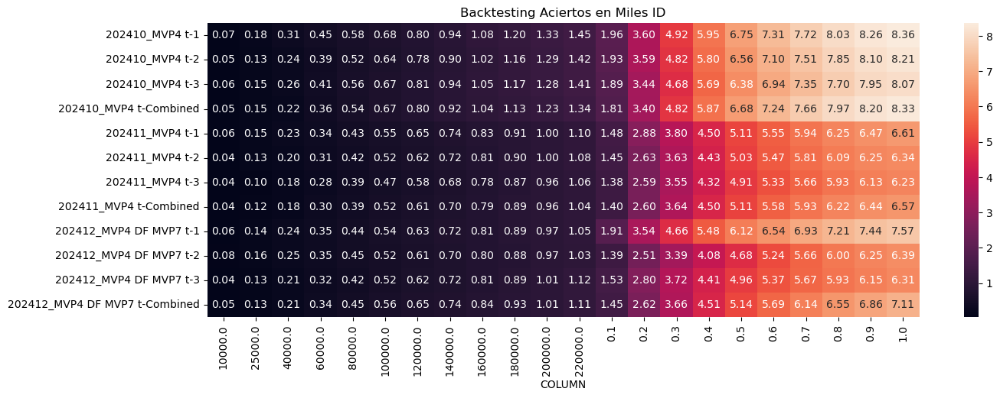

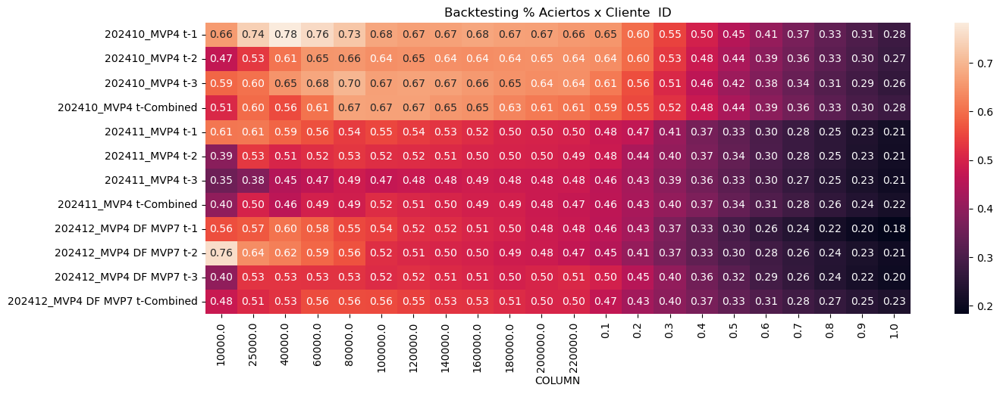

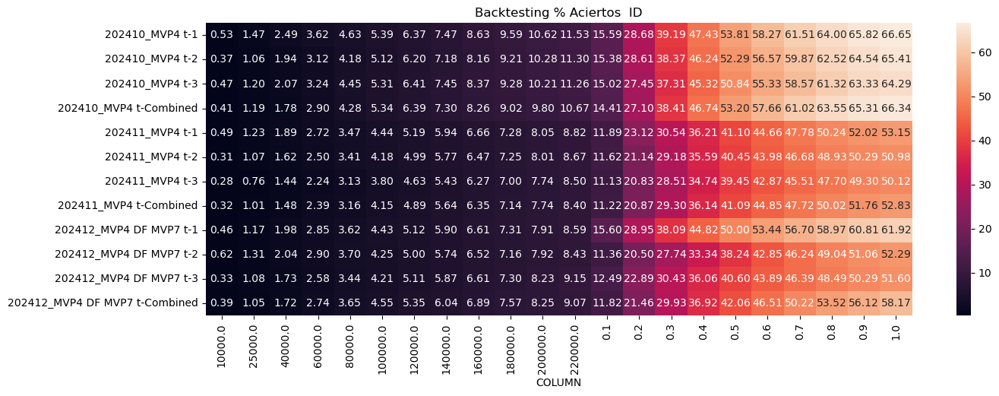

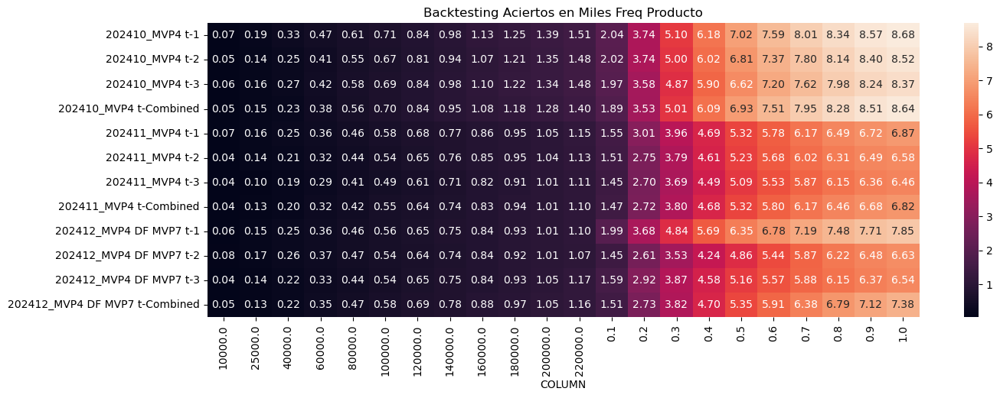

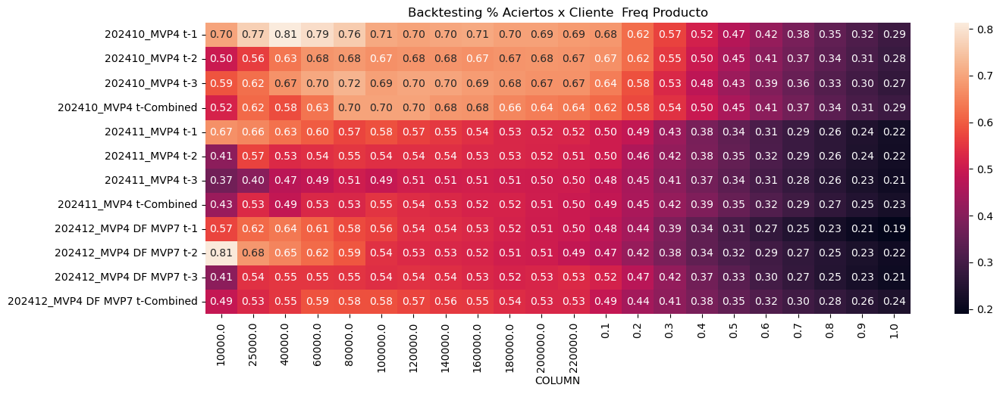

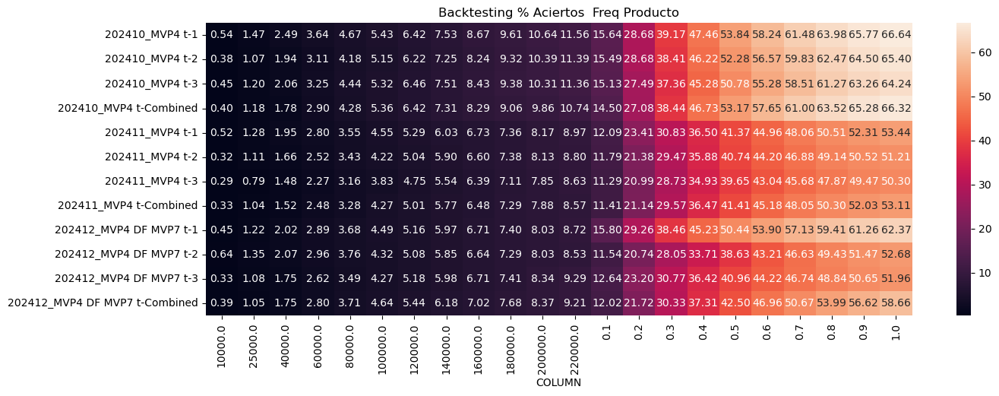

In [17]:
consolidacion_tipo = {}
for t,save_backtesting in enumerate(backtesting_all):
    for i in save_backtesting.keys():
        name = nametag_model[t]+' t-'+str(i)
        df_i = save_backtesting[i]['contactabilidad_curva']#.keys()
        df_i = df_i[~df_i['Aciertos'].isnull()]
        df_i = df_i.replace('Fabrica '+params['target'].split('_')[0],name)
        df_i = df_i[df_i['Modelo'] == name]
        for tipo in df_i['Tipo'].unique():
            df_ii = df_i[df_i['Tipo'] == tipo]
            df_ii = df_ii.set_index('COLUMN')
            if tipo not in consolidacion_tipo:
                consolidacion_tipo[tipo] = {'Aciertos': pd.DataFrame(),'% Aciertos x Cliente':pd.DataFrame(),'% Aciertos': pd.DataFrame()}
            for col in ['Aciertos','% Aciertos x Cliente','% Aciertos']:
                consolidacion_tipo[tipo][col] = pd.concat([consolidacion_tipo[tipo][col],df_ii[[col]].rename(columns = {col:name})], axis = 1)
print(consolidacion_tipo.keys())
import seaborn as sns
for col in list(consolidacion_tipo.keys()):
    for tipo in ['Aciertos','% Aciertos x Cliente','% Aciertos']:
        if tipo == 'Aciertos':
            graph = consolidacion_tipo[col][tipo].T/1000
            msj = f'Backtesting {tipo} en Miles {col}'
        else:
            graph = consolidacion_tipo[col][tipo].T
            msj = f'Backtesting {tipo}  {col}'
        plt.figure(figsize=(15,5))
        sns.heatmap(graph, annot = True, fmt= '0.02f')
        plt.title(msj)
        plt.show()

In [12]:
for t,save_backtesting in enumerate(backtesting_all):
    for i in save_backtesting.keys():
        name = nametag_model[t]+' t-'+str(i)
        print(name)
        res = save_backtesting[i]['ks']
        display(res)

202410_MVP4 t-1


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.53,82.99,300137,1957,0.65,23.40,10.0,13.40
1,9,0.82,1.53,300136,1642,0.55,43.03,20.0,23.03
2,8,0.58,0.82,300136,1319,0.44,58.80,30.0,28.80
3,7,0.44,0.58,300137,1035,0.34,71.17,40.0,31.17
4,6,0.36,0.44,300136,800,0.27,80.74,50.0,30.74
5,5,0.30,0.36,300136,560,0.19,87.43,60.0,27.43
6,4,0.25,0.30,300129,406,0.14,92.29,70.0,22.29
7,3,0.19,0.25,300144,313,0.10,96.03,80.0,16.03
8,2,0.13,0.19,300136,228,0.08,98.76,90.0,8.76
9,1,0.00,0.13,300137,104,0.03,100.00,100.0,0.00


202410_MVP4 t-2


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.53,83.00,301027,1930,0.64,23.51,10.0,13.51
1,9,0.82,1.53,301026,1661,0.55,43.74,20.0,23.74
2,8,0.58,0.82,301026,1224,0.41,58.66,30.0,28.66
3,7,0.45,0.58,301026,988,0.33,70.69,40.0,30.69
4,6,0.36,0.45,301026,760,0.25,79.95,50.0,29.95
5,5,0.30,0.36,301026,536,0.18,86.48,60.0,26.48
6,4,0.25,0.30,301026,415,0.14,91.53,70.0,21.53
7,3,0.20,0.25,301026,332,0.11,95.58,80.0,15.58
8,2,0.14,0.20,301026,254,0.08,98.67,90.0,8.67
9,1,0.00,0.14,301027,109,0.04,100.00,100.0,0.00


202410_MVP4 t-3


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.55,82.99,306616,1885,0.61,23.36,10.0,13.36
1,9,0.83,1.55,306616,1560,0.51,42.69,20.0,22.69
2,8,0.59,0.83,306616,1237,0.40,58.02,30.0,28.02
3,7,0.45,0.59,306615,1006,0.33,70.49,40.0,30.49
4,6,0.36,0.45,306616,693,0.23,79.08,50.0,29.08
5,5,0.30,0.36,306616,563,0.18,86.06,60.0,26.06
6,4,0.25,0.30,306615,407,0.13,91.10,70.0,21.10
7,3,0.20,0.25,306616,345,0.11,95.38,80.0,15.38
8,2,0.14,0.20,306616,252,0.08,98.50,90.0,8.50
9,1,0.00,0.14,306616,121,0.04,100.00,100.0,0.00


202410_MVP4 t-Combined


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,2.90,83.00,300116,1770,0.59,21.26,10.0,11.26
1,9,1.17,2.90,300115,1558,0.52,39.97,20.0,19.97
2,8,0.77,1.17,300116,1430,0.48,57.15,30.0,27.15
3,7,0.58,0.77,300115,1032,0.34,69.54,40.0,29.54
4,6,0.47,0.58,300115,824,0.27,79.44,50.0,29.44
5,5,0.39,0.47,300116,562,0.19,86.19,60.0,26.19
6,4,0.32,0.39,300066,435,0.14,91.41,70.0,21.41
7,3,0.27,0.32,300165,326,0.11,95.33,80.0,15.33
8,2,0.22,0.27,300115,212,0.07,97.87,90.0,7.87
9,1,0.15,0.22,300116,177,0.06,100.00,100.0,0.00


202411_MVP4 t-1


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.45,82.98,308088,1479,0.48,22.38,10.0,12.38
1,9,0.81,1.45,308088,1397,0.45,43.51,20.0,23.51
2,8,0.59,0.81,308088,922,0.30,57.46,30.0,27.46
3,7,0.48,0.59,308088,705,0.23,68.12,40.0,28.12
4,6,0.40,0.48,308087,609,0.20,77.34,50.0,27.34
5,5,0.34,0.40,308088,442,0.14,84.02,60.0,24.02
6,4,0.28,0.34,308088,389,0.13,89.91,70.0,19.91
7,3,0.23,0.28,308088,305,0.10,94.52,80.0,14.52
8,2,0.16,0.23,308088,222,0.07,97.88,90.0,7.88
9,1,0.00,0.16,308088,140,0.05,100.00,100.0,0.00


202411_MVP4 t-2


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.53,82.99,300137,1445,0.48,22.79,10.0,12.79
1,9,0.82,1.53,300136,1184,0.39,41.46,20.0,21.46
2,8,0.58,0.82,300136,1000,0.33,57.23,30.0,27.23
3,7,0.44,0.58,300137,797,0.27,69.80,40.0,29.80
4,6,0.36,0.44,300136,605,0.20,79.34,50.0,29.34
5,5,0.30,0.36,300136,439,0.15,86.26,60.0,26.26
6,4,0.25,0.30,300129,336,0.11,91.56,70.0,21.56
7,3,0.19,0.25,300144,280,0.09,95.98,80.0,15.98
8,2,0.13,0.19,300136,169,0.06,98.64,90.0,8.64
9,1,0.00,0.13,300137,86,0.03,100.00,100.0,0.00


202411_MVP4 t-3


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.53,83.00,301027,1384,0.46,22.20,10.0,12.20
1,9,0.82,1.53,301026,1207,0.40,41.57,20.0,21.57
2,8,0.58,0.82,301026,955,0.32,56.89,30.0,26.89
3,7,0.45,0.58,301026,775,0.26,69.32,40.0,29.32
4,6,0.36,0.45,301026,586,0.19,78.73,50.0,28.73
5,5,0.30,0.36,301026,425,0.14,85.54,60.0,25.54
6,4,0.25,0.30,301026,328,0.11,90.81,70.0,20.81
7,3,0.20,0.25,301026,273,0.09,95.19,80.0,15.19
8,2,0.14,0.20,301026,199,0.07,98.38,90.0,8.38
9,1,0.00,0.14,301027,101,0.03,100.00,100.0,0.00


202411_MVP4 t-Combined


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,2.99,83.00,300116,1392,0.46,21.19,10.0,11.19
1,9,1.18,2.99,300115,1197,0.40,39.41,20.0,19.41
2,8,0.79,1.18,300116,1046,0.35,55.33,30.0,25.33
3,7,0.61,0.79,300115,852,0.28,68.30,40.0,28.30
4,6,0.50,0.61,300115,615,0.20,77.66,50.0,27.66
5,5,0.42,0.50,300116,471,0.16,84.82,60.0,24.82
6,4,0.36,0.42,300115,361,0.12,90.32,70.0,20.32
7,3,0.30,0.36,300116,282,0.09,94.61,80.0,14.61
8,2,0.24,0.30,300115,218,0.07,97.93,90.0,7.93
9,1,0.17,0.24,300116,136,0.05,100.00,100.0,0.00


202412_MVP4 DF MVP7 t-1


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.40,83.01,414480,1908,0.46,25.19,10.0,15.19
1,9,0.77,1.40,414480,1632,0.39,46.75,20.0,26.75
2,8,0.57,0.77,414480,1118,0.27,61.51,30.0,31.51
3,7,0.46,0.57,414479,824,0.20,72.39,40.0,32.39
4,6,0.38,0.46,414480,633,0.15,80.75,50.0,30.75
5,5,0.32,0.38,414480,421,0.10,86.31,60.0,26.31
6,4,0.27,0.32,414479,398,0.10,91.56,70.0,21.56
7,3,0.21,0.27,414480,278,0.07,95.23,80.0,15.23
8,2,0.14,0.21,414480,225,0.05,98.20,90.0,8.20
9,1,0.00,0.14,414480,136,0.03,100.00,100.0,0.00


202412_MVP4 DF MVP7 t-2


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.37,82.81,308088,1389,0.45,21.72,10.0,11.72
1,9,0.92,1.37,308088,1118,0.36,39.20,20.0,19.20
2,8,0.72,0.92,308088,885,0.29,53.04,30.0,23.04
3,7,0.60,0.72,308088,685,0.22,63.75,40.0,23.75
4,6,0.51,0.60,308087,600,0.19,73.14,50.0,23.14
5,5,0.44,0.51,308087,563,0.18,81.94,60.0,21.94
6,4,0.37,0.44,308089,415,0.13,88.43,70.0,18.43
7,3,0.30,0.37,308088,343,0.11,93.79,80.0,13.79
8,2,0.21,0.30,308088,247,0.08,97.65,90.0,7.65
9,1,0.00,0.21,308088,150,0.05,100.00,100.0,0.00


202412_MVP4 DF MVP7 t-3


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,1.40,82.99,308346,1528,0.50,24.21,10.0,14.21
1,9,0.80,1.40,308346,1272,0.41,44.37,20.0,24.37
2,8,0.60,0.80,308346,922,0.30,58.98,30.0,28.98
3,7,0.48,0.60,308346,688,0.22,69.88,40.0,29.88
4,6,0.40,0.48,308346,555,0.18,78.67,50.0,28.67
5,5,0.34,0.40,308346,403,0.13,85.06,60.0,25.06
6,4,0.28,0.34,308346,306,0.10,89.91,70.0,19.91
7,3,0.23,0.28,308346,256,0.08,93.96,80.0,13.96
8,2,0.16,0.23,308346,221,0.07,97.46,90.0,7.46
9,1,0.00,0.16,308346,160,0.05,100.00,100.0,0.00


202412_MVP4 DF MVP7 t-Combined


,decil,prob_min,prob_max,total_clientes,total_aperturas,tasa_aperturas,cum_aperturas,cum_prob_esperadas,ks_stat
0,10,3.57,83.01,308088,1444,0.47,20.30,10.0,10.30
1,9,1.43,3.57,308088,1178,0.38,36.86,20.0,16.86
2,8,1.00,1.43,308088,1037,0.34,51.43,30.0,21.43
3,7,0.79,1.00,308087,854,0.28,63.44,40.0,23.44
4,6,0.67,0.79,308088,628,0.20,72.27,50.0,22.27
5,5,0.58,0.67,308088,545,0.18,79.93,60.0,19.93
6,4,0.51,0.58,308087,453,0.15,86.29,70.0,16.29
7,3,0.45,0.51,308084,404,0.13,91.97,80.0,11.97
8,2,0.40,0.45,308091,318,0.10,96.44,90.0,6.44
9,1,0.34,0.40,308089,253,0.08,100.00,100.0,0.00


In [13]:
wanted_metric = ['N all','N n_top','true_sum n_top','backtest_metric n_top','Precision n_top','recall n_top','f1-score n_top']
for t,save_backtesting in enumerate(backtesting_all):
    for i in save_backtesting.keys():
        name = nametag_model[t]+' t-'+str(i)
        print(name,'Top Metrics')
        res = save_backtesting[i]['metrics']
        display(res[(res["metric_name"].isin(wanted_metric))&(res["class_name"].isin(['1.0','1',1,1.0,'dim shape']))].drop('timestamp', axis=1))
        display(res[res["metric_name"].isin(['True negatives','True positives','False negatives','False positives'])])
        print('------------')

202410_MVP4 t-1 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,900409
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3001364
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.5529
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.5529
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,1.0996
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,4978


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
20,2025-01-17 23:24,TC,"Ensamble,",202410,True positives,overall metric,overall,8364.0
21,2025-01-17 23:24,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
22,2025-01-17 23:24,TC,"Ensamble,",202410,True negatives,overall metric,overall,208.0
23,2025-01-17 23:24,TC,"Ensamble,",202410,False positives,overall metric,overall,2920514.0


------------
202410_MVP4 t-2 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,903078
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3010262
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.545
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.545
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,1.0841
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,4922


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
20,2025-01-17 23:24,TC,"Ensamble,",202410,True positives,overall metric,overall,8209.0
21,2025-01-17 23:24,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
22,2025-01-17 23:24,TC,"Ensamble,",202410,True negatives,overall metric,overall,200.0
23,2025-01-17 23:24,TC,"Ensamble,",202410,False positives,overall metric,overall,2844316.0


------------
202410_MVP4 t-3 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,919847
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3066158
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.5357
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.5357
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,1.0658
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,4928


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
20,2025-01-17 23:24,TC,"Ensamble,",202410,True positives,overall metric,overall,8069.0
21,2025-01-17 23:24,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
22,2025-01-17 23:24,TC,"Ensamble,",202410,True negatives,overall metric,overall,208.0
23,2025-01-17 23:24,TC,"Ensamble,",202410,False positives,overall metric,overall,2763103.0


------------
202410_MVP4 t-Combined Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,900346
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3001155
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.551
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.551
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,1.096
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,4961


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-17 23:25,TC,"Ensamble,",202410,True positives,overall metric,overall,8326.0
19,2025-01-17 23:25,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
20,2025-01-17 23:25,TC,"Ensamble,",202410,True negatives,overall metric,overall,0.0
21,2025-01-17 23:25,TC,"Ensamble,",202410,False positives,overall metric,overall,2704897.0


------------
202411_MVP4 t-1 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,924263
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3080879
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.4157
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.4157
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,0.8279
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,3842


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-17 22:33,TC,"Ensamble,",202410,True positives,overall metric,overall,6610.0
19,2025-01-17 22:33,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
20,2025-01-17 22:33,TC,"Ensamble,",202410,True negatives,overall metric,overall,103.0
21,2025-01-17 22:33,TC,"Ensamble,",202410,False positives,overall metric,overall,2995704.0


------------
202411_MVP4 t-2 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,900409
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3001364
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.4138
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.4138
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,0.8242
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,3726


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
20,2025-01-17 22:33,TC,"Ensamble,",202410,True positives,overall metric,overall,6341.0
21,2025-01-17 22:33,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
22,2025-01-17 22:33,TC,"Ensamble,",202410,True negatives,overall metric,overall,203.0
23,2025-01-17 22:33,TC,"Ensamble,",202410,False positives,overall metric,overall,2848560.0


------------
202411_MVP4 t-3 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,903078
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3010262
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.4061
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.4061
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,0.8088
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,3667


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
20,2025-01-17 22:33,TC,"Ensamble,",202410,True positives,overall metric,overall,6233.0
21,2025-01-17 22:33,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
22,2025-01-17 22:33,TC,"Ensamble,",202410,True negatives,overall metric,overall,194.0
23,2025-01-17 22:33,TC,"Ensamble,",202410,False positives,overall metric,overall,2784320.0


------------
202411_MVP4 t-Combined Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202410,N n_top,n_top,1,900346
1,TC,"Ensamble,",202410,N all,dim shape,dim shape,3001155
2,TC,"Ensamble,",202410,backtest_metric n_top,n_top,1.0,0.4176
3,TC,"Ensamble,",202410,Precision n_top,n_top,1,0.4176
5,TC,"Ensamble,",202410,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202410,f1-score n_top,n_top,1,0.8318
9,TC,"Ensamble,",202410,true_sum n_top,n_top,1,3760


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-17 22:34,TC,"Ensamble,",202410,True positives,overall metric,overall,6570.0
19,2025-01-17 22:34,TC,"Ensamble,",202410,False negatives,overall metric,overall,0.0
20,2025-01-17 22:34,TC,"Ensamble,",202410,True negatives,overall metric,overall,0.0
21,2025-01-17 22:34,TC,"Ensamble,",202410,False positives,overall metric,overall,2790290.0


------------
202412_MVP4 DF MVP7 t-1 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202412,N n_top,n_top,1,4144798
1,TC,"Ensamble,",202412,N all,dim shape,dim shape,4144798
2,TC,"Ensamble,",202412,backtest_metric n_top,n_top,1.0,0.1864
3,TC,"Ensamble,",202412,Precision n_top,n_top,1,0.1864
5,TC,"Ensamble,",202412,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202412,f1-score n_top,n_top,1,0.3721
9,TC,"Ensamble,",202412,true_sum n_top,n_top,1,7573


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-28 19:42,TC,"Ensamble,",202412,True positives,overall metric,overall,7573.0
19,2025-01-28 19:42,TC,"Ensamble,",202412,False negatives,overall metric,overall,0.0
20,2025-01-28 19:42,TC,"Ensamble,",202412,True negatives,overall metric,overall,108.0
21,2025-01-28 19:42,TC,"Ensamble,",202412,False positives,overall metric,overall,4055217.0


------------
202412_MVP4 DF MVP7 t-2 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202412,N n_top,n_top,1,3080879
1,TC,"Ensamble,",202412,N all,dim shape,dim shape,3080879
2,TC,"Ensamble,",202412,backtest_metric n_top,n_top,1.0,0.2176
3,TC,"Ensamble,",202412,Precision n_top,n_top,1,0.2176
5,TC,"Ensamble,",202412,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202412,f1-score n_top,n_top,1,0.4343
9,TC,"Ensamble,",202412,true_sum n_top,n_top,1,6395


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-28 19:42,TC,"Ensamble,",202412,True positives,overall metric,overall,6395.0
19,2025-01-28 19:42,TC,"Ensamble,",202412,False negatives,overall metric,overall,0.0
20,2025-01-28 19:42,TC,"Ensamble,",202412,True negatives,overall metric,overall,2.0
21,2025-01-28 19:42,TC,"Ensamble,",202412,False positives,overall metric,overall,2932406.0


------------
202412_MVP4 DF MVP7 t-3 Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202412,N n_top,n_top,1,3083460
1,TC,"Ensamble,",202412,N all,dim shape,dim shape,3083460
2,TC,"Ensamble,",202412,backtest_metric n_top,n_top,1.0,0.2195
3,TC,"Ensamble,",202412,Precision n_top,n_top,1,0.2195
5,TC,"Ensamble,",202412,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202412,f1-score n_top,n_top,1,0.4381
9,TC,"Ensamble,",202412,true_sum n_top,n_top,1,6311


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-28 19:43,TC,"Ensamble,",202412,True positives,overall metric,overall,6311.0
19,2025-01-28 19:43,TC,"Ensamble,",202412,False negatives,overall metric,overall,0.0
20,2025-01-28 19:43,TC,"Ensamble,",202412,True negatives,overall metric,overall,86.0
21,2025-01-28 19:43,TC,"Ensamble,",202412,False positives,overall metric,overall,2868260.0


------------
202412_MVP4 DF MVP7 t-Combined Top Metrics


,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
0,TC,"Ensamble,",202412,N n_top,n_top,1,3080878
1,TC,"Ensamble,",202412,N all,dim shape,dim shape,3080878
2,TC,"Ensamble,",202412,backtest_metric n_top,n_top,1.0,0.2448
3,TC,"Ensamble,",202412,Precision n_top,n_top,1,0.2448
5,TC,"Ensamble,",202412,recall n_top,n_top,1,100.0
7,TC,"Ensamble,",202412,f1-score n_top,n_top,1,0.4884
9,TC,"Ensamble,",202412,true_sum n_top,n_top,1,7114


,timestamp,model_name,model_type,dataset_name,metric_name,metric_type,class_name,value
18,2025-01-28 19:43,TC,"Ensamble,",202412,True positives,overall metric,overall,7114.0
19,2025-01-28 19:43,TC,"Ensamble,",202412,False negatives,overall metric,overall,0.0
20,2025-01-28 19:43,TC,"Ensamble,",202412,True negatives,overall metric,overall,0.0
21,2025-01-28 19:43,TC,"Ensamble,",202412,False positives,overall metric,overall,2899104.0


------------
